In [1]:
# plotly를 이용하여 시각화한 그래프들은 본 파일을 실행하지 않으면 깨져서 안보일 수 있습니다

import pandas as pd
import numpy as np
import datetime
import time
from dateutil.relativedelta import relativedelta
from pykrx import stock
import re
import os
from collections import OrderedDict
import matplotlib.pyplot as plt, seaborn as sns
import warnings

# ML관련 모듈
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import xgboost as xgb


# Selenium import
import selenium
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.keys import Keys
from selenium.webdriver import ActionChains
import FinanceDataReader as fdr
%matplotlib inline

# 기본설정
pd.set_option('display.max_columns', 250)
warnings.filterwarnings('ignore')

# 연구목표 설정

- 패시브 자금이란, 패시브는 영어로 Passive 수동적인, 소극적인 이러한 뜻이다. 패시브 자금은 수동적이고 소극적인 자금을 의미한다. 투자자가 스스로 주식 종목이나 테마를 선택하지 않고 시장의 흐름에 맡기는 펀드에 투자하는 자금이다. 주요지수인 KOSPI. MSCI, S&P 500 등 흐름에 투자하는 인덱스 펀드에 투자하는 자금을 의미한다. 패시브 자금은 수동적인 투자자금이라 할 수 있는 것이다. 만약 어떤 종목이 위와 같은 지수에 편입되면 자동으로 추종하는 패시브자금이 몰려 기업의 편더멘탈이 변화하지 않더라도 주가가 상승하게 된다
<br>

- KOSPI200종목은 대한민국을 대표하는 지수이자 가장 추종 규모가 큰 지수이다. 따라서 편입/편출 종목에 대한 관심이 매 정기 편입떄마다 뜨겁다. 본 프로젝트에서는 코스피200종목과 주가정보들을 수집하여 이를 예측하는 것이 의미가 있는지 실효성을 확인하고 머신러닝 모델링을 통해 구축한 포트폴리오로 좋은 수익률 성과를 보일 수 있을지 시도해보고자 한다

# 데이터 수집파트

## KOSPI 200 종목 크롤링 파트

In [2]:
# 이 파트는 편입 전후 시점의 KOSPI200종목을 크롤링할때 사용한 함수들입니다. 
# 불안정할때가 있어서 일일히 크롤링하고 저장하는 방식으로 구축했기에 DB구축하는 코드는 첨부하지 않았습니다
# 하지만 구축한 KOSPI종목 목록 DB파일은 아래에서 불러와 사용합니다

def index_list_loading(date, index_name = '코스피 200'):
    """
    날짜(date) 와 지수명(index_name)을 입력하면 해당 날짜 해당 지수의 구성 종목을 크롤링하여 
    ordered dictionary로 반환하는 크롤러입니다
    
    input 
    - date = '20010101' 8자리 문자열 형태의 날짜
    - index_name = 코스피 200 등의 krx페이지의 지수 공식명칭
    output 
    - key : 종목코드, value : 종목명 형태의 ordered dictionary (순서는 시총 순)
    """
    
    #크롬 브라우저 실행
    driver = webdriver.Chrome("chromedriver") 
    driver.implicitly_wait(60)
    url = 'http://data.krx.co.kr/contents/MDC/MDI/mdiLoader/index.cmd?menuId=MDC0201'
    driver.get(url) #url 접속

    # 클릭 : 지수 - 주가지수 - 지수구성종목
    driver.find_element(By.XPATH, '//*[@id=\"jsMdiMenu\"]/div[4]/ul/li[1]/ul/li[2]/div/div[1]/ul/li[1]/a').click() 
    time.sleep(1)
    driver.find_element(By.XPATH, '//*[@id="jsMdiMenu"]/div[4]/ul/li[1]/ul/li[2]/div/div[1]/ul/li[1]/ul/li[1]').click()
    time.sleep(1)
    driver.find_element(By.XPATH, '//*[@id="jsMdiMenu"]/div[4]/ul/li[1]/ul/li[2]/div/div[1]/ul/li[1]/ul/li[1]/ul/li[6]/a' ).click()
    time.sleep(1)
    
    # 클릭 : 종목입력 - 날짜 입력
    search_date = driver.find_element(By.XPATH, '//*[@id="tboxindIdx_finder_equidx0_0"]' ) #종목 입력
    search_date.send_keys(Keys.CONTROL + "A")
    search_date.send_keys(index_name + Keys.ENTER) ; time.sleep(1)
    driver.find_element(By.XPATH, '//*[@id="jsGrid__finder_equidx0_0"]/tbody/tr[1]/td[1]').click()

    search_date = driver.find_element(By.XPATH, '//*[@id="trdDd"]' ) #날짜 입력
    search_date.send_keys(Keys.CONTROL + "A")
    search_date.send_keys(date)

    # 조회 버튼
    driver.find_element(By.XPATH, '//*[@id="jsSearchButton"]' ).click()
    time.sleep(1)
    
    # 조회 화면 블락지정
    block = driver.find_element(By.XPATH, '//*[@id="jsMdiContent"]/div/div[1]/div[1]/div[1]/div[2]/div')
    block_height = driver.execute_script("return arguments[0].scrollHeight", block)
    
    scroll_height = block_height #높이지정
    index_dict = OrderedDict() #출력 종목 목록 담을 순서사전

    while True:
        # display(block.text)
        # 종목 코드와 종목명 raw text에서 추출 후 order dixt에 추가
        try:
            temp = block.text.split() 
            codes = [code for code in temp if (True if re.match('[\d]{5}[\d\w]{1}',str(code)) else False)]
            for code in codes :index_dict[code] = '0' # 종목명 출력하기  stock.get_market_ticker_name(code)
        except : 
            print(len(block.text.split()))
            print(block.text.split())
            print('error')

        if driver.execute_script("return arguments[0].scrollTop + arguments[0].clientHeight >= arguments[0].scrollHeight", block):
            break # 스크롤을 끝까지 내렸다면 종료합니다.
        driver.execute_script(f"arguments[0].scrollTop += {500};", block) #  500픽셀?만큼 내리기, 타이트하게 하려면 550
        time.sleep(1) # 일정 시간 대기합니다.
        
        # 무거운 지수의 종목들을 가져올떄는 로딩시간때매 쉽지 않음 -> ex) 코스피, 대책 강구하기
    return list(index_dict.keys())

def in_and_out(dict1, dict2):
    try: #사전, 리스트 모두 처리 가능하게
        dict1 = dict1.keys() 
        dict2 = dict2.keys()
    except : 
        pass
    
    in_ = list(set(dict2) - set(dict1)) # 전기에 없는데 후기에 있으면 편입된 종목
    out_ = list(set(dict1) - set(dict2)) #후기에는 없는데 전기에 있으면 퇴출된 종목
    return {'in' : in_, 'out' : out_}

def get_period_opendays(period1, period2):
    last = stock.get_nearest_business_day_in_a_week(period2)
    period1 = stock.get_nearest_business_day_in_a_week(period1)
    days = [last]

    while True:
        start_str = period1
        start = datetime.datetime.strptime(start_str, "%Y%m%d") 
        
        if start_str == last : break
        elif start_str in days: pass
        else : 
            days.append(stock.get_nearest_business_day_in_a_week(start_str))
            time.sleep(0.5)

        start = (start + relativedelta(days = 1))
        period1 = start.strftime("%Y%m%d")
        
    return sorted(list(set(days)))

def in_out_log_data(period1, period2, method ='discrete'):
    inout_log = OrderedDict()
    if method == 'discrete':
        period1 = stock.get_nearest_business_day_in_a_week(period1) ;time.sleep(0.5)
        period2 = stock.get_nearest_business_day_in_a_week(period2)
        temp = [period1 , period2]
        days = temp
    else :
        days = get_period_opendays(period1, period2)
        days = sorted(days)
    print(days)
    
    for i in range(len(days)):
        if i+1 == len(days): break
        
        test1 = index_list_loading(days[i])
        test2 = index_list_loading(days[i+1])
        inout = in_and_out(test1,test2)
        
        if len(inout['in']) == 0 and len(inout['out']) == 0:
            continue
        else : inout_log[days[i]+"_"+days[i+1]] = inout
    return inout_log

# 아래와 같은 방식으로 날짜 2개를 입력하여 정기편입일을 탐색하여 정리하고
# in_out_log_data('20211209', '20211210') 

# 아래과 같은 방식으로 정기편입일 전일과 당일의 KOSPI200목록을 크롤링하여 날짜별로 Data를 정리하였습니다
# index_list_loading('20210611')

In [3]:
""" 구축한 정기편입일 전과 전입된 당일 날의 KOSPI200 목록 데이터들 """
files = os.listdir('./kospi200_data')
dates = [re.match('[\d]+',file)[0] for file in files]
print(files)

['20100610.csv', '20100611.csv', '20110609.csv', '20110610.csv', '20120614.csv', '20120615.csv', '20130613.csv', '20130614.csv', '20140612.csv', '20140613.csv', '20150611.csv', '20150612.csv', '20160609.csv', '20160610.csv', '20170608.csv', '20170609.csv', '20180614.csv', '20180615.csv', '20190613.csv', '20190614.csv', '20200611.csv', '20200612.csv', '20201210.csv', '20201211.csv', '20210609.csv', '20210610.csv', '20211209.csv', '20211210.csv', '20220609.csv', '20220610.csv', '20221208.csv', '20221209.csv']


## Kospi 조정종가 수집파일
- 아래의 코드는 문제 없이 돌아가지만 실행시간이 매우매우 길기 때문에 실행하지 않는 것을 권장드립니다

In [4]:
""" KOSPI 매일 조정 종가 데이터 : 2023년 6월 9일 장마감 기준 재구축하기 """
df_adj_close = pd.read_csv('df_adj_close.csv', index_col = 0,low_memory=False)
# datas = [df_adj_close]

# # 데이터 업데이트 체크용 함수
# def check_last():
#     last_day = None
#     flag = False
#     for data in datas:
#         t = data.iloc[:,-1].name
#         time = datetime.datetime.strptime(t, "%Y%m%d")
#         if (last_day == None) or last_day == time :
#             last_day = time
#             flag = True
#         else : 
#             continue
#     if flag == True : 
#         last_day_str = last_day.strftime("%Y%m%d")
#         print(f"데이터의 마지막 날은 {last_day_str}입니다")
#     else : 
#         print("데이터가 잘못되어 있습니다. 혹시 5개의 데이터의 마지막 날짜가 다른지 확인해보십시오")
#     return last_day_str

# # 가장 가까운 개장일 탐색 
# def fine_nearest_last():
#     y = datetime.datetime.today().year
#     m = datetime.datetime.today().month
#     d = datetime.datetime.today().day
#     nearest_last = datetime.date(y, m, d)
#     nearest_last_str = nearest_last.strftime("%Y%m%d")
#     nearest_last_str = stock.get_nearest_business_day_in_a_week(nearest_last_str)
#     print(f"현재 가장 가까운 개장일은 {nearest_last_str}입니다")
#     return nearest_last_str

# # 가장 가까운 개장일부터 데이터 마지막날까지 개장일들을 확인
# def lastday_list(last, near):
#     lasts = [near]
#     while(True):
#         if last == near : break
#         temp = datetime.datetime(int(near[:4]),int(near[4:6]),int(near[6:8])) - relativedelta(days = 1) ; time.sleep(0.5)
#         near = stock.get_nearest_business_day_in_a_week(temp.strftime("%Y%m%d"))
#         lasts.append(near)
#         print(near ,end = ' ')
#     return sorted(lasts)

# last = check_last()
# near = fine_nearest_last()
# lasts = lastday_list(last, near)

# if lasts[-1] > df_adj_close.columns[-1]:
#     new_adj_close = pd.DataFrame()
#     all_stock = list(df_adj_close.index.unique())
#     for i in all_stock:
#         time.sleep(1) ; print(i, end = " ")
#         try : temp = pd.DataFrame(stock.get_market_ohlcv(lasts[0], lasts[-1], i, adjusted=True)['종가'])
#         except : continue
#         temp.rename(columns = {'종가': i},inplace = True) ; temp = temp.T
#         new_adj_close = pd.concat([new_adj_close,temp], axis = 0)
#     D = dict()
#     change = new_adj_close.columns.tolist()
#     for i in range(len(change)):
#         D[change[i]] = datetime.datetime.strftime(change[i],"%Y%m%d")

#     new_adj_close.rename(columns = D, inplace = True)
#     new_adj_close = new_adj_close.iloc[:,1:]
#     df_adj_close = pd.concat([df_adj_close, new_adj_close], axis = 1)
print("-----------------------------------------------일별 조정 종가-----------------------------------------------")
display(df_adj_close)
# df_adj_close.to_csv("df_adj_close.csv")

-----------------------------------------------일별 조정 종가-----------------------------------------------


,20011130,20011203,20011204,20011205,20011206,20011207,20011210,20011211,20011212,20011213,20011214,20011217,20011218,20011219,20011220,20011221,20011224,20011226,20011227,20011228,20020102,20020103,20020104,20020107,20020108,20020109,20020110,20020111,20020114,20020115,20020116,20020117,20020118,20020121,20020122,20020123,20020124,20020125,20020128,20020129,20020130,20020131,20020201,20020204,20020205,20020206,20020207,20020208,20020214,20020215,20020218,20020219,20020220,20020221,20020222,20020225,20020226,20020227,20020228,20020304,20020305,20020306,20020307,20020308,20020311,20020312,20020313,20020314,20020315,20020318,20020319,20020320,20020321,20020322,20020325,20020326,20020327,20020328,20020329,20020401,20020402,20020403,20020404,20020408,20020409,20020410,20020411,20020412,20020415,20020416,20020417,20020418,20020419,20020422,20020423,20020424,20020425,20020426,20020429,20020430,20020502,20020503,20020506,20020507,20020508,20020509,20020510,20020513,20020514,20020515,20020516,20020517,20020520,20020521,20020522,20020523,20020524,20020527,20020528,20020529,20020530,20020531,20020603,20020604,20020605,...,20221207,20221208,20221209,20221212,20221213,20221214,20221215,20221216,20221219,20221220,20221221,20221222,20221223,20221226,20221227,20221228,20221229,20230102,20230103,20230104,20230105,20230106,20230109,20230110,20230111,20230112,20230113,20230116,20230117,20230118,20230119,20230120,20230125,20230126,20230127,20230130,20230131,20230201,20230202,20230203,20230206,20230207,20230208,20230209,20230210,20230213,20230214,20230215,20230216,20230217,20230220,20230221,20230222,20230223,20230224,20230227,20230228,20230302,20230303,20230306,20230307,20230308,20230309,20230310,20230313,20230314,20230315,20230316,20230317,20230320,20230321,20230322,20230323,20230324,20230327,20230328,20230329,20230330,20230331,20230403,20230404,20230405,20230406,20230407,20230410,20230411,20230412,20230413,20230414,20230417,20230418,20230419,20230420,20230421,20230424,20230425,20230426,20230427,20230428,20230502,20230503,20230504,20230508,20230509,20230510,20230511,20230512,20230515,20230516,20230517,20230518,20230519,20230522,20230523,20230524,20230525,20230526,20230530,20230531,20230601,20230602,20230605,20230607,20230608,20230609
005930,4360.0,4490.0,4600.0,5290.0,5500.0,5670.0,5200.0,5170.0,5400.0,5300.0,5100.0,5010.0,5210.0,5280.0,5300.0,5030.0,5050.0,5160.0,5400.0,5580.0,6160.0,6040.0,6380.0,6360.0,6230.0,6450.0,6160.0,6120.0,6600.0,6240.0,6030.0,6000.0,5920.0,5820.0,6000.0,6160.0,6200.0,6460.0,6370.0,6300.0,6060.0,6010.0,6180.0,6240.0,6460.0,6380.0,6300.0,6420.0,7100.0,6830.0,6860.0,6850.0,6800.0,6760.0,6670.0,6640.0,6740.0,7000.0,6860.0,7000.0,7220.0,7260.0,7120.0,6980.0,6970.0,7060.0,6960.0,6880.0,6600.0,6640.0,6980.0,6980.0,6830.0,7010.0,6800.0,6980.0,7270.0,7150.0,7360.0,7480.0,7970.0,8080.0,7780.0,7380.0,7380.0,7120.0,7190.0,7380.0,7700.0,7780.0,8120.0,8130.0,7920.0,8200.0,8540.0,8640.0,8260.0,8000.0,7620.0,7640.0,7590.0,7400.0,6960.0,7040.0,7250.0,7240.0,6680.0,6710.0,7160.0,7520.0,7400.0,7650.0,7400.0,7120.0,7400.0,7200.0,7320.0,7230.0,7390.0,7240.0,7100.0,6840.0,7020.0,7040.0,7110.0,...,58900.0,59200.0,60400.0,59500.0,59700.0,60500.0,59300.0,59500.0,59500.0,58600.0,58000.0,59100.0,58100.0,57900.0,58100.0,56600.0,55300.0,55500.0,55400.0,57800.0,58200.0,59000.0,60700.0,60400.0,60500.0,60500.0,60800.0,61100.0,61000.0,60400.0,61500.0,61800.0,63400.0,63900.0,64600.0,63300.0,61000.0,61800.0,63500.0,63800.0,61600.0,61900.0,63100.0,63000.0,62800.0,62900.0,63200.0,62200.0,63700.0,62600.0,62700.0,62100.0,61100.0,62000.0,61300.0,60500.0,60600.0,60800.0,60500.0,61500.0,60700.0,60300.0,60100.0,59500.0,60000.0,59000.0,59800.0,59900.0,61300.0,60200.0,60300.0,61100.0,62300.0,63000.0,62100.0,62900.0,62700.0,63200.0,64000.0,63100.0,63600.0,63900.0,62300.0,65000.0,65700.0,65900.0,66000.0,66100.0,65100.0,65300.0,65600.0,65500.0,65300.0,65700.0,65200.0,63600.0,64100.0,64600.0,65500.0,65700.0,65400.0,65100.0,65900.0,65300.0,64600.0,64200.0,64100.0,645

# 데이터 준비(가공 및 전처리)

## 날짜별 KOSPI200종목 전처리 

In [6]:
""" list_df => 칼럼에 편입전후일, 데이터는 각 일의 종목들"""
list_df = pd.DataFrame()
for i in range(len(files)):
    temp = pd.read_csv(f'./kospi200_data/{files[i]}',low_memory=False, encoding ='cp949')
    temp[f'{files[i].rstrip(".csv")}'] = temp['종목코드'].apply(lambda x : f'{x:06}')
    temp = temp[[f'{files[i].rstrip(".csv")}']]
    # display(temp)
    list_df = pd.concat([list_df, temp], axis = 1)

# 이형태로 함수에 들어가야 함 : 열 -> 편입일 , 원소 -> 티커
list_df.head(5)

,20100610,20100611,20110609,20110610,20120614,20120615,20130613,20130614,20140612,20140613,20150611,20150612,20160609,20160610,20170608,20170609,20180614,20180615,20190613,20190614,20200611,20200612,20201210,20201211,20210609,20210610,20211209,20211210,20220609,20220610,20221208,20221209
0,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930,005930
1,005490,005490,005380,005380,005380,005380,005380,005380,005380,005380,000660,000660,015760,015760,000660,000660,000660,000660,000660,000660,000660,000660,000660,000660,000660,000660,000660,000660,373220,373220,373220,373220
2,005380,005380,005490,005490,005490,005490,005490,005490,000660,000660,005380,005380,005380,005380,005380,005380,068270,068270,005380,005380,207940,207940,051910,051910,035420,035420,035420,035420,000660,000660,207940,000660
3,055550,015760,009540,012330,000270,000270,012330,012330,012330,012330,015760,015760,090430,012330,035420,035420,005490,005490,068270,068270,035420,068270,207940,207940,035720,035720,207940,207940,207940,207940,000660,207940
4,015760,055550,012330,009540,012330,012330,000270,000270,035420,035420,028260,028260,012330,090430,015760,015760,005380,005380,051910,051910,068270,035420,068270,068270,051910,051910,035720,035720,035420,035420,006400,006400


In [7]:
""" ks200inout => 편입일 : {IN : 편입종목 , OUT : 편출종목} """
def inout_stock(df): 
    in_out_dict = OrderedDict()
    for i in range(len(df.columns)):
        if i % 2 == 0:
            set1 = set(df.iloc[:, i].dropna().values) #짝수 인덱스는 편입 전 종목리스트
            set2 = set(df.iloc[:, i+1].dropna().values) #홀수 인덱스는 편입 후 종목리스트
            ins = list(set2 - set1) # 앞선 날짜에 없는데 뒤에 있으면 신규 편입된 종목
            outs = list(set1 - set2) # 앞선 날짜엔 있는데 뒤엔 없으면 퇴출된 종목
            in_out_dict[df.columns[i+1]] = {'in' : ins , 'out' : outs} # key를 편입날로
        else : pass
    return in_out_dict

# 사용 및 출력 예시
ks200inout = inout_stock(list_df)
ks200inout

OrderedDict([('20100611',
              {'in': ['108670',
                '103150',
                '004430',
                '086280',
                '103140',
                '011070',
                '104700',
                '003190',
                '032640',
                '103590'],
               'out': ['011930',
                '014990',
                '004890',
                '010780',
                '013570',
                '006840',
                '002990',
                '009440',
                '027970',
                '006390']}),
             ('20110610',
              {'in': ['002960',
                '073240',
                '088350',
                '052690',
                '017900',
                '005850',
                '003620',
                '010780',
                '071970',
                '000080',
                '010690',
                '020760',
                '013570',
                '034730',
                '007860',
               

In [8]:
""" 편입일 +-120개장일 전후로 주가 정보 불러오는 부분 """
def inout_annual_price(date, type = 'date'): # 진짜 날짜 별 전후 6개월
    if type == 'date':
        # 6개월 전 개장일(편입 시점 기준)
        ago6 = (datetime.datetime.strptime(date, "%Y%m%d") - relativedelta(months = 6)).strftime("%Y%m%d")
        ago6 = stock.get_nearest_business_day_in_a_week(ago6) ; time.sleep(0.5)

        # 6개월 후 개장일(편입 시점 기준)
        after6 = (datetime.datetime.strptime(date, "%Y%m%d") + relativedelta(months = 6)).strftime("%Y%m%d")
        after6 = stock.get_nearest_business_day_in_a_week(after6) ; time.sleep(0.5)
    elif type == 'plus_minus_120':
        # 20년 영업일 칼럼명으로 +- 6개월 영업일 계산
        date_list = df_adj_close.columns.tolist()
        idx = date_list.index(date)

        ago6 = date_list[idx-120]
        after6 = date_list[idx+120]
    
    # 1년간 편입 종목 매일 종가 데이터프레임(편입 시점 전후 6개월)
    in_df = df_adj_close.loc[ks200inout[date]['in']]   #행 인덱스에서 편입 종목 산출
    in_df = in_df.loc[:,ago6:after6]                   #열에서 기간만큼 탐색
    
    # 1년간 퇴출 종목 매일 종가 데이터프레임(편입 시점 전후 6개월)
    out_df = df_adj_close.loc[ks200inout[date]['out']] #행 인덱스에서 퇴출 종목 산출
    out_df = out_df.loc[:,ago6:after6]                 #열에서 기간만큼 탐색
    
    # 'plus_minus_120' 경우
    if type == 'plus_minus_120':
        # 편입 기준 영업일 차이를 나타내는 수로 칼럼명 변경
        in_df.columns = list(range(-120,121)) 
        out_df.columns = list(range(-120,121))
        # 구분을 위해 년도/월 열추가
        in_df['년도'] = int(date[:4]) ; in_df['월'] = int(date[4:6])
        out_df['년도'] = int(date[:4]) ; out_df['월'] = int(date[4:6])
    
    # 사전에 담아서 return
    inout_annual_price = {'in' : in_df, 'out' : out_df}
    return inout_annual_price

# 사용 및 출력 예시
display(inout_annual_price('20200612', type = 'date')['in'].head(2))
display(inout_annual_price('20200612', type = 'plus_minus_120')['in'].head(2))

,20191212,20191213,20191216,20191217,20191218,20191219,20191220,20191223,20191224,20191226,20191227,20191230,20200102,20200103,20200106,20200107,20200108,20200109,20200110,20200113,20200114,20200115,20200116,20200117,20200120,20200121,20200122,20200123,20200128,20200129,20200130,20200131,20200203,20200204,20200205,20200206,20200207,20200210,20200211,20200212,20200213,20200214,20200217,20200218,20200219,20200220,20200221,20200224,20200225,20200226,20200227,20200228,20200302,20200303,20200304,20200305,20200306,20200309,20200310,20200311,20200312,20200313,20200316,20200317,20200318,20200319,20200320,20200323,20200324,20200325,20200326,20200327,20200330,20200331,20200401,20200402,20200403,20200406,20200407,20200408,20200409,20200410,20200413,20200414,20200416,20200417,20200420,20200421,20200422,20200423,20200424,20200427,20200428,20200429,20200504,20200506,20200507,20200508,20200511,20200512,20200513,20200514,20200515,20200518,20200519,20200520,20200521,20200522,20200525,20200526,20200527,20200528,20200529,20200601,20200602,20200603,20200604,20200605,20200608,20200609,20200610,20200611,20200612,20200615,20200616,20200617,20200618,20200619,20200622,20200623,20200624,20200625,20200626,20200629,20200630,20200701,20200702,20200703,20200706,20200707,20200708,20200709,20200710,20200713,20200714,20200715,20200716,20200717,20200720,20200721,20200722,20200723,20200724,20200727,20200728,20200729,20200730,20200731,20200803,20200804,20200805,20200806,20200807,20200810,20200811,20200812,20200813,20200814,20200818,20200819,20200820,20200821,20200824,20200825,20200826,20200827,20200828,20200831,20200901,20200902,20200903,20200904,20200907,20200908,20200909,20200910,20200911,20200914,20200915,20200916,20200917,20200918,20200921,20200922,20200923,20200924,20200925,20200928,20200929,20201005,20201006,20201007,20201008,20201012,20201013,20201014,20201015,20201016,20201019,20201020,20201021,20201022,20201023,20201026,20201027,20201028,20201029,20201030,20201102,20201103,20201104,20201105,20201106,20201109,20201110,20201111,20201112,20201113,20201116,20201117,20201118,20201119,20201120,20201123,20201124,20201125,20201126,20201127,20201130,20201201,20201202,20201203,20201204,20201207,20201208,20201209,20201210,20201211
007700,55500.0,53250.0,53500.0,53250.0,52500.0,54750.0,55000.0,53500.0,53000.0,54250.0,56250.0,56000.0,58000.0,58750.0,58500.0,57000.0,55750.0,56750.0,60750.0,61750.0,58750.0,60250.0,59750.0,60250.0,56750.0,56500.0,57750.0,60000.0,51250.0,52000.0,50000.0,50750.0,55750.0,52750.0,51750.0,52500.0,51750.0,51500.0,53250.0,54500.0,53250.0,52500.0,54750.0,53250.0,53000.0,50500.0,49800.0,47100.0,50500.0,49250.0,48500.0,47300.0,46000.0,47900.0,49800.0,52750.0,53250.0,50500.0,51500.0,50000.0,48850.0,46850.0,46850.0,48450.0,47700.0,44050.0,45200.0,40050.0,44800.0,46500.0,48550.0,47700.0,46300.0,46300.0,45100.0,46050.0,46150.0,48250.0,47900.0,48250.0,49100.0,48350.0,48100.0,50500.0,52500.0,55750.0,56500.0,55500.0,57250.0,57000.0,55000.0,54750.0,54750.0,53500.0,54000.0,53750.0,54750.0,55000.0,52750.0,51250.0,51500.0,49950.0,51500.0,50750.0,50750.0,50750.0,49650.0,48400.0,48650.0,48650.0,50750.0,49100.0,49750.0,49500.0,49500.0,50500.0,50000.0,49650.0,51250.0,53500.0,54750.0,53500.0,51500.0,48500.0,48550.0,46500.0,45850.0,44250.0,41850.0,40850.0,41850.0,40700.0,44200.0,42500.0,46050.0,44400.0,45300.0,46250.0,44850.0,44300.0,45600.0,45750.0,44250.0,43750.0,42400.0,42950.0,43400.0,42550.0,42700.0,42350.0,42150.0,41800.0,41100.0,40450.0,40200.0,40450.0,40400.0,40800.0,40500.0,42350.0,45800.0,47050.0,46000.0,44600.0,48350.0,50250.0,48850.0,50500.0,47300.0,48700.0,47300.0,48350.0,49300.0,49000.0,48900.0,47500.0,47100.0,48250.0,47550.0,49600.0,49000.0,48150.0,47550.0,47250.0,45350.0,45100.0,45650.0,45350.0,45550.0,45100.0,43750.0,43550.0,42950.0,42400.0,43650.0,42550.0,41750.0,42800.0,44550.0,46300.0,45050.0,44550.0,46350.0,47700.0,47150.0,48700.0,47600.0,46800.0,50000.0,50250.0,50250.0,50250.0,49300.0,47300.0,46500.0,47900.0,45900.0,45450.0,46350.0,46050.0,

,-120,-119,-118,-117,-116,-115,-114,-113,-112,-111,-110,-109,-108,-107,-106,-105,-104,-103,-102,-101,-100,-99,-98,-97,-96,-95,-94,-93,-92,-91,-90,-89,-88,-87,-86,-85,-84,-83,-82,-81,-80,-79,-78,-77,-76,-75,-74,-73,-72,-71,-70,-69,-68,-67,-66,-65,-64,-63,-62,-61,-60,-59,-58,-57,-56,-55,-54,-53,-52,-51,-50,-49,-48,-47,-46,-45,-44,-43,-42,-41,-40,-39,-38,-37,-36,-35,-34,-33,-32,-31,-30,-29,-28,-27,-26,-25,-24,-23,-22,-21,-20,-19,-18,-17,-16,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,년도,월
007700,53500.0,53250.0,52500.0,54750.0,55000.0,53500.0,53000.0,54250.0,56250.0,56000.0,58000.0,58750.0,58500.0,57000.0,55750.0,56750.0,60750.0,61750.0,58750.0,60250.0,59750.0,60250.0,56750.0,56500.0,57750.0,60000.0,51250.0,52000.0,50000.0,50750.0,55750.0,52750.0,51750.0,52500.0,51750.0,51500.0,53250.0,54500.0,53250.0,52500.0,54750.0,53250.0,53000.0,50500.0,49800.0,47100.0,50500.0,49250.0,48500.0,47300.0,46000.0,47900.0,49800.0,52750.0,53250.0,50500.0,51500.0,50000.0,48850.0,46850.0,46850.0,48450.0,47700.0,44050.0,45200.0,40050.0,44800.0,46500.0,48550.0,47700.0,46300.0,46300.0,45100.0,46050.0,46150.0,48250.0,47900.0,48250.0,49100.0,48350.0,48100.0,50500.0,52500.0,55750.0,56500.0,55500.0,57250.0,57000.0,55000.0,54750.0,54750.0,53500.0,54000.0,53750.0,54750.0,55000.0,52750.0,51250.0,51500.0,49950.0,51500.0,50750.0,50750.0,50750.0,49650.0,48400.0,48650.0,48650.0,50750.0,49100.0,49750.0,49500.0,49500.0,50500.0,50000.0,49650.0,51250.0,53500.0,54750.0,53500.0,51500.0,48500.0,48550.0,46500.0,45850.0,44250.0,41850.0,40850.0,41850.0,40700.0,44200.0,42500.0,46050.0,44400.0,45300.0,46250.0,44850.0,44300.0,45600.0,45750.0,44250.0,43750.0,42400.0,42950.0,43400.0,42550.0,42700.0,42350.0,42150.0,41800.0,41100.0,40450.0,40200.0,40450.0,40400.0,40800.0,40500.0,42350.0,45800.0,47050.0,46000.0,44600.0,48350.0,50250.0,48850.0,50500.0,47300.0,48700.0,47300.0,48350.0,49300.0,49000.0,48900.0,47500.0,47100.0,48250.0,47550.0,49600.0,49000.0,48150.0,47550.0,47250.0,45350.0,45100.0,45650.0,45350.0,45550.0,45100.0,43750.0,43550.0,42950.0,42400.0,43650.0,42550.0,41750.0,42800.0,44550.0,46300.0,45050.0,44550.0,46350.0,47700.0,47150.0,48700.0,47600.0,46800.0,50000.0,50250.0,50250.0,50250.0,49300.0,47300.0,46500.0,47900.0,45900.0,45450.0,46350.0,46050.0,46000.0,46000.0,45150.0,46200.0,46600.0,48450.0,47900.0,46450.0,45750.0,45950.0,45650.0,45600.0,45950.0,43350.0,43750.0,43800.0,43300.0,42400.0,42600.0,43700.0,43750.0,43300.0,42600.0,2020,6
241590,16550.0,16150.0,15950.0,16750.0,16500.0,16250.0,16500.0,16800.0,16600.0,16950.0,16900.0,16750.0,16600.0,17250.0,17000.0,17000.0,17350.0,17650.0,17200.0,17200.0,16850.0,16600.0,16650.0,17000.0,16750.0,16550.0,15950.0,16200.0,15950.0,15800.0,15900.0,16750.0,16400.0,16450.0,17250.0,17450.0,17500.0,17450.0,16750.0,17050.0,16950.0,16850.0,18150.0,17950.0,17250.0,16750.0,16950.0,16450.0,15850.0,15000.0,15200.0,15450.0,15450.0,15450.0,14950.0,13750.0,13750.0,13650.0,12800.0,11500.0,10350.0,9710.0,10000.0,8500.0,9130.0,8150.0,8800.0,10200.0,10500.0,10600.0,10200.0,10850.0,10700.0,11400.0,12000.0,12250.0,12150.0,11600.0,12700.0,13050.0,11750.0,11900.0,11300.0,12300.0,12450.0,11900.0,12150.0,12200.0,11700.0,12050.0,11700.0,12550.0,12350.0,12500.0,12650.0,12900.0,12500.0,12550.0,12550.0,13400.0,12750.0,12650.0,13050.0,13050.0,12800.0,13550.0,13800.0,13800.0,14250.0,13850.0,15000.0,14650.0,14900.0,14500.0,14500.0,14650.0,14700.0,14800.0,14550.0,14200.0,13200.0,11750.0,12650.0,12650.0,12900.0,12450.0,12250.0,12000.0,12100.0,11550.0,11550.0,11100.0,11400.0,11200.0,11700.0,11750.0,11600.0,11600.0,11500.0,10950.0,10400.0,10600.0,10900.0,11150.0,10800.0,10950.0,10850.0,10750.0,

In [9]:
""" 모든 기간동안 정기편입/퇴출 종목들을 df으로 모아 편입일 전후 120일 동안의 수익률 변화량 데이터 프레임 생성 """
def join_inout_price(dict):
    # 빈 df 생성
    in_df_total = pd.DataFrame() 
    out_df_total = pd.DataFrame()
    
    for date in ks200inout.keys():
        # 편입df 편출df 가져오기
        try: 
            temp_in = inout_annual_price(date, type = 'plus_minus_120')['in']
            temp_out = inout_annual_price(date, type = 'plus_minus_120')['out']
            # 합치기
            in_df_total = pd.concat([in_df_total, temp_in], axis = 0)
            out_df_total = pd.concat([out_df_total, temp_out], axis = 0)
        except Exception as e:
            # 예외 발생 시 처리할 코드
            print(f"Error: {e.args[0]}. Traceback: {e}")
    
    # groupby로 그룹화 : index가 코유 티커 값이어서 mean해도 상관없음!
    in_df_total = in_df_total.reset_index().groupby(['년도','월','index']).mean() 
    out_df_total = out_df_total.reset_index().groupby(['년도','월','index']).mean()
    
    # 사전에 담아서 return
    join_inout_price = {'in' : in_df_total, 'out' : out_df_total}
    return join_inout_price

ks200inout = inout_stock(list_df)
result = join_inout_price(ks200inout)

total_in = result['in']
total_out = result['out']

display(total_in)
display(total_out)

-120      -119      -118      -117      -116      -115  \
년도   월  index                                                                
2010 6  003190    4730.0    4665.0    4575.0    4615.0    4435.0    4485.0   
        004430   12750.0   12850.0   12650.0   12650.0   12200.0   12500.0   
        011070   96875.0   96875.0   94938.0   96778.0   96681.0   96294.0   
        032640    8480.0    8470.0    8510.0    8460.0    8540.0    8270.0   
        086280  114000.0  111500.0  110000.0  110000.0  110000.0  110000.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  271940   59200.0   59900.0   60300.0   59900.0   56500.0   58600.0   
        300720   21850.0   22100.0   22950.0   22350.0   22950.0   22050.0   
        381970   40000.0   37800.0   36600.0   37800.0   35300.0   33400.0   
        383220  172600.0  173000.0  174000.0  178000.0  181400.0  179800.0   
     12 280360  113000.0  110500.0  113000.0  113000.0  110000.0  112500.0   

                    -114      -113      -112      -111      -110      -109  \
년도   월  index                                                                
2010 6  003190    4335.0    4610.0    4375.0    4360.0    4365.0    4545.0   
        004430   12200.0   12550.0   12200.0   12400.0   12900.0   12900.0   
        011070   94938.0   94356.0   92613.0   93291.0   96003.0   96778.0   
        032640    8200.0    8300.0    8750.0    8360.0    8490.0    8580.0   
        086280  109000.0  114000.0  112000.0  111000.0  113500.0  110500.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  271940   60500.0   59400.0   58200.0   58900.0   59800.0   53900.0   
        300720   22300.0   21700.0   21500.0   21000.0   20600.0   21200.0   
        381970   32400.0   33100.0   32550.0   32250.0   33000.0   33200.0   
        383220  177000.0  177000.0  176000.0  176000.0  179000.0  189400.0   
     12 280360  115500.0  116500.0  117500.0  119000.0  118500.0  118000.0   

                    -108      -107      -106      -105      -104      -103  \
년도   월  index                                                                
2010 6  003190    4685.0    5320.0    5210.0    5480.0    5490.0    5380.0   
        004430   12400.0   12450.0   12350.0   12100.0   12050.0   11900.0   
        011070  106078.0  107531.0  101234.0  104141.0  101719.0  106563.0   
        032640    8690.0    8970.0    8550.0    8790.0    8860.0    8780.0   
        086280  103500.0  102000.0  101500.0   99700.0   99600.0  101000.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  271940   54400.0   54500.0   54800.0   54600.0   53700.0   52200.0   
        300720   21100.0   21000.0   21000.0   22150.0   26000.0   25700.0   
        381970   33250.0   34100.0   32350.0   32500.0   30700.0   29650.0   
        383220  195800.0  189000.0  189000.0  183800.0  181800.0  174600.0   
     12 280360  119500.0  118000.0  117500.0  115500.0  112500.0  113000.0   

                    -102      -101      -100       -99       -98       -97  \
년도   월  index                                                                
2010 6  003190    5440.0    5470.0    6290.0    6240.0    5320.0    5430.0   
        004430   11500.0   11200.0   11600.0   11600.0   11650.0   11800.0   
        011070  106563.0  100266.0  101234.0  102688.0   96875.0   94066.0   
        032640    8730.0    8640.0    8640.0    8560.0    8540.0    9180.0   
        086280   99800.0   98200.0  101500.0  100500.0   98700.0   96100.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  271940   53000.0   51600.0   51900.0   54300.0   53200.0   51900.0   
        300720   21950.0   22000.0   22200.0   21350.0   21650.0   21000.0   
        381970   28950.0   28350.0   28300.0   33000.0   31000.0   31650.0   
        383220  181600.0  173200.0  176200.0  177400.0  181600.0  181600.0   
     12 280360  116500.0  115500.0  117

-120      -119      -118      -117      -116      -115  \
년도   월  index                                                                
2010 6  002990  326825.0  342593.0  333992.0  333992.0  326825.0  313924.0   
        004890   54500.0   59000.0   59500.0   57800.0   58000.0   58100.0   
        006390   71545.0   73662.0   75990.0   74720.0   75567.0   74509.0   
        006840   10456.0   10613.0   10769.0   10926.0   11145.0   11145.0   
        009440    7697.0    8349.0    8414.0    8211.0    8046.0    8074.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  006120   47000.0   47150.0   47200.0   47350.0   48650.0   47800.0   
        064960   46800.0   46400.0   45950.0   46250.0   46150.0   44050.0   
        079160   24750.0   24200.0   24100.0   23950.0   24500.0   23750.0   
        192400   19050.0   19050.0   18950.0   18950.0   19200.0   19350.0   
     12 000070   77000.0   73000.0   71800.0   71000.0   70800.0   74100.0   

                    -114      -113      -112      -111      -110      -109  \
년도   월  index                                                                
2010 6  002990  312491.0  316791.0  301023.0  280668.0  238812.0  203262.0   
        004890   58100.0   59800.0   59600.0   58200.0   60500.0   60000.0   
        006390   72392.0   73027.0   74297.0   75355.0   75567.0   75355.0   
        006840   10989.0   10675.0   10675.0   10394.0   10362.0   10331.0   
        009440    7779.0    7908.0    8000.0    8000.0    8000.0    8000.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  006120   47350.0   47100.0   47150.0   47250.0   47400.0   47600.0   
        064960   44100.0   44300.0   44600.0   47350.0   48400.0   49200.0   
        079160   23850.0   24500.0   24450.0   24600.0   24500.0   25100.0   
        192400   19050.0   19000.0   19000.0   19350.0   19350.0   19550.0   
     12 000070   74400.0   74900.0   73000.0   71300.0   70300.0   71200.0   

                    -108      -107      -106      -105      -104      -103  \
년도   월  index                                                                
2010 6  002990  172873.0  173733.0  180041.0  166566.0  141624.0  120409.0   
        004890   58900.0   59000.0   58100.0   58900.0   59600.0   60500.0   
        006390   73027.0   72604.0   69640.0   71334.0   71334.0   69852.0   
        006840   10206.0   10206.0   10300.0   10362.0   10394.0   10425.0   
        009440    8000.0    8000.0    8000.0    8000.0    8000.0    8000.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  006120   46850.0   46400.0   46350.0   46550.0   46750.0   46650.0   
        064960   48400.0   47050.0   48300.0   48000.0   47000.0   47200.0   
        079160   24950.0   25050.0   25150.0   24850.0   24350.0   24200.0   
        192400   19400.0   19150.0   18750.0   18550.0   18500.0   18300.0   
     12 000070   72300.0   70400.0   72800.0   73500.0   73500.0   71500.0   

                    -102      -101      -100       -99       -98       -97  \
년도   월  index                                                                
2010 6  002990  121986.0  123276.0  125570.0  141194.0  132880.0  141051.0   
        004890   59500.0   58700.0   55600.0   57500.0   57700.0   58500.0   
        006390   67947.0   67947.0   67947.0   67947.0   67947.0   64983.0   
        006840   10268.0   10143.0   10456.0   10675.0   10613.0   10582.0   
        009440    8000.0    8000.0    8000.0    8000.0    8000.0    8000.0   
...                  ...       ...       ...       ...       ...       ...   
2022 6  006120   46450.0   46000.0   46000.0   47050.0   46350.0   45600.0   
        064960   47700.0   47100.0   46300.0   47150.0   47200.0   46000.0   
        079160   24400.0   24150.0   24050.0   24550.0   24900.0   24350.0   
        192400   18650.0   18800.0   18550.0   18900.0   18800.0   18650.0   
     12 000070   73600.0   73100.0   71

## 이상치 확인 및 처리 시각화

In [10]:
# 상장 6개월도 안되어서 편입된 종목들
display(pd.DataFrame(total_in.T.isnull().sum()[total_in.T.isnull().sum()> 0]))

# 넷마블 , 하이브, HD현대중공업, 카카오페이 -> 신규 상장하고 6개월 내 편입
display(total_in.reset_index()[total_in.reset_index()['index'].\
                               isin(('251270', '352820', '329180','377300' ))])

0
년도   월  index      
2017 6  251270  101
2020 12 352820   79
2021 12 329180   65
        377300   93

,년도,월,index,-120,-119,-118,-117,-116,-115,-114,-113,-112,-111,-110,-109,-108,-107,-106,-105,-104,-103,-102,-101,-100,-99,-98,-97,-96,-95,-94,-93,-92,-91,-90,-89,-88,-87,-86,-85,-84,-83,-82,-81,-80,-79,-78,-77,-76,-75,-74,-73,-72,-71,-70,-69,-68,-67,-66,-65,-64,-63,-62,-61,-60,-59,-58,-57,-56,-55,-54,-53,-52,-51,-50,-49,-48,-47,-46,-45,-44,-43,-42,-41,-40,-39,-38,-37,-36,-35,-34,-33,-32,-31,-30,-29,-28,-27,-26,-25,-24,-23,-22,-21,-20,-19,-18,-17,-16,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120
90,2017,6,251270,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,162000.0,160000.0,156000.0,144000.0,148000.0,143500.0,140000.0,143500.0,145000.0,144000.0,142000.0,147000.0,149500.0,152000.0,151500.0,158500.0,161000.0,160500.0,153500.0,149000.0,141500.0,145500.0,143000.0,147500.0,152000.0,150500.0,153500.0,153000.0,151500.0,153500.0,152500.0,150000.0,149000.0,155000.0,155000.0,152500.0,152500.0,149500.0,148000.0,155000.0,151000.0,148500.0,145000.0,145000.0,145500.0,145500.0,145000.0,145000.0,148500.0,148000.0,149000.0,146500.0,146000.0,146000.0,144500.0,143000.0,141500.0,141500.0,136500.0,130500.0,134500.0,135500.0,134500.0,130500.0,127500.0,131000.0,136500.0,135500.0,138500.0,142500.0,144500.0,143500.0,155500.0,150000.0,148500.0,145500.0,152500.0,154500.0,154500.0,150000.0,150500.0,157000.0,158000.0,150500.0,150000.0,147000.0,149000.0,149500.0,150500.0,154500.0,154500.0,156500.0,156000.0,151500.0,150000.0,150000.0,149500.0,148000.0,151500.0,151500.0,152500.0,149000.0,162000.0,161000.0,169500.0,176500.0,173000.0,173500.0,171000.0,177000.0,175000.0,175500.0,177500.0,170500.0,174000.0,172000.0,177500.0,175000.0,186500.0,185500.0,184500.0,186000.0,189500.0,185500.0,186500.0,192500.0,191000.0,185000.0,183500.0,191000.0,185000.0,187500.0,188500.0,186000.0,178000.0,179000.0,169000.0,183000.0,186000.0,182500.0
118,2020,12,352820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,255420.0,198495.0,187110.0,180675.0,177210.0,178200.0,170775.0,154440.0,160875.0,156915.0,155430.0,140580.0,142065.0,150480.0,147510.0,162360.0,160380.0,161370.0,166320.0,162360.0,155925.0,158400.0,169785.0,177705.0,179685.0,178200.0,182655.0,178200.0,179190.0,172260.0,174240.0,176220.0,177705.0,179190.0,180180.0,187605.0,185625.0,178695.0,180180.0,178200.0,179685.0,178695.0,173745.0,170280.0,171270.0,159885.0,160380.0,156915.0,152955.0,151470.0,156420.0,154935.0,156915.0,158400.0,156420.0,156915.0,156915.0,155430.0,158895.0,152955.0,151965.0,166815.0,164340.0,155430.0,163845.0,171765.0,174240.0,171270.0,190575.0,201465.0,208395.0,205425.0,217800.0,202455.0,215325.0,230175.0,230175.0,239085.0,240570.0,243045.0,228690.0,229185.0,224235.0,245520.0,246510.0,239085.0,232155.0,224730.0,226215.0,208890.0,209880.0,204435.0,204930.0,210375.0,210870.0,205425.0,205920.0,198000.0,191070.0,209385.0,225720.0,215820.0,216810.0,228690.0,231660.0,223740.0,227700.0,219780.0,216810.0,233145.0,239580.0,234135.0,240075.0,240570.0,236610.0,240570.0,245520.0,256410.0,273240.0,264330.0,255420.0,249975.0,249975.0

In [11]:
# 상장 6개월도 안되어서 퇴출된 종목들
display(pd.DataFrame(total_out.T.isnull().sum()[total_out.T.isnull().sum()> 0]))

# 대구은행 -> DGB금융지주 : 상장 3일만에 대구은행이 KOSPI200에서 퇴출당했음
# DGB금융지주는 자회사의 주식이전방식으로 설립된 금융지주회사
# 대구은행과 카드넷, 대구신용정보 등 3개 자회사를 소유하고 있었음.
display(total_out.reset_index()[total_out.reset_index()['index'] == '139130'])

,,,0
년도,월,index,
2011,6,139130,117


,년도,월,index,-120,-119,-118,-117,-116,-115,-114,-113,-112,-111,-110,-109,-108,-107,-106,-105,-104,-103,-102,-101,-100,-99,-98,-97,-96,-95,-94,-93,-92,-91,-90,-89,-88,-87,-86,-85,-84,-83,-82,-81,-80,-79,-78,-77,-76,-75,-74,-73,-72,-71,-70,-69,-68,-67,-66,-65,-64,-63,-62,-61,-60,-59,-58,-57,-56,-55,-54,-53,-52,-51,-50,-49,-48,-47,-46,-45,-44,-43,-42,-41,-40,-39,-38,-37,-36,-35,-34,-33,-32,-31,-30,-29,-28,-27,-26,-25,-24,-23,-22,-21,-20,-19,-18,-17,-16,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120
29,2011,6,139130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16294.0,15523.0,14751.0,15523.0,15185.0,15330.0,15282.0,15571.0,15089.0,15185.0,15378.0,14848.0,15137.0,15378.0,15233.0,15137.0,15523.0,15619.0,15571.0,15860.0,15860.0,15908.0,16101.0,16101.0,16101.0,15716.0,15571.0,15330.0,15426.0,15475.0,15475.0,15764.0,15957.0,16198.0,16198.0,16101.0,15908.0,16005.0,16101.0,16198.0,16246.0,16294.0,16005.0,15716.0,15233.0,13594.0,15233.0,14559.0,13980.0,14703.0,14655.0,15282.0,14655.0,13884.0,13932.0,13305.0,13498.0,13787.0,14221.0,14414.0,14944.0,15619.0,15812.0,14896.0,14076.0,14173.0,14366.0,14414.0,13305.0,12871.0,13739.0,13594.0,13643.0,14173.0,13546.0,12823.0,12148.0,12582.0,13161.0,13498.0,13450.0,12437.0,12196.0,12727.0,12968.0,13161.0,12727.0,12678.0,12920.0,12775.0,12727.0,12727.0,12775.0,12968.0,12727.0,13112.0,13016.0,12823.0,13112.0,13402.0,13450.0,13498.0,13498.0,13016.0,13691.0,13739.0,13691.0,13739.0,13064.0,13209.0,13112.0,12823.0,13064.0,12968.0,12534.0,12148.0,12148.0,12052.0,11955.0,12534.0,12389.0,12341.0,12437.0,12341.0


- 이상치 수익률 제거 
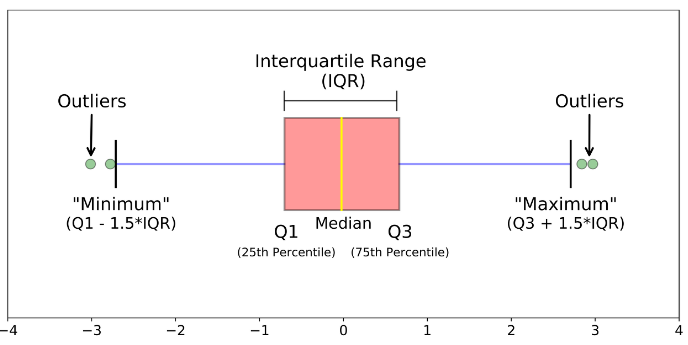

In [12]:
# 편입/편출 종목의 수익률을 아래와 같이 구분함
total_in_ret = total_in.apply(np.log).diff(periods=1, axis=1).fillna(1).cumsum(axis = 1)
total_out_ret = total_out.apply(np.log).diff(periods=1, axis=1).fillna(1).cumsum(axis = 1)

total_in_ret.columns = [str(i) for i in total_in_ret.columns]
total_out_ret.columns = [str(i) for i in total_out_ret.columns]

# 이상치를 IQR방식 처리하는 함수
def remove_outliers(df, column, threshold=1.5):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_limit = q1 - threshold * iqr
    upper_limit = q3 + threshold * iqr
    outliers = df[(df[column] < lower_limit) | (df[column] > upper_limit)]
    df = df.drop(outliers.index)
    return df

# 수익률이 과도한 경우들이 있어 IQR 이상치를 제거한 버전
total_in_ret2 = remove_outliers(total_in_ret , '120')
total_out_ret2 = remove_outliers(total_out_ret , '120')

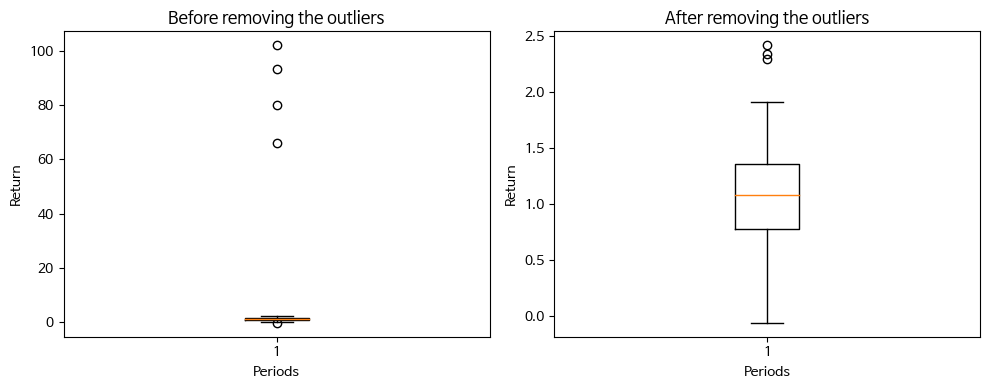

In [13]:
# 편일 종목 이상치 제거 시각화
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

# 이상치 제거 X : 박스 플롯 그리기
axs[0].boxplot(total_in_ret['120'])
axs[0].set_xlabel('Periods')
axs[0].set_ylabel('Return')
axs[0].set_title('Before removing the outliers')

# 이상치 제거 O : 박스 플롯 그리기
axs[1].boxplot(total_in_ret2['120'])
axs[1].set_xlabel('Periods')
axs[1].set_ylabel('Return')
axs[1].set_title('After removing the outliers')

# 그래프 간 간격 조정
plt.tight_layout()

# 그래프 출력
plt.show()

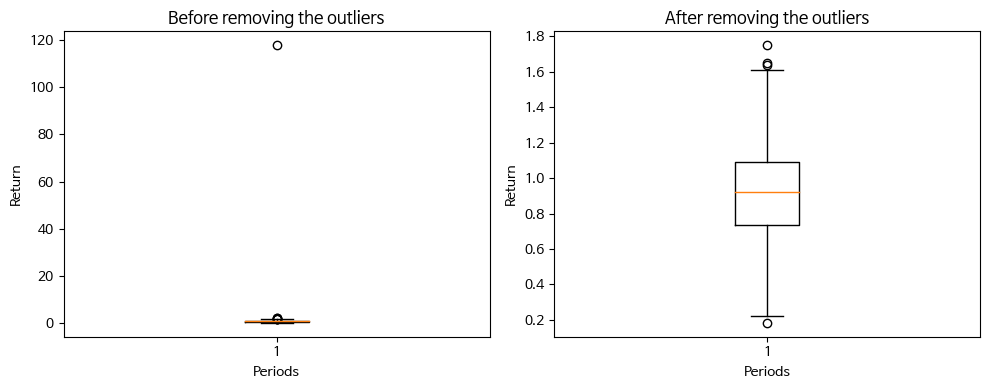

In [14]:
# 편출 종목 이상치 제거 시각화
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

# 이상치 제거 X : 박스 플롯 그리기
axs[0].boxplot(total_out_ret['120'])
axs[0].set_xlabel('Periods')
axs[0].set_ylabel('Return')
axs[0].set_title('Before removing the outliers')

# 이상치 제거 O : 박스 플롯 그리기
axs[1].boxplot(total_out_ret2['120'])
axs[1].set_xlabel('Periods')
axs[1].set_ylabel('Return')
axs[1].set_title('After removing the outliers')

# 그래프 간 간격 조정
plt.tight_layout()

# 그래프 출력
plt.show()

# 데이터 탐색/시각화(EDA)

## 편입/편출 종목의 수익률 변동 파악 시각화
- 매수와 공매도를 했을때 어느시점에 해야하는 지 대략적인 파악이 됨

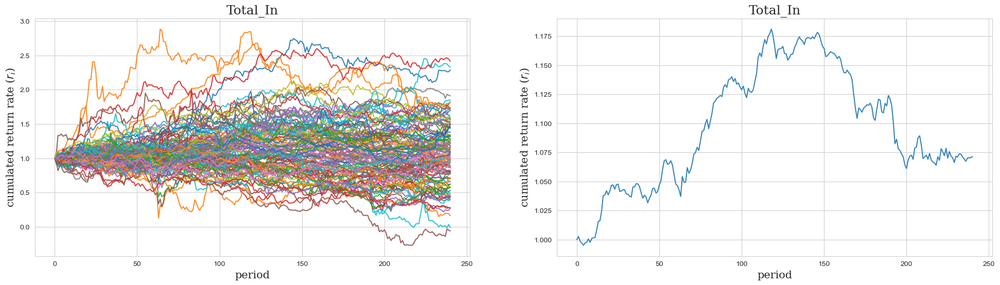

In [15]:
# 편입 종목의 수익률 변동 시각화 : 왼쪽은 전 종목, 오른쪽은 평균

sns.set_style('whitegrid')
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

for i in total_in_ret2.index:
    axs[0].plot(total_in_ret2[total_in_ret2.index == i].values.tolist()[0], alpha = 0.9)
axs[0].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[0].set_ylabel(r'cumulated return rate ($r_i$)', fontsize = 15, fontfamily = 'Serif')
axs[0].set_title('Total_In', fontsize = 18, fontfamily = 'Serif')

axs[1].plot(total_in_ret2.mean(axis = 0).values.tolist(), alpha = 0.9)
axs[1].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[1].set_ylabel(r'cumulated return rate ($r_i$)', fontsize = 15, fontfamily = 'Serif')
axs[1].set_title('Total_In', fontsize = 18, fontfamily = 'Serif')

plt.show()

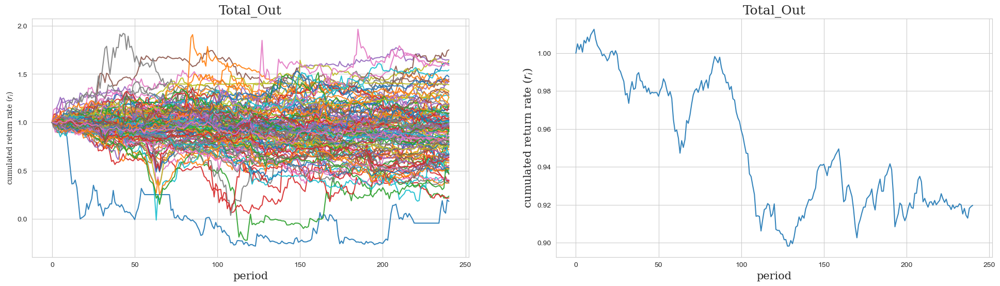

In [16]:
# 편출 종목의 수익률 변동 시각화 : 왼쪽은 전 종목, 오른쪽은 평균

sns.set_style('whitegrid')
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

for i in total_out_ret2.index:
    axs[0].plot(total_out_ret2[total_out_ret2.index == i].values.tolist()[0], alpha = 0.9)
axs[0].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[0].set_ylabel(r'cumulated return rate ($r_i$)', fontfamily = 'Serif')
axs[0].set_title('Total_Out', fontsize = 18, fontfamily = 'Serif')

axs[1].plot(total_out_ret2.mean(axis = 0).values.tolist(), alpha = 0.9)
axs[1].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[1].set_ylabel(r'cumulated return rate ($r_i$)', fontsize = 15, fontfamily = 'Serif')
axs[1].set_title('Total_Out', fontsize = 18, fontfamily = 'Serif')

plt.show()

## 효과적 매수 매도 시점 선택 시각화

In [17]:
# 매수 매도 시점별 수익률 계산하는 함수
def ret(df ,time1, time2, type = 'ret'):
    temp_df = df[[time1, time2]]
    temp_df['ret'] = (temp_df[time2] - temp_df[time1]) / temp_df[time1]
    if type == 'df' : return temp_df
    
    ret = temp_df.mean(axis = 0)['ret']
    if type == 'ret' : return ret

# 출력 예시 
display(ret(total_in, 0 ,120, type = 'df').head(2))
display(ret(total_in, 0 ,120, type = 'ret'))

0      120       ret
년도   월 index                             
2010 6 003190   4480.0   2960.0 -0.339286
       004430  10800.0  12200.0  0.129630

-0.04703150600655062

In [18]:
# 위의 함수를 이용하여 정보 정리하는 함수
def summary(time1, time2, is_print = True):
    if is_print :
        print(f'in_ret : {ret(total_in, time1 ,time2)}')
        print(f'out_ret : {ret(total_out, time1 ,time2)}')
        print(f'total_ret : {ret(total_in, time1 ,time2) - ret(total_out, time1 ,time2)}')
    # print(time1, time2)
    return ret(total_in, time1 ,time2) - ret(total_out, time1 ,time2)
# 예시 출력
summary(0,120)

in_ret : -0.04703150600655062
out_ret : 0.059020546542476654
total_ret : -0.10605205254902728


-0.10605205254902728

In [19]:
ret_list = {summary(i,j, is_print = False) : (i,j) for i in range(-120,121) for j in range(i+1, 121)}
ret_list  # 사전 형태로 저장, len(ret_list) ->  28920

{-0.0018426259251883978: (-120, -119),
 -0.002945490351573353: (-120, -118),
 -0.00825165061319698: (-120, -117),
 -0.005393198524596738: (-120, -116),
 -0.00997835425555919: (-120, -115),
 -0.007097898553666967: (-120, -114),
 -0.007191898289492121: (-120, -113),
 -0.007552586991362723: (-120, -112),
 -0.007268399459655697: (-120, -111),
 -0.008122336175788905: (-120, -110),
 -0.010027752506448682: (-120, -109),
 0.0025594367129457164: (-120, -108),
 0.013371067576558638: (-120, -107),
 0.01579578657545399: (-120, -106),
 0.025541018927009322: (-120, -105),
 0.04323218562590224: (-120, -104),
 0.04171696842543731: (-120, -103),
 0.04782833842691048: (-120, -102),
 0.048255008997947095: (-120, -101),
 0.048631711102733: (-120, -100),
 0.054578595701509365: (-120, -99),
 0.0537783361267557: (-120, -98),
 0.056289560954986426: (-120, -97),
 0.05854987542505317: (-120, -96),
 0.059316590226661074: (-120, -95),
 0.05644299823606664: (-120, -94),
 0.05848137160739052: (-120, -93),
 0.061084

In [20]:
len(ret_list)

28920

In [21]:
mx = max(list(ret_list.keys())) ; print(mx) #key값(양방향 수익률) 중 최대 값 탐색
print(ret_list[mx]) # key가 최대인 것의 value값

0.3459448756648684
(-117, -2)


In [22]:
# 데이터 프레임화 : 매수 매도 보유 기간 수익률 정보를 담음
ret_df = pd.DataFrame(ret_list).T.reset_index()
ret_df.columns = ['ret','buy_time','sell_time']
ret_df['period'] = abs(ret_df['sell_time'] - ret_df['buy_time'])
ret_df

,ret,buy_time,sell_time,period
0,-0.001843,-120,-119,1
1,-0.002945,-120,-118,2
2,-0.008252,-120,-117,3
3,-0.005393,-120,-116,4
4,-0.009978,-120,-115,5
...,...,...,...,...
28915,-0.005944,117,119,2
28916,-0.005738,117,120,3
28917,-0.002204,118,119,1
28918,-0.001988,118,120,2


In [23]:
# 1년간 약 241 영업일의 매수타이밍, 매도타이밍, 보유 기간에 따른 수익률 시각화
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# 1행 3열 서브플롯 생성
fig = make_subplots(rows=3, cols=1, subplot_titles=("buy_time", "sell_time", "period"))

# 각 서브플롯에 scatter 그래프 추가
fig.add_trace(px.scatter(ret_df, x='buy_time', y='ret', color='period').data[0], row=1, col=1)
fig.add_trace(px.scatter(ret_df, x="sell_time", y="ret", color="period").data[0], row=2, col=1)
fig.add_trace(px.scatter(ret_df, x="period", y="ret", color="period").data[0], row=3, col=1)

# 그래프의 크기 설정
fig.update_layout(
    width=1000, height=1000,

    xaxis1_title='period',
    xaxis2_title='period',
    xaxis3_title='period',
    
    yaxis1_title='return',
    yaxis2_title='return',
    yaxis3_title='return',

    xaxis1_rangeslider_visible=False,
    xaxis2_rangeslider_visible=False,    
    xaxis3_rangeslider_visible=False
)
    
fig.show()

In [24]:
# 5영업일 (약 1주)로 묶는 과정
def divide_integers(start, end, interval):
    intervals = []
    i = start
    while i < end:
        intervals.append((i, i+interval))
        i += interval
    return intervals

intervals = divide_integers(-120, 120, 5)
classify_dict = {range(i , j) if i<0 else  range(i+1 , j+1) : (i//5) if i<0 else (i//5+1) for i, j in intervals}
classify_dict = {i:label for rng, label in classify_dict.items() for i in rng}

classify_dict[0] = 0
ret_df['week_buy_time'] = ret_df['buy_time'].apply(lambda x: classify_dict[x])
ret_df['week_sell_time'] = ret_df['sell_time'].apply(lambda x: classify_dict[x])

In [25]:
# 1년간 약 매 주별(5영업일)의 매수타이밍, 매도타이밍, 보유 기간에 따른 수익률 시각화
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1행 2열 서브플롯 생성
fig = make_subplots(rows=1, cols=2,subplot_titles=("buy_time(week)", "sell_time(week)"))

# 첫 번째 열의 막대 차트 생성 및 서브플롯에 추가
bar_chart1 = go.Bar(x=ret_df.groupby('week_buy_time')[['ret']].mean()['ret'].index, 
                    y=ret_df.groupby('week_buy_time')[['ret']].mean()['ret'].values)
fig.add_trace(bar_chart1, row=1, col=1)

# 두 번째 열의 막대 차트 생성 및 서브플롯에 추가
bar_chart2 = go.Bar(x=ret_df.groupby('week_sell_time')[['ret']].mean()['ret'].index, 
                    y=ret_df.groupby('week_sell_time')[['ret']].mean()['ret'].values)
fig.add_trace(bar_chart2, row=1, col=2)

# 그래프 레이아웃 설정
fig.update_layout(
    width=1000, height=400,

    xaxis1_title='period',
    xaxis2_title='period',
    
    yaxis1_title='return',
    yaxis2_title='return',

    xaxis1_rangeslider_visible=False,
    xaxis2_rangeslider_visible=False
)

# 그래프 표시
fig.show()

- 그래서 결국 일찍 살수록 좋고 (특히 정기변경일 22~24주 전에 예측을 하면 드라마틱함) 
- 변경 1주 전에 판매하는 것이 가장 바람직함을 알 수 있었습니다
- 따라서 수익창출을 2가지 방법으로 생각해볼 수 있습니다
    1. 편입 편출 종목을 예측하여 편출일 1영업일전에 판매하여 수익을 내고
    2. 편입 편출일 이후에 역으로 편출 종목을 매수하고 편입 종목을 공매도하여 20주 정도에 정리하는 것이 가장 좋은 전략임

추가로 편입 영향도에 대해 보자

In [26]:
total_in_ret3 = total_in_ret2.reset_index().groupby(['년도','월']).mean()
total_out_ret3 = total_out_ret2.reset_index().groupby(['년도','월']).mean()

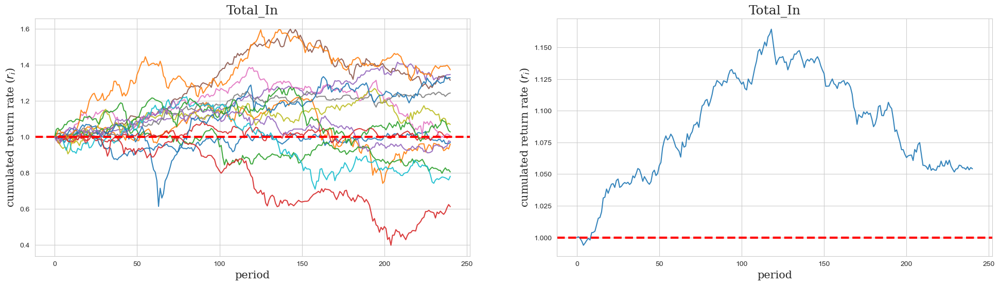

In [27]:
sns.set_style('whitegrid')
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

for i in total_in_ret3.index:
    axs[0].plot(total_in_ret3[total_in_ret3.index == i].values.tolist()[0], alpha = 0.9)
axs[0].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[0].set_ylabel(r'cumulated return rate ($r_i$)', fontsize = 15, fontfamily = 'Serif')
axs[0].set_title('Total_In', fontsize = 18, fontfamily = 'Serif')

axs[1].plot(total_in_ret3.mean(axis = 0).values.tolist(), alpha = 0.9)
axs[1].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[1].set_ylabel(r'cumulated return rate ($r_i$)', fontsize = 15, fontfamily = 'Serif')
axs[1].set_title('Total_In', fontsize = 18, fontfamily = 'Serif')

# 수평선 추가
axs[0].axhline(y=1, color='red', linestyle='--', linewidth=3)
axs[1].axhline(y=1, color='red', linestyle='--', linewidth=3)

plt.show()

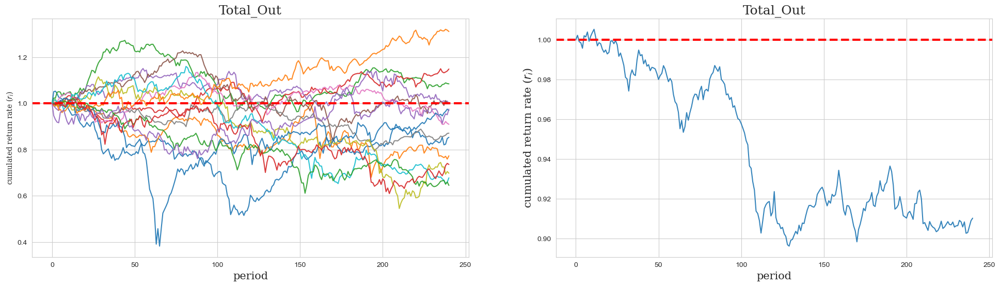

In [28]:
sns.set_style('whitegrid')
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

for i in total_out_ret3.index:
    axs[0].plot(total_out_ret3[total_out_ret3.index == i].values.tolist()[0], alpha = 0.9)
axs[0].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[0].set_ylabel(r'cumulated return rate ($r_i$)', fontfamily = 'Serif')
axs[0].set_title('Total_Out', fontsize = 18, fontfamily = 'Serif')

axs[1].plot(total_out_ret3.mean(axis = 0).values.tolist(), alpha = 0.9)
axs[1].set_xlabel('period', fontsize = 15, fontfamily = 'Serif')
axs[1].set_ylabel(r'cumulated return rate ($r_i$)', fontsize = 15, fontfamily = 'Serif')
axs[1].set_title('Total_Out', fontsize = 18, fontfamily = 'Serif')

# 수평선 추가
axs[0].axhline(y=1, color='red', linestyle='--', linewidth=3)
axs[1].axhline(y=1, color='red', linestyle='--', linewidth=3)

plt.show()

그래서 1주전(5영업일 전) 에 판매한다고 했을때
- 아래와 같음
- 시간이 지남에 따라 편입 편출에 대한 관심이 높아지거나 낮아지거나 예측력이 올라가면서 예측 수익률에 변동이 있지 않을까 확인해보았지만 시각화상으로 별 특징은 없어보임 -> 즉 지금도 예측을 시도할만한 가치가 없진 않음

In [29]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# 1행 2열 서브플롯 생성
fig = make_subplots(rows=1, cols=2,subplot_titles=("buy_time(week)", "sell_time(week)"))

# 첫 번째 열의 막대 차트 생성 및 서브플롯에 추가
bar_chart1 = go.Bar(x=[str(i) +'_'+ str(j) for i,j in total_in_ret3['-5'].index], 
                    y=total_in_ret3['-5'].values)
fig.add_trace(bar_chart1, row=1, col=1)

# 두 번째 열의 막대 차트 생성 및 서브플롯에 추가
bar_chart2 = go.Bar(x=[str(i) +'_'+ str(j) for i,j in total_out_ret3['-5'].index], 
                    y=total_out_ret3['-5'].values)
fig.add_trace(bar_chart2, row=1, col=2)

# 수평선 생성 및 서브플롯에 추가
data_x = [str(i) +'_'+ str(j) for i,j in total_out_ret3['-5'].index]
horizontal_line = go.Scatter(x=[data_x[0], data_x[-1]],
                             y=[1,1], mode='lines', name='Horizontal Line', line=dict(color='black', width=2))
fig.add_trace(horizontal_line, row=1, col=1)
fig.add_trace(horizontal_line, row=1, col=2)

# 그래프 레이아웃 설정
fig.update_layout(
    width=1000, height=400,

    xaxis1_title='period',
    xaxis2_title='period',
    
    yaxis1_title='return',
    yaxis2_title='return',

    xaxis1_rangeslider_visible=False,
    xaxis2_rangeslider_visible=False
)

# 그래프 표시
fig.show()

# 데이터 모델링/시각화

## 예측 및 포트폴리오 구성
관건 1. 최적의 예측 시기와 머신러닝 모형 탐색
- 일찍 예측할 수록 예측 정확도가 떨어지지만 전부 맞췄을떄 수익률이 높고, 
- 늦게 예측할 수록  예측 정확도가 올라가지만 전부 맞췄을떄 수익률이 떨어진다.

관건 2. 역방향 수익률 : 편입편출 직후 구매하여 100영업일(약 20주)에 편입종목을 공매도, 편출종목을 매수하면 했을때 수익률

##  관건 1 : 최적의 예측 시기와 머신러닝 모형 탐색
- 예측시기는 편입일의 120일영업일전 90영업일전 60영업일전 30영업일전으로 예측한 결과의 10년치 평균을 비교
- 예측시기 당시 기준으로 7영업일 전까지의 시총변화율, 시총변동성, 거래량변화율, 거래량 변동성, 시총순위(기간 내 평균)를 이용하여 예측하였음
- 모형은 본래 현재 가장 각광받는 Gradient 부스팅 모델 3개 : XGboost, Lightgbm, Catboost를 비교해보려고 하였으나 실험끝에 3가지 각각을 기본모형으로 이용해 Voting하는 것이 더 성능이 좋을 것으로 판단하여 3가지의 default모형으로 Voting하여 3개의 투표를 모두 받아낸 경우만 편입예측, 편출예측 종목으로 지정함

In [30]:
from datetime import datetime, timedelta

# 영업일 목록 변수: open_days
# 편입일 목록 변수 : inout_days
# 편입전후 코스피200목록 : list_df
# 코스피 편출 편입 종목 사전 ks200inout

inout_days = list(ks200inout.keys())

today = datetime.now().strftime("%Y%m%d")
prd = range(2009,int(today[:4]))
index_set = set()
index_set.update([i.strftime("%Y%m%d") \
              for i in stock.get_market_ohlcv(f"{int(today[:4])}0101",f"{today}",'005930').index])
for i, year in enumerate(prd):
    index_set.update([i.strftime("%Y%m%d") \
                  for i in stock.get_market_ohlcv(f"{prd[i]}0101",\
                                                  f"{prd[i]+1}0101",'005930').index])
    time.sleep(0.5)
open_days = sorted(list(index_set))

# n영업일 전의 날짜
def change_date(date_str, n = 30):
    idx = open_days.index(date_str) - n
    return open_days[idx]
    return new_date_str

print(inout_days)

['20100611', '20110610', '20120615', '20130614', '20140613', '20150612', '20160610', '20170609', '20180615', '20190614', '20200612', '20201211', '20210610', '20211210', '20220610', '20221209']


In [31]:
def making_data(k, n = 30): # k는 inout_days[k]의 루프변수(인덱스) 
    the_day = change_date(inout_days[k], n = n) # 편입 n영업일 전 
    before_list = list(list_df[inout_days[k-1]].values)

    selected_day = the_day
    before = 7 # 7영업일 전일, 편입 n영업일 전의 날짜에 예측하기 위해 그전 7영업일 전의 날짜의 데이터를 수집
    idx = open_days.index(selected_day)-before 
    period30 = open_days[idx:idx+before]

    temp2 = stock.get_market_cap(selected_day).sort_values('시가총액', ascending = False).iloc[:1000]
    temp2['시총순위'] = stock.get_market_cap(selected_day).sort_values('시가총액', ascending = False)[['시가총액']].rank(ascending=False)
    ticker_list = list(temp2.index)

    df_cap = pd.DataFrame()
    df_cap_rank = pd.DataFrame()
    df_volume = pd.DataFrame()

    for prd in period30:
        temp2 = stock.get_market_cap(prd).sort_values('시가총액', ascending = False) ; time.sleep(0.5)
        filtered_index = temp2.index.isin(ticker_list)
        temp2 = temp2[filtered_index]

        for_merge1 = temp2[['시가총액']] ; for_merge1.columns = [str(prd)]
        temp2['시총순위'] = stock.get_market_cap(selected_day).sort_values('시가총액', ascending = False)[['시가총액']].rank(ascending=False)
        for_merge2 = temp2[['시총순위']] ; for_merge2.columns = [str(prd)]
        for_merge3 = temp2[['거래량']] ; for_merge3.columns = [str(prd)]

        df_cap = pd.concat([df_cap, for_merge1], axis = 1)
        df_cap_rank = pd.concat([df_cap_rank, for_merge2], axis = 1)
        df_volume = pd.concat([df_volume, for_merge3], axis = 1)

        print(prd, end = ' ')


    # out_df, in_df 생성
    cap_ret = df_cap.apply(np.log).diff(axis = 1).iloc[:,1:].cumsum(axis = 1).iloc[:,-1]
    cap_std = df_cap.apply(np.log).diff(axis = 1).iloc[:,1:].std(axis = 1)

    cap_rank = df_cap_rank.mean(axis = 1)

    volume_ret = df_volume.apply(np.log).diff(axis = 1).iloc[:,1:].cumsum(axis = 1).iloc[:,-1]
    volume_std = df_volume.apply(np.log).diff(axis = 1).iloc[:,1:].std(axis = 1)

    temp_df = pd.concat([cap_ret, cap_std, cap_rank, volume_ret, volume_std], axis=1).dropna()
    temp_df.columns = ['시가총액변화율','시가총액변동성','시가총액평균순위','거래량변화율','거래량변동성']
    temp_df['변경여부'] = 0
    temp_df['변경일자'] = inout_days[k]
    out_df = temp_df[temp_df.index.isin(before_list)]
    in_df = temp_df[~temp_df.index.isin(before_list)]

    out_df['변경여부'][out_df.index.isin(ks200inout[inout_days[k]]['out'])] = 1 # 편출됨을 의미
    in_df['변경여부'][in_df.index.isin(ks200inout[inout_days[k]]['in'])] = 1 # 편입됨을 의미
    
    return out_df, in_df


def gbm_func(train, test):
    train_X = train.iloc[:,:-1]
    train_Y = train.iloc[:,-1]

    test_X = test.iloc[:,:-1]
    test_Y = test.iloc[:,-1]
    
    # 리샘플링하여 라벨의 밸런스를 맞춰줌
    try: # 리샘플할 것이 없는 경우를 대비해 예외처리
        smote = SMOTE(random_state=42)
        train_X, train_Y = smote.fit_resample(train_X, train_Y)
    except : 
        pass

    # 데이터 스케일링
    scaler = MinMaxScaler()
    train_X_scaled = scaler.fit_transform(train_X)
    test_X_scaled = scaler.transform(test_X)

    # LightGBM 모델 학습
    xgb_model = xgb.XGBClassifier(verbosity=0, random_seed=42)
    lgb_model = LGBMClassifier(random_seed=42)
    cat_model = CatBoostClassifier(verbose=0, random_seed=42)
    
    # XGB파트
    xgb_model.fit(train_X_scaled, train_Y)
    xgb_predictions = xgb_model.predict(test_X_scaled) # 테스트 데이터 예측
    xgb_cm = confusion_matrix(test_Y, xgb_predictions) # 컨퓨전 매트릭스 생성
    
    # lgb파트
    lgb_model.fit(train_X_scaled, train_Y)
    lgb_predictions = lgb_model.predict(test_X_scaled) # 테스트 데이터 예측
    lgb_cm = confusion_matrix(test_Y, lgb_predictions) # 컨퓨전 매트릭스 생성

    # cat파트
    cat_model.fit(train_X_scaled, train_Y)
    cat_predictions = cat_model.predict(test_X_scaled) # 테스트 데이터 예측
    cat_cm = confusion_matrix(test_Y, cat_predictions) # 컨퓨전 매트릭스 생성
    
    # 시각화
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # XGBoost 컨퓨전 매트릭스 시각화
    axes[0].set_title('XGBoost Confusion Matrix')
    sns.heatmap(xgb_cm, annot=True, fmt="d", cmap="Blues", cbar=False,annot_kws={"size": 20}, ax=axes[0])
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('True')

    # LightGBM 컨퓨전 매트릭스 시각화
    axes[1].set_title('LightGBM Confusion Matrix')
    sns.heatmap(lgb_cm, annot=True, fmt="d", cmap="Blues", cbar=False,annot_kws={"size": 20}, ax=axes[1])
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('True')

    # CatBoost 컨퓨전 매트릭스 시각화
    axes[2].set_title('CatBoost Confusion Matrix')
    sns.heatmap(cat_cm, annot=True, fmt="d", cmap="Blues", cbar=False,annot_kws={"size": 20}, ax=axes[2])
    axes[2].set_xlabel('Predicted')
    axes[2].set_ylabel('True')

    plt.tight_layout()
    plt.show()
    
    # 어떤 주식을 예측했는지 확인하는 위한 코드
    test_X['xgb_predict'] = xgb_predictions
    test_X['lgb_predict'] = lgb_predictions
    test_X['cat_predict'] = cat_predictions
    test_X['Vote'] = test_X['xgb_predict']+test_X['lgb_predict']+test_X['cat_predict']
    test_X['real_value'] = test_Y
    
    return test_X

In [32]:
def predict_and_test(for_predict, n = 60):  #예측할 변경일과 60영업일 전에 사기
    predict_in = pd.DataFrame() 
    predict_out = pd.DataFrame()

    for k in range(len(inout_days)):
        out_df, in_df = making_data(k, n)
        predict_out = pd.concat([predict_out, out_df], axis = 0)
        predict_in = pd.concat([predict_in, in_df], axis = 0)

    # 예측할 편입/편출데이터 나누기
    predict_out = predict_out.reset_index() .groupby(['변경일자', '티커']).mean()
    predict_in = predict_in.reset_index() .groupby(['변경일자', '티커']).mean()

    # 편입/편출 별 train, test나누기
    predict_in_train = predict_in.reset_index()[predict_in.reset_index()['변경일자']<for_predict]
    predict_in_test = predict_in.reset_index()[predict_in.reset_index()['변경일자'] == for_predict]
    predict_in_train = predict_in_train.groupby(['변경일자', '티커']).mean()
    predict_in_test = predict_in_test.groupby(['변경일자', '티커']).mean()

    predict_out_train = predict_out.reset_index()[predict_out.reset_index()['변경일자']<for_predict]
    predict_out_test = predict_out.reset_index()[predict_out.reset_index()['변경일자'] == for_predict]
    predict_out_train = predict_out_train.groupby(['변경일자', '티커']).mean()
    predict_out_test = predict_out_test.groupby(['변경일자', '티커']).mean()

    # 편입 예측 테스트
    predict_df_in = gbm_func(predict_in_train, predict_in_test)
    in_pdf = predict_df_in[predict_df_in['Vote'] >= 3].sort_values('시가총액평균순위').reset_index()
    in_pdf = in_pdf[in_pdf['시가총액평균순위']<=200]
    display(in_pdf)
    trading_ticker = in_pdf['티커'].values
    
    
    buytime = change_date(in_pdf['변경일자'].unique()[0], n)
    selltime = change_date(in_pdf['변경일자'].unique()[0], 5)
    back_test_in = stock.get_market_price_change(buytime,selltime) ; time.sleep(0.5)
    back_test_ret_in = back_test_in[back_test_in.index.isin(trading_ticker)]['등락률'].mean()
    back_test_ret_in

    # 편출 예측 테스트
    predict_df_out = gbm_func(predict_out_train, predict_out_test)
    out_pdf = predict_df_out[predict_df_out['Vote'] >= 3].sort_values('시가총액평균순위').reset_index()
    display(out_pdf)
    trading_ticker = out_pdf['티커'].values

    buytime = change_date(out_pdf['변경일자'].unique()[0], n)
    selltime = change_date(out_pdf['변경일자'].unique()[0], 5)
    back_test_out = stock.get_market_price_change(buytime,selltime) ; time.sleep(0.5)
    back_test_ret_out = back_test_out[back_test_out.index.isin(trading_ticker)]['등락률'].mean()
    back_test_ret_out

    print(f"편입 예측 종목 매수수익률 = {back_test_ret_in}" )
    print(f"편출 예측 종목 공매도수익률 = {-back_test_ret_out}" )
    print(f"총수익률 = {back_test_ret_in - back_test_ret_out}" ) # 매수와 공매도
    return back_test_ret_in - back_test_ret_out

## 예측 기간별 수익률 변화

In [33]:
print(inout_days[3:]) #10년치

['20130614', '20140613', '20150612', '20160610', '20170609', '20180615', '20190614', '20200612', '20201211', '20210610', '20211210', '20220610', '20221209']


### 120일

20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 20211207 20211208 20211209 20211210 20220608 20220609 20220610 20220613 20220614 20220615 2

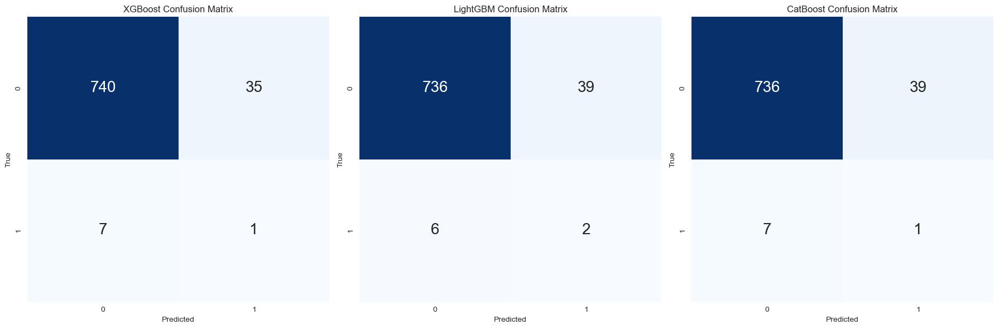

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,139130,0.010695,0.016210,105.0,0.377867,0.501059,1,1.0,1.0,3.0,0.0
1,20130614,008770,0.013852,0.016305,109.0,-0.220379,0.630733,1,1.0,1.0,3.0,0.0
2,20130614,005440,-0.066211,0.019417,119.0,0.014547,0.523448,1,1.0,1.0,3.0,0.0
3,20130614,117930,-0.013187,0.019951,125.0,-0.896377,0.576562,1,1.0,1.0,3.0,0.0
4,20130614,002550,-0.020285,0.018791,127.0,-0.176890,0.828825,1,1.0,1.0,3.0,0.0
5,20130614,046890,0.046324,0.021717,129.0,-0.191073,0.670645,1,1.0,1.0,3.0,0.0
6,20130614,111770,0.002946,0.020256,131.0,-0.373893,0.805955,1,1.0,1.0,3.0,0.0
7,20130614,020560,0.037555,0.018285,140.0,0.344910,0.633515,1,1.0,1.0,3.0,0.0
8,20130614,023590,0.027683,0.027911,188.0,-0.646233,0.772288,1,1.0,1.0,3.0,0.0


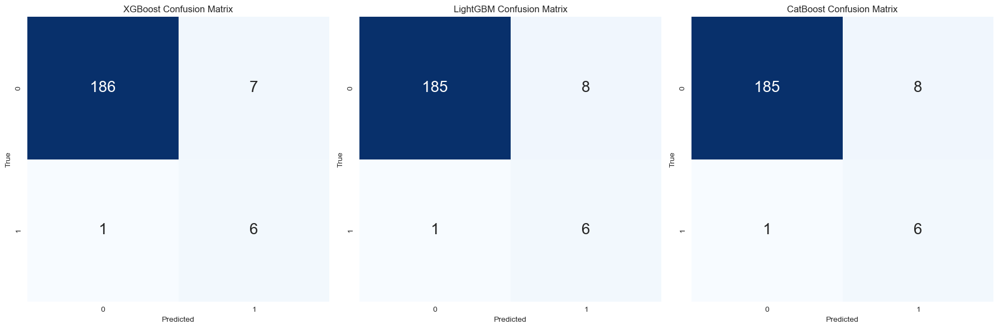

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,003120,0.009468,0.004219,400.0,-0.348070,1.163183,1,1.0,1.0,3.0,0.0
1,20130614,002020,-0.002845,0.019707,411.0,-0.543012,0.552590,1,1.0,1.0,3.0,0.0
2,20130614,000050,-0.005988,0.019833,413.0,2.671847,1.544566,1,1.0,1.0,3.0,1.0
3,20130614,005690,0.096737,0.016379,419.0,0.799968,0.629154,1,1.0,1.0,3.0,0.0
4,20130614,016380,0.168208,0.025494,423.0,1.283326,0.881023,1,1.0,1.0,3.0,1.0
5,20130614,003480,0.015592,0.007519,425.0,-0.713097,0.530394,1,1.0,1.0,3.0,1.0
6,20130614,001520,0.182322,0.091245,458.0,2.036877,1.479633,1,1.0,1.0,3.0,0.0
7,20130614,008040,-0.089060,0.034233,469.0,0.172861,1.542034,1,1.0,1.0,3.0,1.0
8,20130614,004710,-0.049241,0.039943,486.0,-0.537705,0.790636,1,1.0,1.0,3.0,0.0
9,20130614,103590,-0.003309,0.012781,489.0,0.196612,0.395492,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 4.3475
편출 예측 종목 공매도수익률 = -8.179999999999998
총수익률 = -3.832499999999998
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 2021

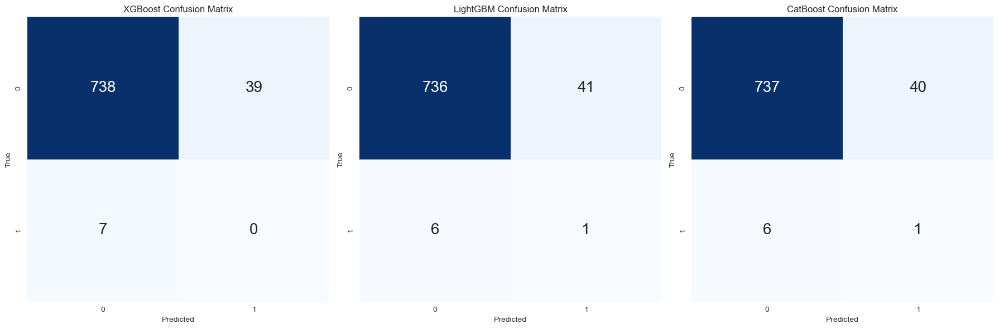

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,005385,0.058108,0.024326,70.0,-0.634062,0.735113,1,1.0,1.0,3.0,0.0
1,20140613,008770,-0.011834,0.017010,84.0,0.517996,0.416857,1,1.0,1.0,3.0,0.0
2,20140613,035760,0.033294,0.012312,89.0,0.378126,0.442693,1,1.0,1.0,3.0,0.0
3,20140613,046890,-0.008745,0.011504,94.0,0.170629,0.347412,1,1.0,1.0,3.0,0.0
4,20140613,034230,-0.022858,0.017911,95.0,0.300968,0.361999,1,1.0,1.0,3.0,0.0
5,20140613,002550,-0.026216,0.014098,112.0,-0.358569,0.488678,1,1.0,1.0,3.0,0.0
6,20140613,000060,-0.022990,0.012130,124.0,0.041392,0.617166,1,1.0,1.0,3.0,0.0
7,20140613,037560,0.005333,0.014347,128.0,0.177140,0.525171,1,1.0,1.0,3.0,0.0
8,20140613,035720,0.011737,0.016684,147.0,-0.092129,0.852443,1,1.0,1.0,3.0,0.0
9,20140613,096530,-0.008032,0.021567,153.0,0.187447,0.350824,1,1.0,1.0,3.0,0.0


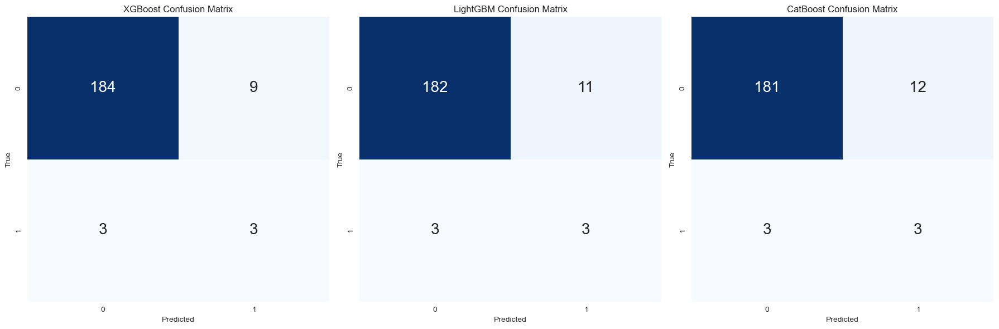

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,000140,-0.026433,0.006825,383.0,0.759476,0.822759,1,1.0,1.0,3.0,0.0
1,20140613,004430,-0.092621,0.015534,418.0,1.290305,0.469996,1,1.0,1.0,3.0,0.0
2,20140613,000990,-0.043609,0.022248,423.0,-0.297630,0.428627,1,1.0,1.0,3.0,0.0
3,20140613,005090,-0.083517,0.025060,433.0,0.247272,0.685537,1,1.0,1.0,3.0,0.0
4,20140613,104700,-0.105575,0.021029,444.0,0.544387,0.997449,1,1.0,1.0,3.0,0.0
5,20140613,005950,-0.095661,0.031032,467.0,-1.023908,0.856685,1,1.0,1.0,3.0,0.0
6,20140613,002020,-0.048348,0.014101,473.0,0.431761,0.480344,1,1.0,1.0,3.0,0.0
7,20140613,000700,-0.010645,0.019325,478.0,1.191154,1.326833,1,1.0,1.0,3.0,0.0
8,20140613,009420,-0.117506,0.039777,525.0,-1.738016,0.922642,1,1.0,1.0,3.0,1.0
9,20140613,005690,-0.059868,0.010063,535.0,-0.051712,0.397732,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 3.886666666666667
편출 예측 종목 공매도수익률 = -8.646666666666667
총수익률 = -4.76
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 202112

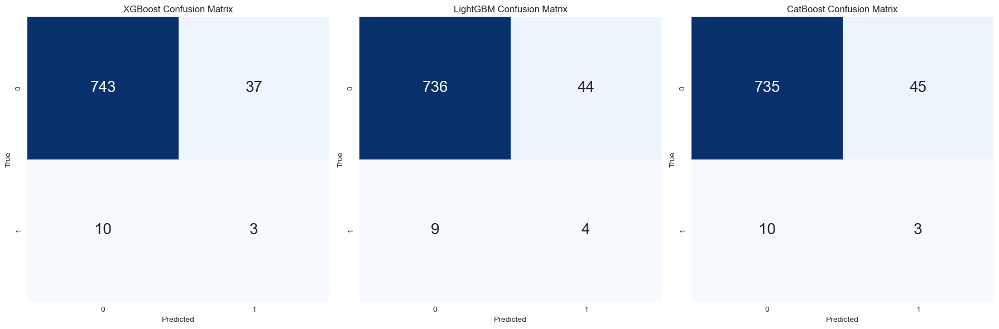

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,005387,-0.026668,0.016682,50.0,0.043523,0.379688,1,1.0,1.0,3.0,0.0
1,20150612,034230,0.037666,0.025267,89.0,-2.508828,0.596171,1,1.0,1.0,3.0,0.0
2,20150612,027410,0.011606,0.016443,104.0,-0.033108,0.477370,1,1.0,1.0,3.0,0.0
3,20150612,181710,0.060178,0.019466,137.0,-0.018705,0.532478,1,1.0,1.0,3.0,0.0
4,20150612,030530,-0.051293,0.023392,169.0,0.302934,0.983121,1,1.0,1.0,3.0,0.0
5,20150612,016170,-0.032873,0.027992,175.0,0.198397,0.714790,1,1.0,1.0,3.0,0.0
6,20150612,192820,0.029128,0.030950,180.0,0.066257,0.743954,1,1.0,1.0,3.0,1.0
7,20150612,034830,0.026088,0.014109,191.0,0.149990,0.803839,1,1.0,1.0,3.0,0.0


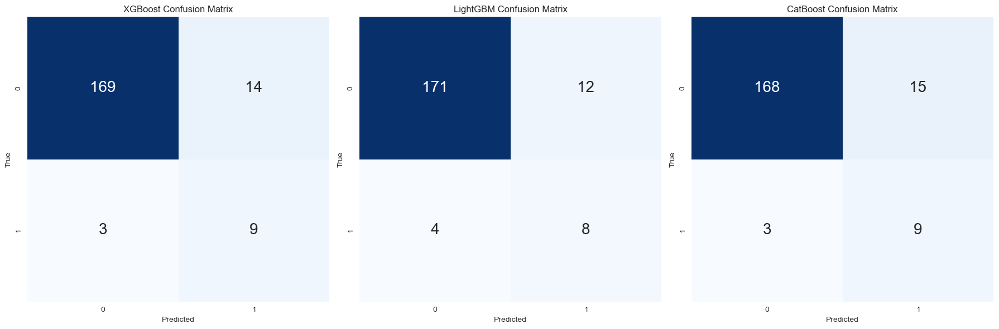

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,019680,-0.026631,0.018726,237.0,0.496343,1.005477,1,1.0,1.0,3.0,0.0
1,20150612,003920,-0.064439,0.014151,308.0,0.958788,1.106159,1,1.0,1.0,3.0,0.0
2,20150612,079980,-0.060625,0.011499,331.0,0.528737,0.813423,1,1.0,1.0,3.0,0.0
3,20150612,016800,-0.044032,0.013401,353.0,2.210754,2.303503,1,1.0,1.0,3.0,1.0
4,20150612,078520,0.076270,0.024638,412.0,0.386655,0.468326,1,1.0,1.0,3.0,0.0
5,20150612,033530,-0.037483,0.018130,424.0,-0.630809,0.845604,1,1.0,1.0,3.0,0.0
6,20150612,010690,-0.043730,0.009915,430.0,1.426702,0.447519,1,1.0,1.0,3.0,0.0
7,20150612,009580,-0.057820,0.010056,446.0,0.580309,0.691126,1,1.0,1.0,3.0,0.0
8,20150612,004130,0.087392,0.027000,470.0,1.076286,0.754618,1,1.0,1.0,3.0,1.0
9,20150612,051310,-0.122665,0.028207,471.0,0.868341,0.787460,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 35.25000000000001
편출 예측 종목 공매도수익률 = -20.182105263157887
총수익률 = 15.06789473684212
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20

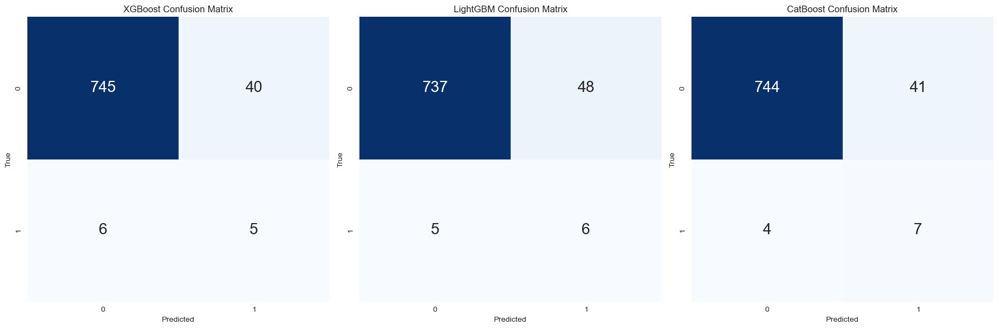

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,008930,-0.034847,0.027575,33.0,-0.892867,0.422494,1,1.0,1.0,3.0,1.0
1,20160610,027410,0.002946,0.015730,62.0,-0.188656,0.547324,1,1.0,1.0,3.0,1.0
2,20160610,130960,0.029055,0.027274,70.0,0.238899,0.556948,1,1.0,1.0,3.0,0.0
3,20160610,079160,-0.016195,0.013484,88.0,-1.111422,0.649461,1,1.0,1.0,3.0,0.0
4,20160610,086900,-0.074587,0.035972,89.0,-0.524648,0.605665,1,1.0,1.0,3.0,0.0
5,20160610,016170,-0.075002,0.020381,118.0,-0.417105,0.752423,1,1.0,1.0,3.0,0.0
6,20160610,214370,-0.053843,0.031298,188.0,0.006799,0.704356,1,1.0,1.0,3.0,0.0
7,20160610,200130,0.012177,0.034573,192.0,-0.374011,0.773130,1,1.0,1.0,3.0,0.0
8,20160610,016450,0.012579,0.024684,194.0,-0.053097,0.946737,1,1.0,1.0,3.0,0.0


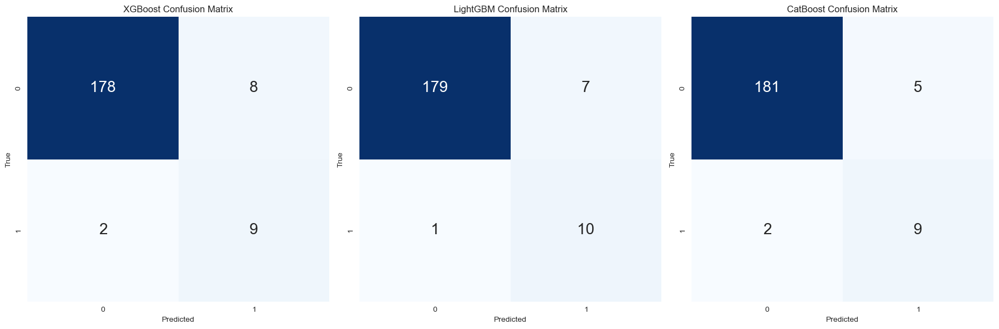

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,093050,-0.056057,0.008834,219.0,-0.397250,0.447741,1,1.0,1.0,3.0,0.0
1,20160610,002240,-0.057745,0.012567,247.0,-0.189623,0.549213,1,1.0,1.0,3.0,0.0
2,20160610,009580,-0.033902,0.014069,438.0,-0.227361,0.550358,1,1.0,1.0,3.0,1.0
3,20160610,004150,-0.061202,0.012013,496.0,0.732772,0.594855,1,1.0,1.0,3.0,1.0
4,20160610,007860,-0.020203,0.016575,500.0,0.024640,0.608957,1,1.0,1.0,3.0,1.0
5,20160610,042700,-0.004706,0.009578,506.0,-0.189062,0.392815,1,1.0,1.0,3.0,1.0
6,20160610,079980,-0.063125,0.018044,512.0,1.369912,0.569290,1,1.0,1.0,3.0,1.0
7,20160610,004700,-0.128241,0.021435,556.0,0.140541,0.755805,1,1.0,1.0,3.0,0.0
8,20160610,084870,-0.026317,0.023492,562.0,-1.121759,0.290798,1,1.0,1.0,3.0,1.0
9,20160610,082740,-0.087011,0.007763,568.0,0.022297,0.305247,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 1.2599999999999998
편출 예측 종목 공매도수익률 = -4.551666666666667
총수익률 = -3.291666666666667
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 2

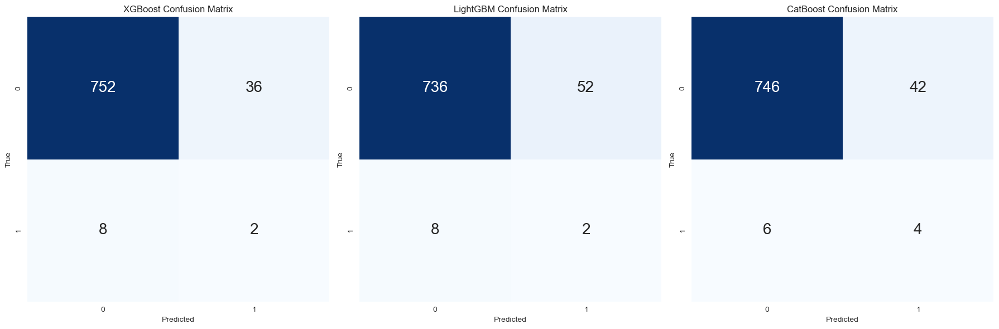

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,035720,0.034772,0.020304,47.0,0.466153,0.342738,1,1.0,1.0,3.0,0.0
1,20170609,130960,0.089715,0.030260,88.0,0.000623,0.561599,1,1.0,1.0,3.0,0.0
2,20170609,028670,-0.028705,0.016133,100.0,-0.284393,0.682133,1,1.0,1.0,3.0,1.0
3,20170609,090435,-0.032088,0.013536,109.0,0.080929,1.251689,1,1.0,1.0,3.0,0.0
4,20170609,036490,-0.014305,0.017103,129.0,-0.106794,0.454063,1,1.0,1.0,3.0,0.0


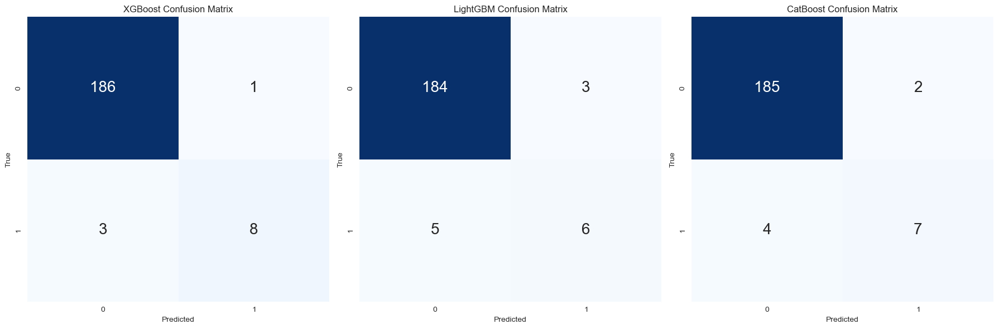

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,007690,0.027004,0.007672,414.0,-0.070404,0.498133,1,1.0,1.0,3.0,1.0
1,20170609,003200,0.041594,0.044935,428.0,0.910377,0.936342,1,1.0,1.0,3.0,1.0
2,20170609,078520,-0.012453,0.026067,447.0,0.634619,0.414284,1,1.0,1.0,3.0,0.0
3,20170609,000140,0.000000,0.017349,481.0,-0.180708,0.754527,1,1.0,1.0,3.0,1.0
4,20170609,004700,-0.026604,0.010512,499.0,-1.065141,0.566467,1,1.0,1.0,3.0,1.0
5,20170609,000230,-0.003884,0.028383,670.0,-1.386537,0.501652,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 26.44
편출 예측 종목 공매도수익률 = 1.2116666666666676
총수익률 = 27.651666666666667
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 20211

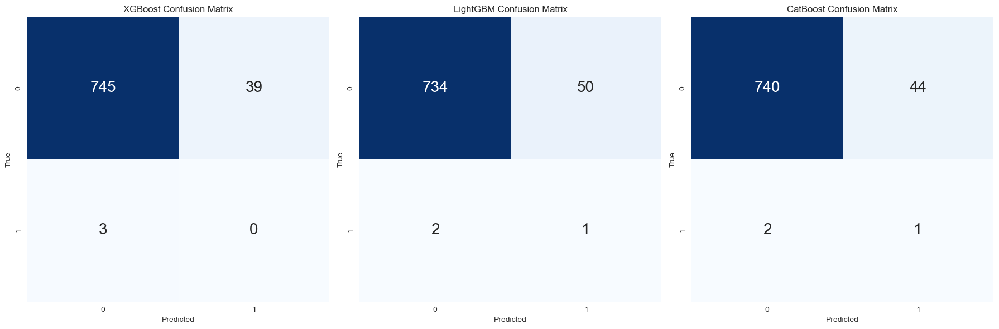

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,035720,0.003552,0.016129,37.0,-1.011721,0.528905,1,1.0,1.0,3.0,0.0
1,20180615,215600,-0.010006,0.049359,55.0,-0.811542,0.356598,1,1.0,1.0,3.0,0.0
2,20180615,271560,0.008547,0.027875,66.0,-0.135374,0.446973,1,1.0,1.0,3.0,0.0
3,20180615,079440,-0.018833,0.021169,69.0,-0.357070,0.294602,1,1.0,1.0,3.0,0.0
4,20180615,005385,-0.017942,0.008678,110.0,-0.466644,0.471835,1,1.0,1.0,3.0,0.0
5,20180615,084990,0.013996,0.027305,113.0,-0.740488,0.150912,1,1.0,1.0,3.0,0.0
6,20180615,039490,0.029293,0.028160,128.0,0.103526,0.534200,1,1.0,1.0,3.0,0.0
7,20180615,139130,0.029128,0.018180,143.0,0.721704,0.406943,1,1.0,1.0,3.0,0.0
8,20180615,078340,0.032021,0.020264,150.0,0.398904,0.543376,1,1.0,1.0,3.0,0.0
9,20180615,028150,-0.036922,0.022635,173.0,0.299669,0.544026,1,1.0,1.0,3.0,0.0


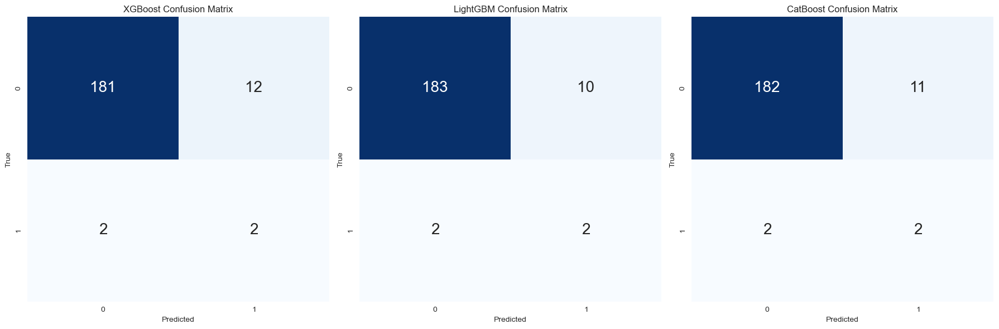

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,007570,0.013755,0.035423,278.0,0.663047,1.123382,1,1.0,1.0,3.0,0.0
1,20180615,025860,0.002217,0.015903,378.0,0.127934,0.644620,1,1.0,1.0,3.0,0.0
2,20180615,036580,-0.016065,0.013763,397.0,0.125119,0.538724,1,1.0,1.0,3.0,0.0
3,20180615,014830,0.034013,0.017116,417.0,0.069298,0.404447,1,1.0,1.0,3.0,0.0
4,20180615,003850,-0.019330,0.018757,429.0,-0.400468,0.337014,1,1.0,1.0,3.0,0.0
5,20180615,004710,-0.028820,0.024523,434.0,-0.339510,0.469876,1,1.0,1.0,3.0,0.0
6,20180615,000050,0.000000,0.015072,439.0,0.660568,0.329069,1,1.0,1.0,3.0,1.0
7,20180615,097230,-0.153274,0.050265,478.0,-0.390568,0.638932,1,1.0,1.0,3.0,0.0
8,20180615,007340,-0.003082,0.015096,500.0,0.550339,0.519206,1,1.0,1.0,3.0,0.0
9,20180615,078520,-0.140876,0.041306,511.0,-0.362117,0.339257,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 3.2900000000000005
편출 예측 종목 공매도수익률 = -8.900833333333331
총수익률 = -5.61083333333333
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20

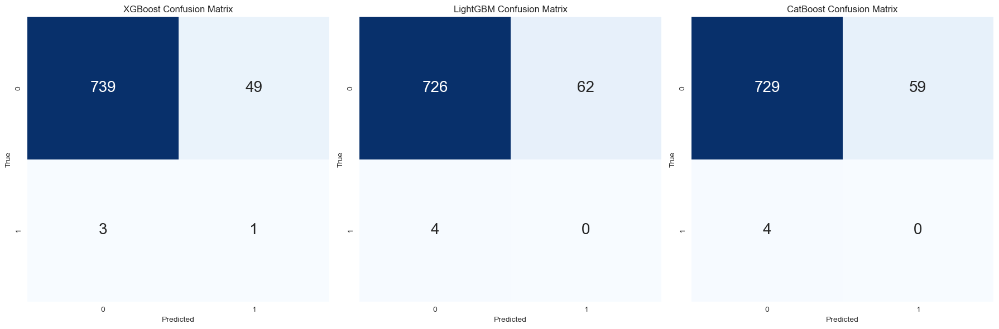

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,215600,-0.017178,0.046107,52.0,-0.425084,0.304315,1,1.0,1.0,3.0,0.0
1,20190614,003670,-0.006192,0.029258,77.0,0.459234,0.299294,1,1.0,1.0,3.0,0.0
2,20190614,086900,-0.002301,0.023859,81.0,0.511058,0.348186,1,1.0,1.0,3.0,0.0
3,20190614,005387,0.104078,0.029379,94.0,-0.862094,0.738930,1,1.0,1.0,3.0,0.0
4,20190614,034230,-0.044562,0.023617,120.0,0.405358,0.558980,1,1.0,1.0,3.0,0.0
5,20190614,036490,-0.012747,0.024901,135.0,0.232893,0.676799,1,1.0,1.0,3.0,0.0
6,20190614,145020,-0.018104,0.028839,142.0,0.139778,0.614274,1,1.0,1.0,3.0,0.0
7,20190614,051915,-0.030153,0.022880,143.0,0.776907,0.282600,1,1.0,1.0,3.0,0.0
8,20190614,095700,-0.049660,0.028653,144.0,0.553317,0.432062,1,1.0,1.0,3.0,0.0
9,20190614,012510,0.027292,0.022696,145.0,0.011894,0.512206,1,1.0,1.0,3.0,0.0


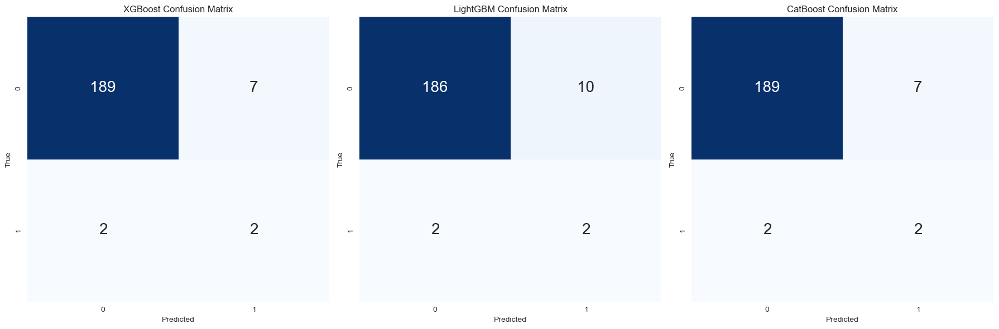

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,006120,-0.017094,0.016943,309.0,0.225022,0.326885,1,1.0,1.0,3.0,0.0
1,20190614,108670,0.001847,0.018359,323.0,0.716517,0.414431,1,1.0,1.0,3.0,0.0
2,20190614,001520,0.005222,0.015086,330.0,0.764036,0.399232,1,1.0,1.0,3.0,0.0
3,20190614,003920,0.000000,0.017493,331.0,0.647910,0.612782,1,1.0,1.0,3.0,0.0
4,20190614,034120,0.023867,0.014720,400.0,2.803355,0.939215,1,1.0,1.0,3.0,1.0
5,20190614,036580,-0.058735,0.011219,478.0,1.047516,0.633776,1,1.0,1.0,3.0,1.0
6,20190614,097230,0.079822,0.033937,612.0,0.302941,0.512617,1,1.0,1.0,3.0,0.0
7,20190614,003030,-0.075986,0.010550,791.0,1.513974,0.720624,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 7.124999999999998
편출 예측 종목 공매도수익률 = 12.5275
총수익률 = 19.652499999999996
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 2021

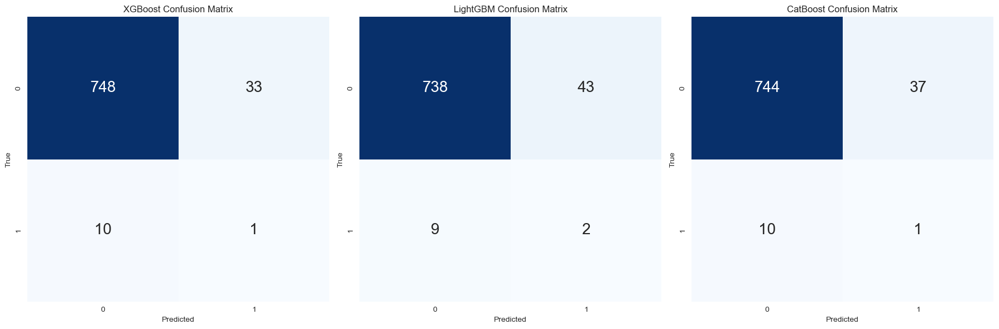

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20200612,028300,0.002039,0.033376,58.0,-1.036541,0.289492,1,1.0,1.0,3.0,0.0
1,20200612,035760,-0.003891,0.014916,71.0,0.489723,0.525264,1,1.0,1.0,3.0,0.0
2,20200612,263750,0.001564,0.023765,94.0,0.076119,0.493748,1,1.0,1.0,3.0,0.0
3,20200612,180640,0.016099,0.018411,100.0,-0.299462,0.403418,1,1.0,1.0,3.0,1.0
4,20200612,079440,0.058537,0.014867,101.0,0.317299,0.610822,1,1.0,1.0,3.0,0.0
5,20200612,012510,0.058027,0.021072,103.0,-0.062727,0.655503,1,1.0,1.0,3.0,0.0
6,20200612,253450,0.026736,0.015702,104.0,-0.029525,0.658649,1,1.0,1.0,3.0,0.0
7,20200612,005385,0.017772,0.007119,121.0,-0.125333,0.557877,1,1.0,1.0,3.0,0.0
8,20200612,034230,0.058527,0.007530,123.0,-0.292762,0.557255,1,1.0,1.0,3.0,0.0
9,20200612,084990,0.003679,0.014358,124.0,-0.931853,0.447746,1,1.0,1.0,3.0,0.0


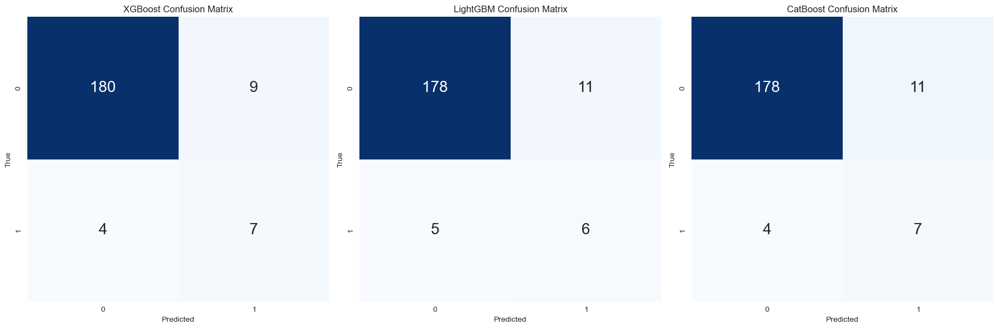

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20200612,145990,0.013449,0.011158,311.0,0.497766,0.885856,1,1.0,1.0,3.0,0.0
1,20200612,019680,-0.026404,0.010572,317.0,1.567634,1.086698,1,1.0,1.0,3.0,0.0
2,20200612,004490,-0.025869,0.013039,325.0,0.888877,0.559582,1,1.0,1.0,3.0,0.0
3,20200612,108670,-0.003676,0.013880,341.0,0.295047,0.378104,1,1.0,1.0,3.0,0.0
4,20200612,002270,-0.026412,0.012139,358.0,0.364253,0.513750,1,1.0,1.0,3.0,0.0
5,20200612,025860,0.029890,0.012783,386.0,0.062462,0.489042,1,1.0,1.0,3.0,0.0
6,20200612,096760,-0.001612,0.011378,387.0,0.360320,1.150916,1,1.0,1.0,3.0,1.0
7,20200612,014830,-0.016639,0.010989,398.0,1.321078,0.898708,1,1.0,1.0,3.0,0.0
8,20200612,003620,0.033124,0.034481,471.0,0.092399,0.627959,1,1.0,1.0,3.0,1.0
9,20200612,003920,-0.058156,0.018394,491.0,1.659060,1.017450,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 6.398333333333336
편출 예측 종목 공매도수익률 = 4.353076923076923
총수익률 = 10.75141025641026
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 2021

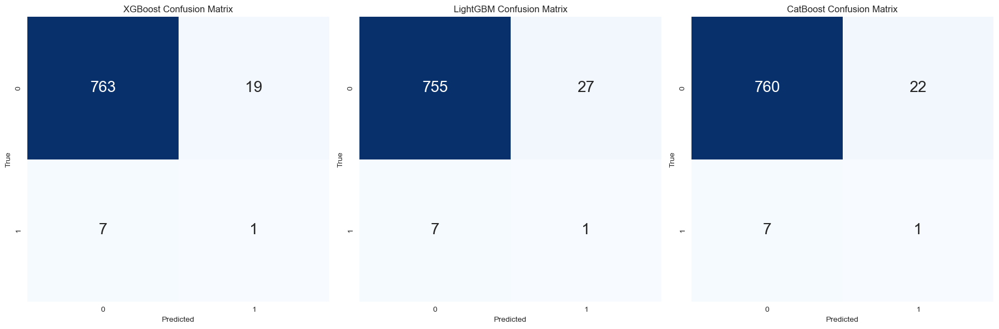

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,028300,-0.073283,0.037187,47.0,0.144381,0.264007,1,1.0,1.0,3.0,0.0
1,20201211,096530,-0.019454,0.027172,84.0,0.250932,0.553601,1,1.0,1.0,3.0,0.0
2,20201211,058470,0.010276,0.027658,127.0,-0.292143,0.337970,1,1.0,1.0,3.0,0.0
3,20201211,005385,-0.087155,0.026151,142.0,0.565694,0.284981,1,1.0,1.0,3.0,0.0
4,20201211,272210,0.039821,0.043676,188.0,0.476038,1.189800,1,1.0,1.0,3.0,1.0


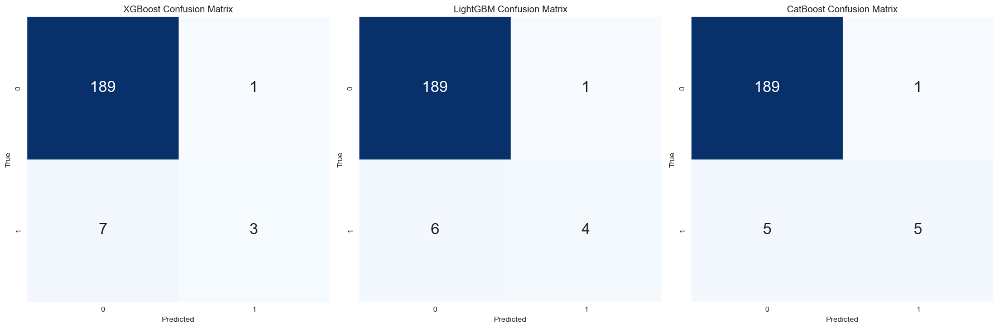

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,001430,-0.040094,0.062273,433.0,0.180977,0.870739,1,1.0,1.0,3.0,1.0
1,20201211,014830,-0.018627,0.023065,444.0,-0.226474,0.407129,1,1.0,1.0,3.0,1.0
2,20201211,002240,-0.087537,0.044241,493.0,-0.922259,0.387270,1,1.0,1.0,3.0,0.0
3,20201211,060980,-0.155622,0.037676,522.0,0.121997,0.519960,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 36.495
편출 예측 종목 공매도수익률 = -7.2924999999999995
총수익률 = 29.202499999999997
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 202

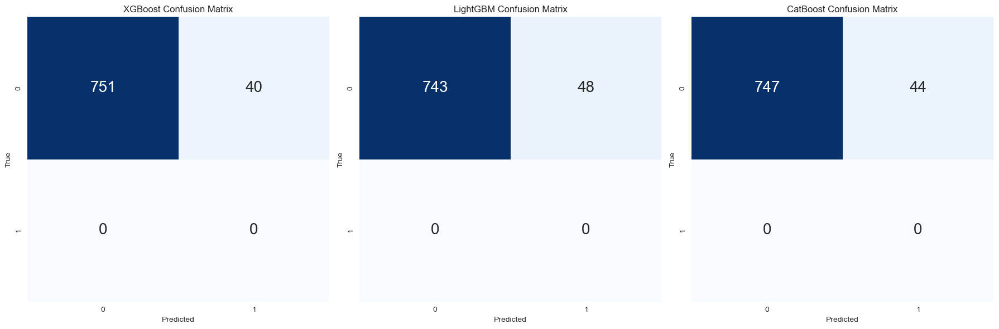

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,247540,0.040318,0.015929,91.0,0.809896,0.432291,1,1.0,1.0,3.0,0.0
1,20210610,032500,0.076961,0.016070,94.0,0.141906,0.468419,1,1.0,1.0,3.0,0.0
2,20210610,307950,0.088081,0.033262,122.0,0.063419,0.532009,1,1.0,1.0,3.0,0.0
3,20210610,235980,-0.034674,0.018424,136.0,0.266772,0.697537,1,1.0,1.0,3.0,0.0
4,20210610,140410,0.052485,0.038240,164.0,0.156638,0.861974,1,1.0,1.0,3.0,0.0
5,20210610,086900,-0.034415,0.021794,184.0,-0.077139,0.507758,1,1.0,1.0,3.0,0.0
6,20210610,139130,0.023842,0.023918,199.0,1.094639,0.324293,1,1.0,1.0,3.0,0.0


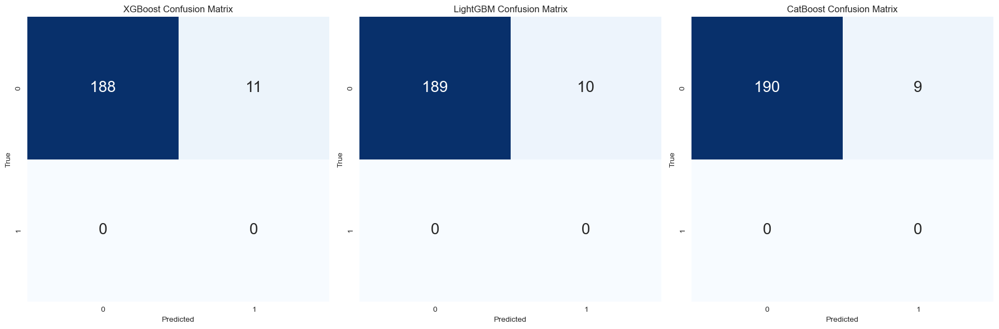

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,071840,0.018868,0.015680,289.0,0.106820,0.597995,1,1.0,1.0,3.0,0.0
1,20210610,003230,-0.013112,0.014182,291.0,0.492110,0.697883,1,1.0,1.0,3.0,0.0
2,20210610,020000,0.060727,0.012892,293.0,0.164373,0.464264,1,1.0,1.0,3.0,0.0
3,20210610,005610,-0.020340,0.014468,354.0,0.396067,0.389979,1,1.0,1.0,3.0,0.0
4,20210610,115390,0.009662,0.013268,390.0,0.337761,0.219502,1,1.0,1.0,3.0,0.0
5,20210610,006390,0.128519,0.026627,432.0,0.667176,0.815086,1,1.0,1.0,3.0,0.0
6,20210610,009410,0.147053,0.024310,474.0,1.341552,1.015775,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 14.835
편출 예측 종목 공매도수익률 = -23.692857142857143
총수익률 = -8.857857142857142
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 202

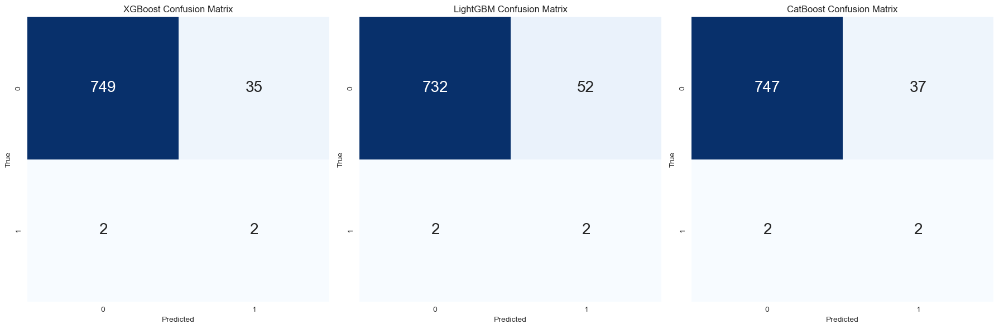

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,005387,-0.029476,0.014102,81.0,-1.044889,0.876175,1,1.0,1.0,3.0,0.0
1,20211210,263750,0.083042,0.020075,83.0,0.109677,0.781421,1,1.0,1.0,3.0,0.0
2,20211210,293490,0.021353,0.012125,84.0,0.091890,0.555187,1,1.0,1.0,3.0,0.0
3,20211210,298020,0.070341,0.039983,97.0,0.552888,0.617737,1,1.0,1.0,3.0,0.0
4,20211210,307950,0.048009,0.024137,102.0,-0.561717,0.670619,1,1.0,1.0,3.0,0.0
5,20211210,096530,0.035091,0.028081,110.0,-0.340580,0.875652,1,1.0,1.0,3.0,0.0
6,20211210,138040,-0.011142,0.020877,149.0,0.233285,0.507284,1,1.0,1.0,3.0,1.0
7,20211210,108320,-0.037200,0.031497,182.0,0.360686,0.503921,1,1.0,1.0,3.0,0.0
8,20211210,139130,-0.015899,0.017633,189.0,0.752748,0.409622,1,1.0,1.0,3.0,0.0
9,20211210,175330,-0.014389,0.016876,200.0,0.419698,0.286731,1,1.0,1.0,3.0,0.0


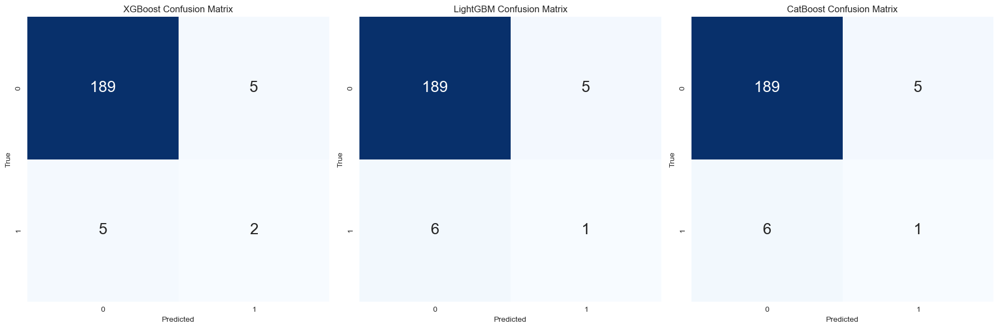

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,049770,0.002176,0.017518,319.0,0.231717,0.302767,1,1.0,1.0,3.0,0.0
1,20211210,005180,0.023131,0.010388,406.0,0.015241,0.651661,1,1.0,1.0,3.0,0.0
2,20211210,009410,-0.015625,0.009693,499.0,0.381185,0.647543,1,1.0,1.0,3.0,0.0
3,20211210,008350,-0.033403,0.013256,605.0,-1.227009,0.940439,1,1.0,1.0,3.0,0.0
4,20211210,007700,-0.007833,0.012005,811.0,-0.458511,0.211490,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 11.286666666666667
편출 예측 종목 공매도수익률 = 18.616
총수익률 = 29.90266666666667
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20211206 20211

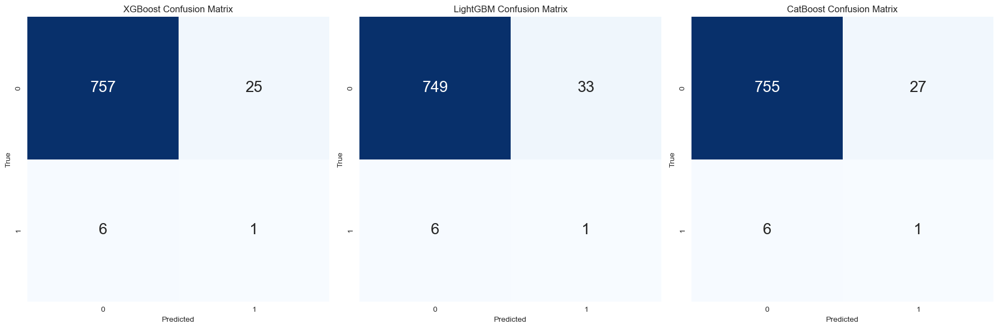

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,091990,-0.010850,0.021062,33.0,-0.102979,0.418227,1,1.0,1.0,3.0,0.0
1,20220610,066970,0.001458,0.040814,58.0,-0.688158,0.443494,1,1.0,1.0,3.0,0.0
2,20220610,028300,-0.001365,0.027433,97.0,-0.364809,0.466263,1,1.0,1.0,3.0,0.0
3,20220610,096530,-0.027525,0.032856,100.0,0.624329,0.703958,1,1.0,1.0,3.0,0.0
4,20220610,000060,-0.041276,0.017071,101.0,-0.096064,0.370085,1,1.0,1.0,3.0,1.0
5,20220610,086520,-0.056268,0.040370,132.0,0.611495,0.588431,1,1.0,1.0,3.0,0.0
6,20220610,051915,-0.008798,0.018760,140.0,-0.506623,0.757851,1,1.0,1.0,3.0,0.0


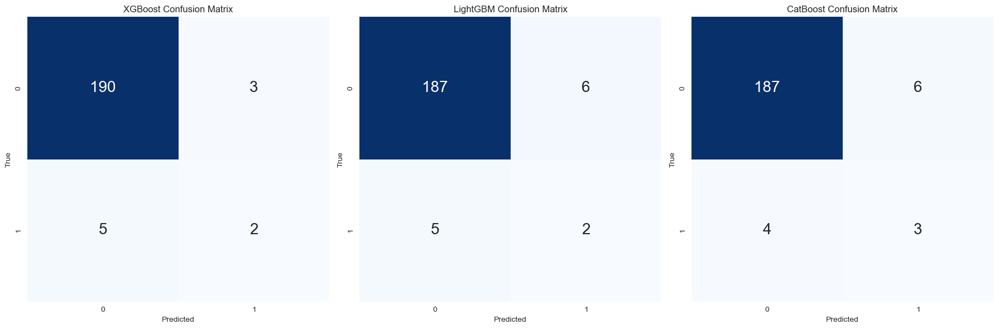

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,010780,0.050239,0.013357,219.0,-0.018785,0.296005,1,1.0,1.0,3.0,0.0
1,20220610,001800,0.022618,0.014116,287.0,0.111786,0.410533,1,1.0,1.0,3.0,0.0
2,20220610,064960,0.047974,0.028271,393.0,-0.322706,0.436343,1,1.0,1.0,3.0,1.0
3,20220610,002350,0.050757,0.012811,403.0,0.560636,0.435939,1,1.0,1.0,3.0,1.0
4,20220610,042670,-0.029453,0.028501,425.0,0.232019,0.483395,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 4.4750000000000005
편출 예측 종목 공매도수익률 = 3.6700000000000004
총수익률 = 8.145000000000001
20091204 20091207 20091208 20091209 20091210 20091211 20091214 20101203 20101206 20101207 20101208 20101209 20101210 20101213 20111209 20111212 20111213 20111214 20111215 20111216 20111219 20121206 20121207 20121210 20121211 20121212 20121213 20121214 20131204 20131205 20131206 20131209 20131210 20131211 20131212 20141204 20141205 20141208 20141209 20141210 20141211 20141212 20151201 20151202 20151203 20151204 20151207 20151208 20151209 20161201 20161202 20161205 20161206 20161207 20161208 20161209 20171205 20171206 20171207 20171208 20171211 20171212 20171213 20181205 20181206 20181207 20181210 20181211 20181212 20181213 20191205 20191206 20191209 20191210 20191211 20191212 20191213 20200610 20200611 20200612 20200615 20200616 20200617 20200618 20201203 20201204 20201207 20201208 20201209 20201210 20201211 20210608 20210609 20210610 20210611 20210614 20210615 20210616 20211202 20211203 20

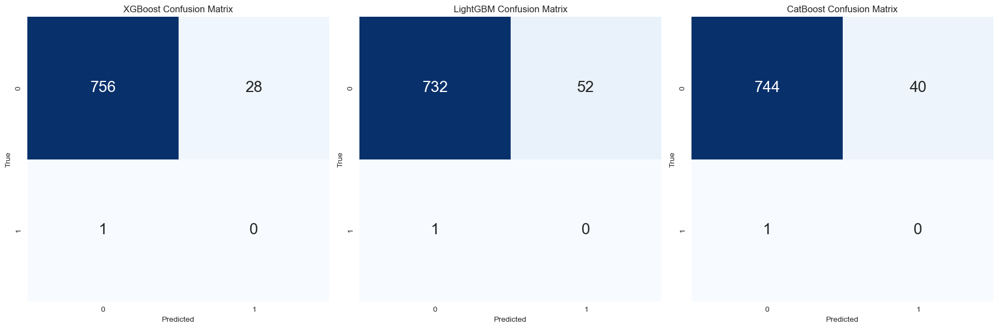

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,091990,-0.001627,0.023648,38.0,0.345517,0.208046,1,1.0,1.0,3.0,0.0
1,20221209,293490,-0.068993,0.025778,75.0,0.624905,0.423344,1,1.0,1.0,3.0,0.0
2,20221209,051915,-0.050010,0.026535,141.0,-0.273801,0.418533,1,1.0,1.0,3.0,0.0
3,20221209,357780,-0.023266,0.025461,150.0,0.098067,0.604919,1,1.0,1.0,3.0,0.0
4,20221209,005070,0.109065,0.040921,161.0,2.269397,0.648249,1,1.0,1.0,3.0,0.0
5,20221209,175330,-0.088658,0.033461,179.0,-0.091862,0.465257,1,1.0,1.0,3.0,0.0
6,20221209,056190,0.009604,0.020236,184.0,0.345595,0.436341,1,1.0,1.0,3.0,0.0
7,20221209,025900,-0.084932,0.027596,185.0,0.025244,0.502972,1,1.0,1.0,3.0,0.0


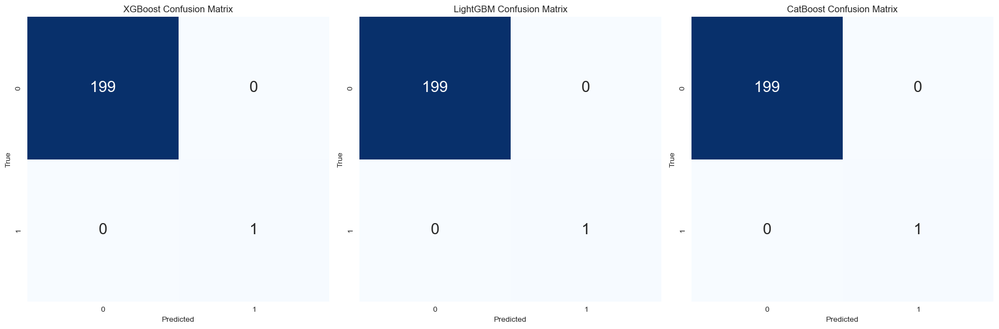

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,000070,-0.020331,0.013169,349.0,0.771277,0.735639,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 9.123333333333333
편출 예측 종목 공매도수익률 = 10.91
총수익률 = 20.03333333333333


In [47]:
returns120 = 0 
for date in inout_days[3:]:
    try: 
        ret_back = predict_and_test(date,n = 120)
        returns120 += ret_back
    except Exception as e:
        print(e)

In [48]:
print(f"120일전 예측한경우의 10년 return 평균 = {returns120/len(inout_days[3:]):.2f}%")

120일전 예측한경우의 10년 return 평균 = 10.31%


### 90일

20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 20220119 20220120 20220121 20220124 20220720 20220721 20220722 20220725 20220726 20220727 2

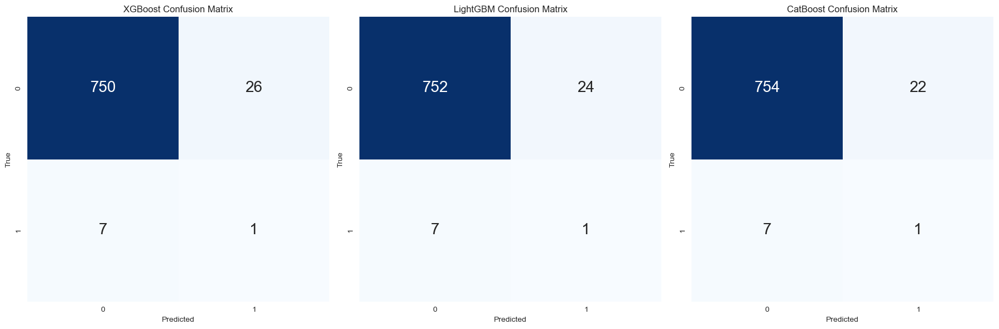

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,068270,0.005865,0.015534,54.0,0.144109,0.623989,1,1.0,1.0,3.0,0.0
1,20130614,005387,-0.027725,0.022530,82.0,-0.348561,0.245414,1,1.0,1.0,3.0,0.0
2,20130614,057050,-0.007220,0.021238,117.0,0.063465,0.923458,1,1.0,1.0,3.0,0.0
3,20130614,053210,-0.035145,0.014701,121.0,-0.511037,0.669486,1,1.0,1.0,3.0,0.0
4,20130614,111770,-0.026043,0.025648,123.0,0.042568,0.803592,1,1.0,1.0,3.0,0.0
5,20130614,122870,-0.058932,0.026210,191.0,-1.147719,0.741535,1,1.0,1.0,3.0,0.0


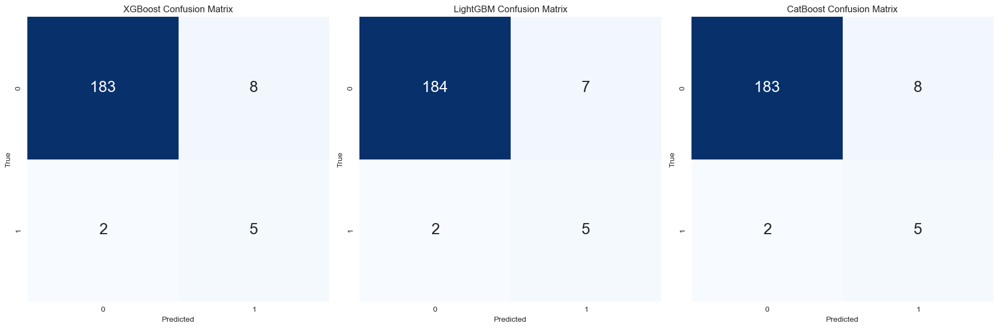

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,064960,0.015168,0.021452,310.0,-0.262313,0.689034,1,1.0,1.0,3.0,0.0
1,20130614,025000,-0.001101,0.021900,424.0,-0.813027,0.960055,1,1.0,1.0,3.0,0.0
2,20130614,000050,0.181994,0.072259,431.0,1.673586,0.870017,1,1.0,1.0,3.0,1.0
3,20130614,002020,-0.044700,0.011953,443.0,0.734554,0.721430,1,1.0,1.0,3.0,0.0
4,20130614,003120,-0.009377,0.007620,457.0,0.591515,1.557150,1,1.0,1.0,3.0,0.0
5,20130614,005690,-0.083587,0.017642,461.0,-0.422299,0.510870,1,1.0,1.0,3.0,0.0
6,20130614,016380,-0.054916,0.013427,469.0,0.433197,0.723863,1,1.0,1.0,3.0,1.0
7,20130614,008040,-0.063215,0.013009,471.0,-0.306543,0.827748,1,1.0,1.0,3.0,1.0
8,20130614,003480,-0.008019,0.022312,475.0,2.089733,0.705499,1,1.0,1.0,3.0,1.0
9,20130614,103130,-0.142296,0.010514,525.0,-0.794085,0.829356,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 12.3175
편출 예측 종목 공매도수익률 = -11.175454545454546
총수익률 = 1.142045454545455
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 202

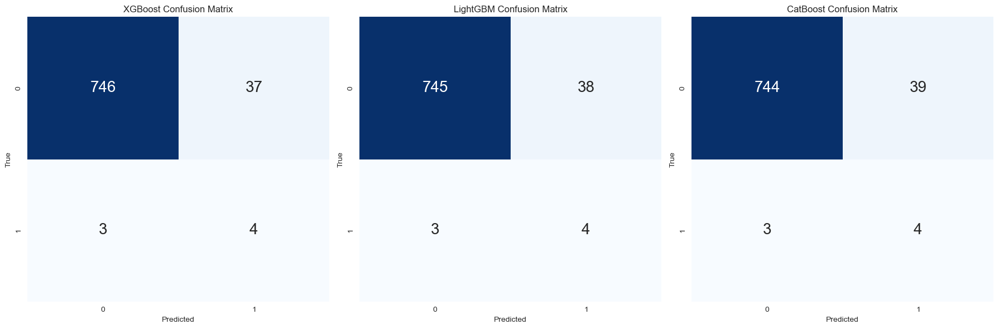

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,161390,0.006359,0.024486,32.0,0.856470,0.519937,1,1.0,1.0,3.0,1.0
1,20140613,068270,-0.033825,0.025401,55.0,0.166756,0.371231,1,1.0,1.0,3.0,0.0
2,20140613,001450,-0.022582,0.009661,82.0,0.214418,0.490883,1,1.0,1.0,3.0,0.0
3,20140613,046890,-0.015103,0.031588,83.0,-0.686072,0.635909,1,1.0,1.0,3.0,0.0
4,20140613,051600,-0.030940,0.014313,91.0,-0.724541,0.774385,1,1.0,1.0,3.0,1.0
5,20140613,034230,-0.009116,0.025401,92.0,-0.320926,0.402297,1,1.0,1.0,3.0,0.0
6,20140613,035760,-0.010903,0.017362,93.0,0.218110,0.484986,1,1.0,1.0,3.0,0.0
7,20140613,057050,-0.027474,0.012254,103.0,1.083219,0.783620,1,1.0,1.0,3.0,0.0
8,20140613,002550,-0.032105,0.014959,114.0,0.377268,0.446766,1,1.0,1.0,3.0,0.0
9,20140613,071840,-0.034116,0.024635,116.0,0.366917,0.494389,1,1.0,1.0,3.0,0.0


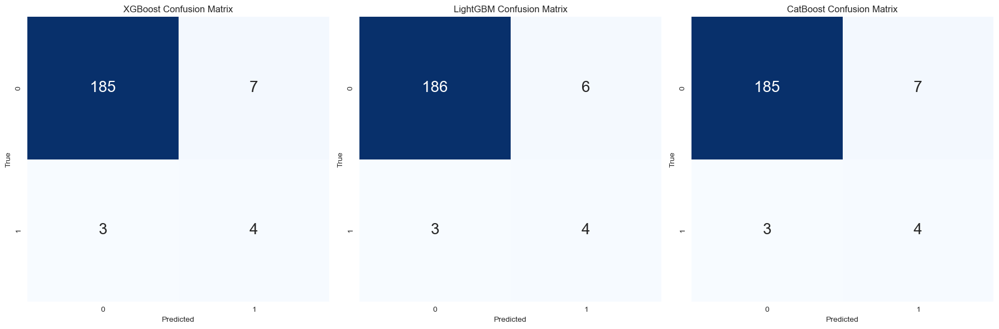

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,000700,-0.038250,0.012125,484.0,-0.391608,0.395249,1,1.0,1.0,3.0,0.0
1,20140613,002020,0.015409,0.026623,489.0,-0.171284,0.859504,1,1.0,1.0,3.0,0.0
2,20140613,005950,-0.028515,0.035942,504.0,0.348268,1.163409,1,1.0,1.0,3.0,0.0
3,20140613,009420,-0.054792,0.014226,556.0,-0.565740,0.478152,1,1.0,1.0,3.0,1.0
4,20140613,001630,0.036409,0.033150,562.0,-0.157535,0.444892,1,1.0,1.0,3.0,1.0
5,20140613,005690,-0.072189,0.012478,579.0,-0.287907,0.449720,1,1.0,1.0,3.0,1.0
6,20140613,103130,-0.029248,0.020820,617.0,-0.226181,0.309981,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -4.806666666666667
편출 예측 종목 공매도수익률 = -14.042857142857143
총수익률 = -18.84952380952381
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 

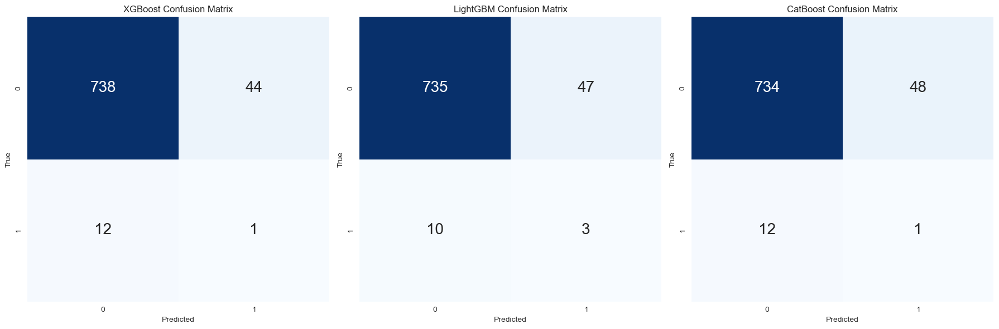

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,000030,-0.035798,0.012956,46.0,0.435037,0.429553,1,1.0,1.0,3.0,0.0
1,20150612,068270,-0.021238,0.017260,62.0,-0.422816,0.224996,1,1.0,1.0,3.0,0.0
2,20150612,005385,-0.016807,0.026671,77.0,1.100613,0.423603,1,1.0,1.0,3.0,0.0
3,20150612,026960,-0.002153,0.009946,93.0,0.487401,0.565433,1,1.0,1.0,3.0,0.0
4,20150612,001450,-0.025517,0.014975,94.0,0.092275,0.455171,1,1.0,1.0,3.0,0.0
5,20150612,139130,-0.004662,0.012227,110.0,0.581438,0.530668,1,1.0,1.0,3.0,0.0
6,20150612,138040,-0.014926,0.009803,145.0,-0.250553,0.700046,1,1.0,1.0,3.0,0.0
7,20150612,168330,0.064150,0.029490,181.0,0.346420,0.414175,1,1.0,1.0,3.0,0.0
8,20150612,003670,0.015737,0.023797,200.0,-0.180445,0.684982,1,1.0,1.0,3.0,0.0


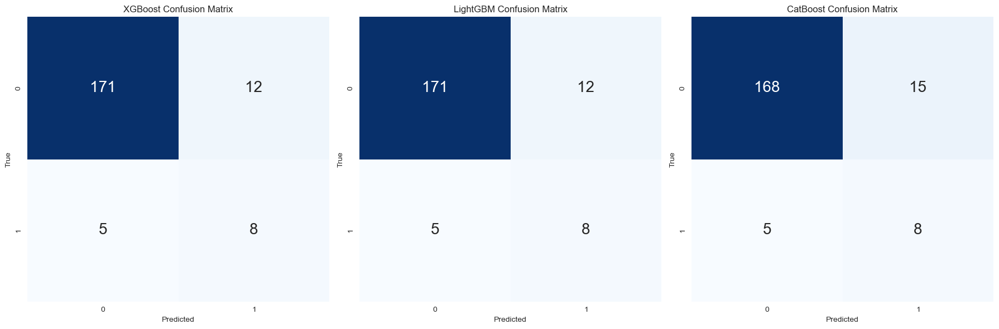

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,005090,0.080630,0.021227,377.0,-0.575279,0.516976,1,1.0,1.0,3.0,0.0
1,20150612,084870,0.171064,0.057421,389.0,1.430079,1.459770,1,1.0,1.0,3.0,0.0
2,20150612,007810,0.007782,0.027177,420.0,0.240978,0.475324,1,1.0,1.0,3.0,1.0
3,20150612,020150,0.069581,0.026965,433.0,0.158057,1.046630,1,1.0,1.0,3.0,0.0
4,20150612,000700,0.119408,0.043026,434.0,-0.101399,0.933777,1,1.0,1.0,3.0,0.0
5,20150612,002020,-0.034662,0.020509,446.0,0.849513,0.523167,1,1.0,1.0,3.0,0.0
6,20150612,078520,0.002275,0.026297,452.0,0.222301,0.672512,1,1.0,1.0,3.0,0.0
7,20150612,004130,-0.047715,0.009755,457.0,-0.154485,0.514280,1,1.0,1.0,3.0,1.0
8,20150612,000140,-0.021323,0.012521,462.0,0.445623,0.781696,1,1.0,1.0,3.0,0.0
9,20150612,033240,0.057938,0.037795,469.0,0.109178,0.584586,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 13.522
편출 예측 종목 공매도수익률 = -32.337
총수익률 = -18.815000000000005
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 20220119 20220

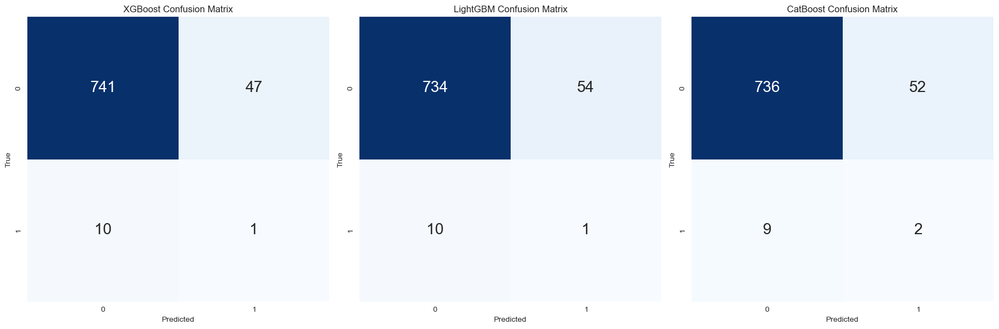

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,035720,-0.048327,0.014644,39.0,-0.231618,0.419981,1,1.0,1.0,3.0,0.0
1,20160610,027410,0.084839,0.026280,54.0,0.071466,0.399253,1,1.0,1.0,3.0,1.0
2,20160610,005387,0.038169,0.027596,68.0,0.492004,0.438550,1,1.0,1.0,3.0,0.0
3,20160610,001450,-0.063312,0.018748,84.0,0.199186,0.478801,1,1.0,1.0,3.0,0.0
4,20160610,041960,0.001191,0.021474,102.0,-0.794768,0.389150,1,1.0,1.0,3.0,0.0
5,20160610,090435,0.009569,0.016453,104.0,-0.072142,0.827497,1,1.0,1.0,3.0,0.0
6,20160610,005440,-0.002176,0.028620,107.0,-0.367232,0.481053,1,1.0,1.0,3.0,0.0
7,20160610,138040,-0.029981,0.025080,125.0,0.002023,0.976886,1,1.0,1.0,3.0,0.0
8,20160610,039130,-0.021669,0.036768,179.0,0.568490,0.386865,1,1.0,1.0,3.0,0.0
9,20160610,096530,-0.021317,0.025932,188.0,-0.196729,0.995094,1,1.0,1.0,3.0,0.0


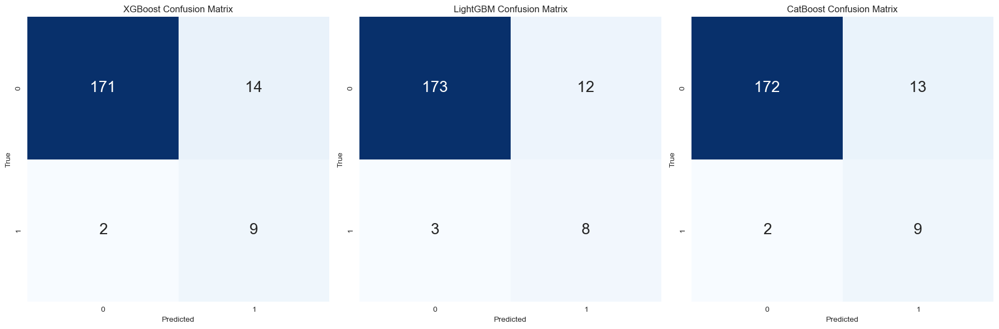

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,005740,0.020549,0.043743,214.0,0.551763,0.741221,1,1.0,1.0,3.0,0.0
1,20160610,042670,0.062776,0.058377,220.0,-0.960755,1.282833,1,1.0,1.0,3.0,0.0
2,20160610,115390,0.031875,0.036742,242.0,-0.113593,0.721929,1,1.0,1.0,3.0,0.0
3,20160610,011200,-0.081401,0.148981,264.0,0.104206,0.969115,1,1.0,1.0,3.0,0.0
4,20160610,003570,0.011606,0.020586,356.0,0.074297,0.669720,1,1.0,1.0,3.0,0.0
5,20160610,000140,0.037104,0.027803,420.0,-0.296436,0.610991,1,1.0,1.0,3.0,0.0
6,20160610,104700,0.015121,0.024770,428.0,-0.423908,0.660440,1,1.0,1.0,3.0,0.0
7,20160610,007690,0.038669,0.017929,435.0,-0.172021,0.417769,1,1.0,1.0,3.0,0.0
8,20160610,000480,-0.008230,0.029195,437.0,-1.696880,0.989994,1,1.0,1.0,3.0,1.0
9,20160610,078520,0.024582,0.024131,446.0,-0.191197,0.489798,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 2.6914285714285713
편출 예측 종목 공매도수익률 = -13.943999999999999
총수익률 = -11.252571428571429
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117

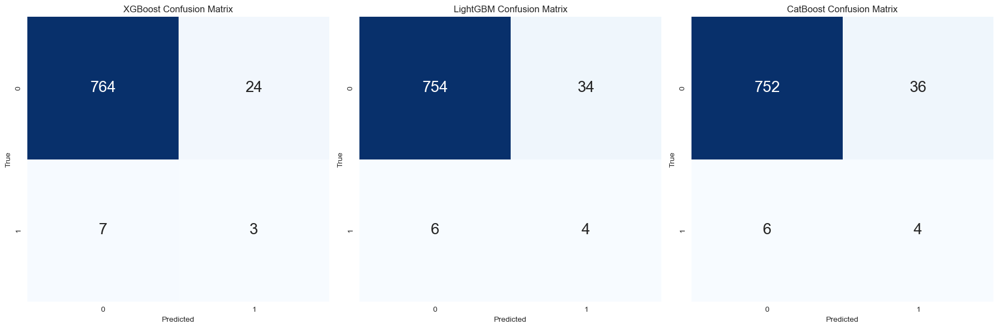

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,028670,-0.009993,0.020609,103.0,-0.611387,0.977343,1,1.0,1.0,3.0,1.0
1,20170609,079550,-0.043154,0.016024,128.0,-0.259945,0.416090,1,1.0,1.0,3.0,1.0
2,20170609,005250,0.008715,0.023058,173.0,-0.892288,0.418882,1,1.0,1.0,3.0,1.0


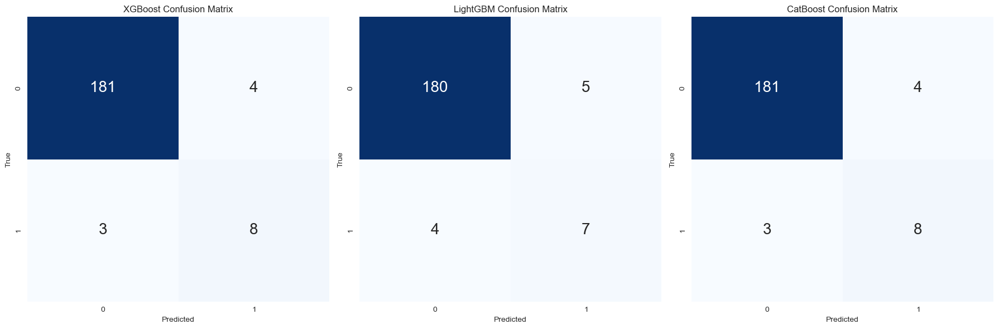

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,002350,-0.064539,0.030515,147.0,0.468913,1.163423,1,1.0,1.0,3.0,0.0
1,20170609,005850,0.058841,0.035769,211.0,0.031444,0.796387,1,1.0,1.0,3.0,0.0
2,20170609,036580,0.016667,0.012002,321.0,-0.389535,0.977886,1,1.0,1.0,3.0,0.0
3,20170609,005090,-0.011905,0.010250,425.0,-0.494746,0.487226,1,1.0,1.0,3.0,1.0
4,20170609,003570,-0.014404,0.008879,444.0,-0.565487,0.327717,1,1.0,1.0,3.0,1.0
5,20170609,003200,-0.032523,0.005554,475.0,-1.364977,0.464165,1,1.0,1.0,3.0,1.0
6,20170609,004700,-0.021277,0.013224,488.0,-1.054295,0.470268,1,1.0,1.0,3.0,1.0
7,20170609,000140,-0.004211,0.015111,504.0,-0.810626,0.564195,1,1.0,1.0,3.0,1.0
8,20170609,007210,-0.071196,0.010255,515.0,0.285973,0.460084,1,1.0,1.0,3.0,1.0
9,20170609,000230,-0.095508,0.009341,777.0,0.222753,0.269884,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 31.21666666666667
편출 예측 종목 공매도수익률 = 3.5529999999999986
총수익률 = 34.769666666666666
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20

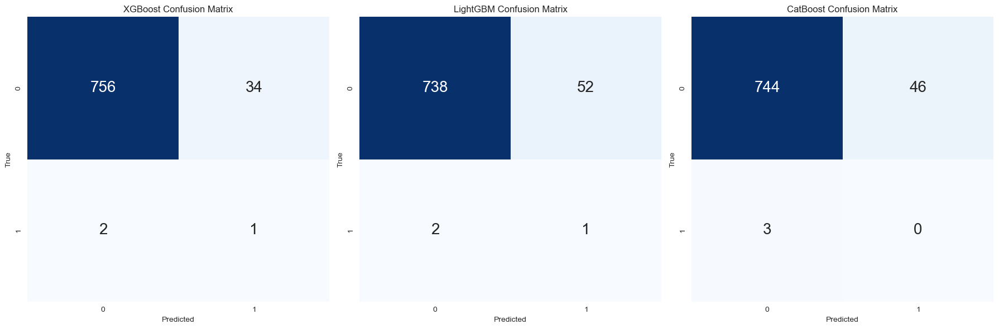

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,035720,0.007220,0.019369,38.0,-0.468816,0.441514,1,1.0,1.0,3.0,0.0
1,20180615,005387,-0.014458,0.023884,78.0,-0.305951,0.465672,1,1.0,1.0,3.0,0.0
2,20180615,130960,-0.032506,0.012292,88.0,-0.434155,0.259080,1,1.0,1.0,3.0,0.0
3,20180615,016170,-0.042266,0.022279,109.0,-0.284988,1.086220,1,1.0,1.0,3.0,0.0
4,20180615,034230,-0.060381,0.016505,131.0,-0.521922,0.222056,1,1.0,1.0,3.0,0.0
5,20180615,139130,0.042023,0.018999,134.0,-0.094753,0.570199,1,1.0,1.0,3.0,0.0
6,20180615,095700,0.029486,0.016532,159.0,-0.851094,0.403500,1,1.0,1.0,3.0,0.0
7,20180615,226320,-0.004773,0.029347,187.0,-0.895111,0.423868,1,1.0,1.0,3.0,0.0


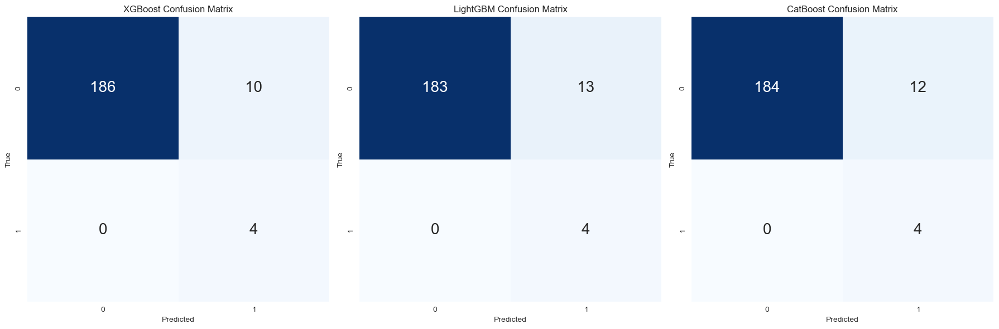

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,001680,0.069381,0.027070,240.0,-0.498189,0.690653,1,1.0,1.0,3.0,0.0
1,20180615,029530,0.152534,0.032727,286.0,-0.768025,0.973192,1,1.0,1.0,3.0,1.0
2,20180615,002270,0.156490,0.028576,289.0,0.161641,0.754441,1,1.0,1.0,3.0,0.0
3,20180615,009290,0.077828,0.013524,366.0,-0.363379,0.647391,1,1.0,1.0,3.0,1.0
4,20180615,003920,0.014389,0.008107,380.0,-0.122927,0.586356,1,1.0,1.0,3.0,0.0
5,20180615,078520,0.048527,0.021437,414.0,0.053305,0.676544,1,1.0,1.0,3.0,1.0
6,20180615,097230,0.083720,0.015643,465.0,1.030823,0.976956,1,1.0,1.0,3.0,0.0
7,20180615,000050,0.053299,0.022691,468.0,0.254082,0.215871,1,1.0,1.0,3.0,1.0
8,20180615,004710,0.043757,0.016528,515.0,0.262476,0.369359,1,1.0,1.0,3.0,0.0
9,20180615,001780,0.067704,0.029852,534.0,-0.059262,0.440637,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -12.585
편출 예측 종목 공매도수익률 = 9.477500000000001
총수익률 = -3.1075
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 20220119 202201

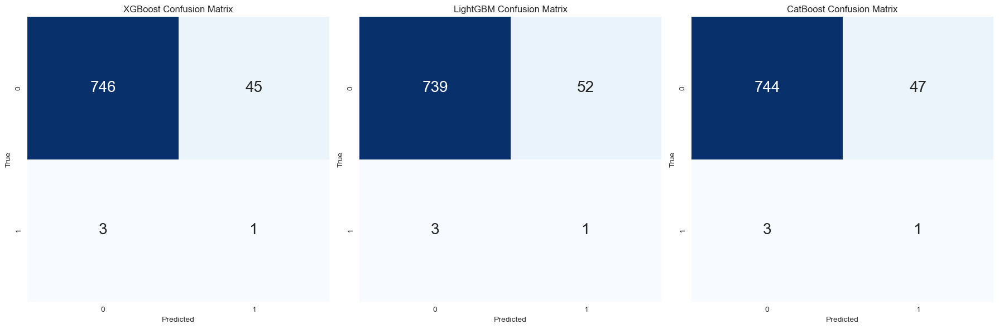

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,215600,0.020895,0.012661,59.0,-0.314940,0.345891,1,1.0,1.0,3.0,0.0
1,20190614,003670,0.067675,0.027949,78.0,-0.545014,0.544793,1,1.0,1.0,3.0,0.0
2,20190614,005387,0.032671,0.013763,88.0,0.347060,0.246887,1,1.0,1.0,3.0,0.0
3,20190614,081660,-0.039547,0.017649,94.0,-0.677893,0.608751,1,1.0,1.0,3.0,1.0
4,20190614,028300,0.065256,0.023947,95.0,0.300692,0.539088,1,1.0,1.0,3.0,0.0
5,20190614,000060,0.017700,0.019866,103.0,0.507620,0.351623,1,1.0,1.0,3.0,0.0
6,20190614,263750,0.048841,0.022259,105.0,-0.096631,0.591686,1,1.0,1.0,3.0,0.0
7,20190614,253450,0.002275,0.016558,107.0,0.071629,0.478125,1,1.0,1.0,3.0,0.0
8,20190614,138040,-0.008230,0.012244,130.0,0.379101,0.762140,1,1.0,1.0,3.0,0.0
9,20190614,034230,0.002774,0.015597,132.0,-0.670644,0.535304,1,1.0,1.0,3.0,0.0


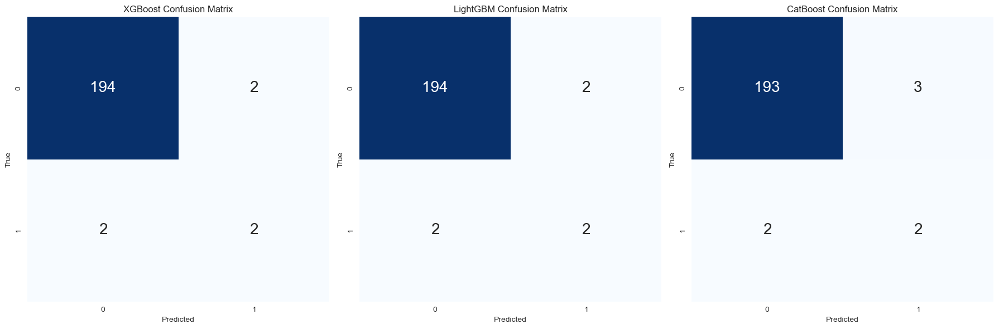

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,019680,0.009331,0.013197,316.0,0.115636,0.668865,1,1.0,1.0,3.0,0.0
1,20190614,003300,-0.010490,0.023672,439.0,0.431846,0.282725,1,1.0,1.0,3.0,1.0
2,20190614,036580,-0.067741,0.022695,504.0,-0.759342,0.592210,1,1.0,1.0,3.0,1.0
3,20190614,003030,-0.005753,0.021222,659.0,-0.252998,0.782165,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 28.177999999999997
편출 예측 종목 공매도수익률 = 5.9875
총수익률 = 34.165499999999994
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 2022

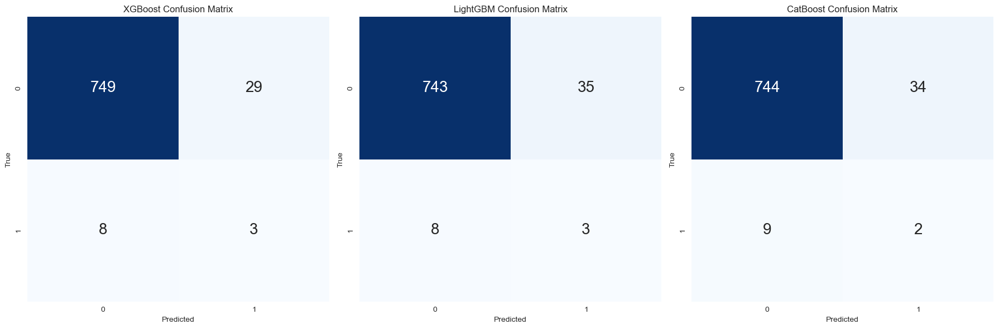

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20200612,091990,0.083838,0.036040,33.0,0.980577,0.274826,1,1.0,1.0,3.0,0.0
1,20200612,180640,0.018462,0.013029,91.0,0.527878,0.909949,1,1.0,1.0,3.0,1.0
2,20200612,005385,0.017919,0.025321,113.0,0.346354,0.543432,1,1.0,1.0,3.0,0.0
3,20200612,013890,0.023642,0.017937,134.0,0.508780,0.543848,1,1.0,1.0,3.0,0.0
4,20200612,181710,-0.005284,0.026344,137.0,0.094059,0.448408,1,1.0,1.0,3.0,0.0
5,20200612,068760,0.022906,0.025797,141.0,-0.069746,0.389321,1,1.0,1.0,3.0,0.0
6,20200612,058470,0.126719,0.032364,158.0,0.468888,0.531618,1,1.0,1.0,3.0,0.0
7,20200612,330590,-0.014110,0.022139,187.0,0.581328,0.874511,1,1.0,1.0,3.0,0.0


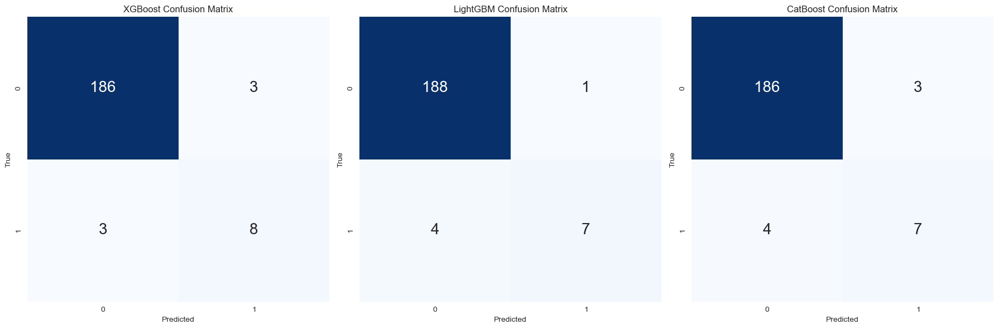

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20200612,005850,-0.060800,0.039508,220.0,0.595164,0.905256,1,1.0,1.0,3.0,1.0
1,20200612,025540,-0.025808,0.042400,395.0,0.548865,0.689066,1,1.0,1.0,3.0,1.0
2,20200612,002240,-0.067139,0.016096,436.0,0.429409,0.682517,1,1.0,1.0,3.0,0.0
3,20200612,003920,-0.002430,0.015241,507.0,0.310155,0.471714,1,1.0,1.0,3.0,1.0
4,20200612,003620,-0.090637,0.022391,523.0,-0.846980,0.595948,1,1.0,1.0,3.0,1.0
5,20200612,001520,-0.116260,0.022202,575.0,0.022108,0.546303,1,1.0,1.0,3.0,1.0
6,20200612,079430,-0.126218,0.030328,649.0,0.708999,0.804542,1,1.0,1.0,3.0,1.0
7,20200612,298040,-0.097123,0.030220,681.0,0.793038,0.705324,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 19.095999999999997
편출 예측 종목 공매도수익률 = -2.4325
총수익률 = 16.663499999999996
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 202

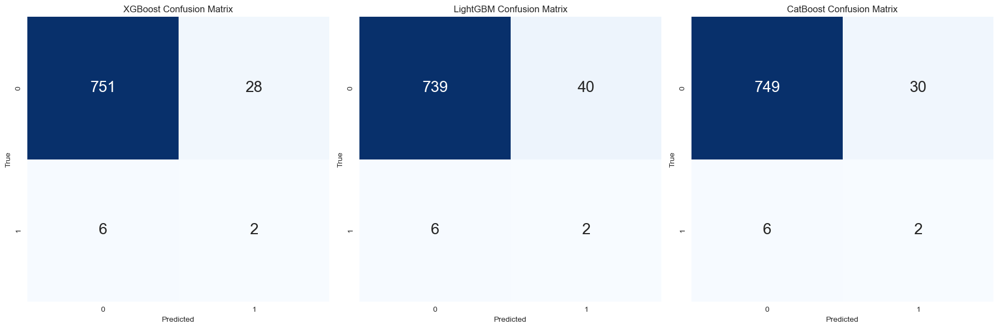

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,035760,-0.019467,0.008836,99.0,-0.360004,0.392162,1,1.0,1.0,3.0,0.0
1,20201211,058470,0.089814,0.045568,117.0,0.658398,0.738510,1,1.0,1.0,3.0,0.0
2,20201211,005290,0.037329,0.026958,137.0,-0.764965,0.535382,1,1.0,1.0,3.0,0.0
3,20201211,098460,0.040739,0.018603,166.0,0.693704,0.452712,1,1.0,1.0,3.0,0.0
4,20201211,056190,0.055929,0.019259,174.0,0.535601,0.510290,1,1.0,1.0,3.0,0.0
5,20201211,013890,-0.066120,0.014118,190.0,-0.764529,0.645337,1,1.0,1.0,3.0,1.0


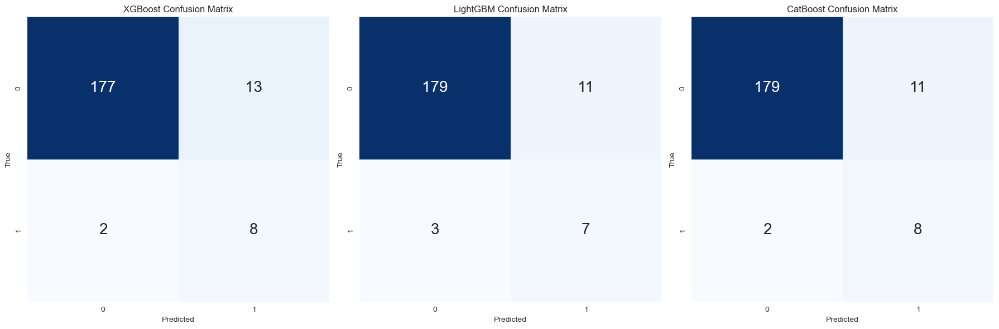

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,010120,-0.087011,0.036540,139.0,-0.252958,0.675770,1,1.0,1.0,3.0,0.0
1,20201211,088350,-0.036129,0.019438,173.0,-1.110842,0.550816,1,1.0,1.0,3.0,0.0
2,20201211,192820,0.008547,0.015004,215.0,0.286915,0.409494,1,1.0,1.0,3.0,0.0
3,20201211,003850,0.040694,0.040095,248.0,0.085039,0.821349,1,1.0,1.0,3.0,0.0
4,20201211,006650,-0.074724,0.039818,261.0,0.184148,0.826305,1,1.0,1.0,3.0,0.0
5,20201211,103140,-0.014301,0.027972,290.0,-1.466251,0.753722,1,1.0,1.0,3.0,0.0
6,20201211,115390,-0.018434,0.008073,324.0,-0.200340,0.621602,1,1.0,1.0,3.0,0.0
7,20201211,014830,0.059216,0.013222,416.0,0.501851,0.855187,1,1.0,1.0,3.0,1.0
8,20201211,004490,0.008467,0.013554,424.0,0.574152,0.620354,1,1.0,1.0,3.0,0.0
9,20201211,027410,-0.011710,0.013344,443.0,0.169260,0.633201,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 31.65
편출 예측 종목 공매도수익률 = -17.936875
총수익률 = 13.713124999999998
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 20220119 2022

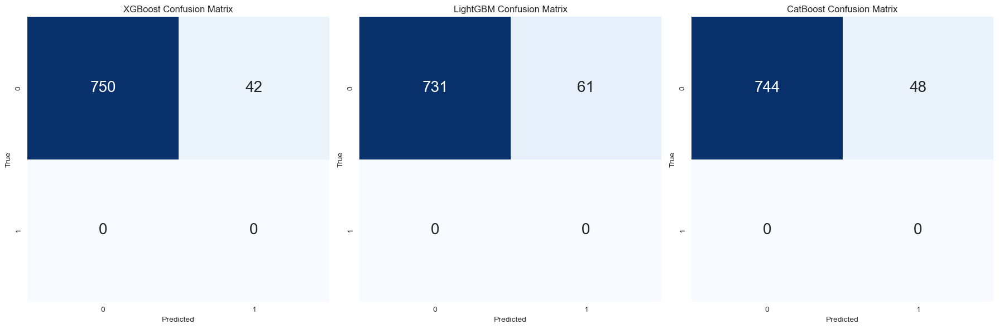

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,028300,-0.011584,0.012607,69.0,-0.057872,0.335562,1,1.0,1.0,3.0,0.0
1,20210610,051915,-0.021397,0.010207,86.0,0.209033,0.211208,1,1.0,1.0,3.0,0.0
2,20210610,293490,0.065702,0.018975,90.0,0.658660,0.937152,1,1.0,1.0,3.0,0.0
3,20210610,307950,0.084993,0.048949,117.0,-0.808943,0.480253,1,1.0,1.0,3.0,0.0
4,20210610,000060,0.084741,0.018968,149.0,0.271388,0.733318,1,1.0,1.0,3.0,0.0
5,20210610,336370,0.027081,0.032977,175.0,0.493997,0.682091,1,1.0,1.0,3.0,0.0
6,20210610,009900,-0.086488,0.034117,178.0,0.032965,0.559453,1,1.0,1.0,3.0,0.0
7,20210610,200130,-0.001907,0.032852,180.0,-0.079542,0.803221,1,1.0,1.0,3.0,0.0
8,20210610,060250,-0.004619,0.018219,185.0,-0.353583,0.470607,1,1.0,1.0,3.0,0.0
9,20210610,056190,0.026804,0.029024,190.0,0.835021,0.533631,1,1.0,1.0,3.0,0.0


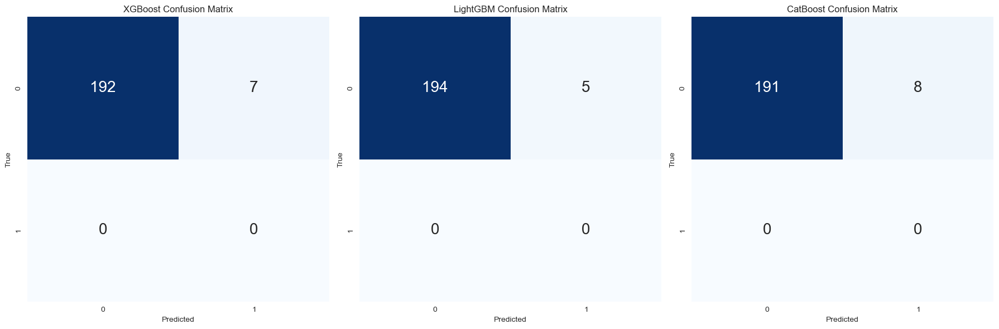

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,192820,0.100720,0.039423,230.0,0.516618,0.830380,1,1.0,1.0,3.0,0.0
1,20210610,114090,-0.003120,0.021697,246.0,-0.247516,0.570155,1,1.0,1.0,3.0,0.0
2,20210610,105630,0.072245,0.028144,356.0,-0.704317,0.910531,1,1.0,1.0,3.0,0.0
3,20210610,008350,0.040212,0.013903,447.0,0.010991,0.426494,1,1.0,1.0,3.0,0.0
4,20210610,009410,-0.084019,0.008382,461.0,-1.271164,0.560690,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -14.206
편출 예측 종목 공매도수익률 = -16.502
총수익률 = -30.708
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 20220119 20220120 2022012

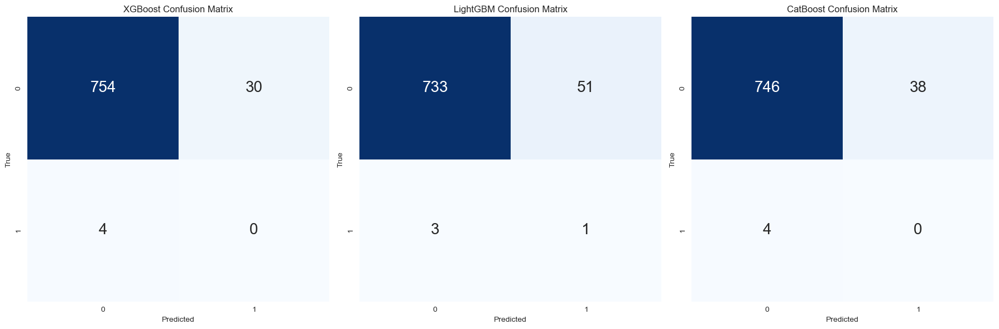

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,302440,0.033694,0.020697,33.0,0.257158,0.458277,1,1.0,1.0,3.0,0.0
1,20211210,196170,-0.041998,0.030287,106.0,-0.266991,0.468274,1,1.0,1.0,3.0,0.0
2,20211210,066970,-0.049139,0.012173,124.0,-0.633684,0.438907,1,1.0,1.0,3.0,0.0
3,20211210,237690,-0.003738,0.023185,165.0,0.424130,0.384675,1,1.0,1.0,3.0,0.0
4,20211210,098460,0.008282,0.024375,187.0,-0.220001,0.620776,1,1.0,1.0,3.0,0.0


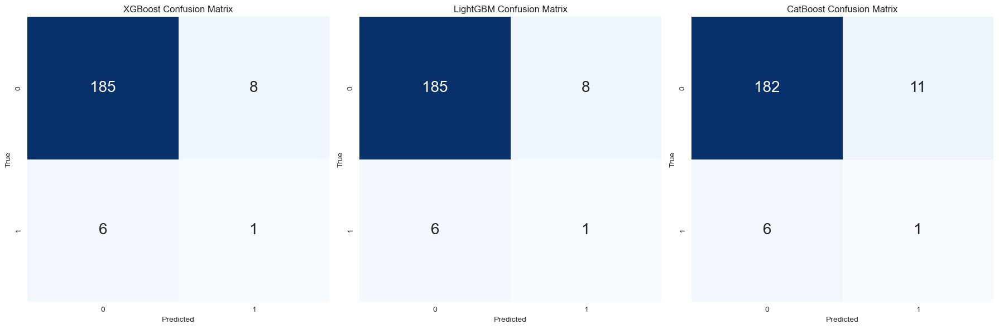

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,241590,-0.053584,0.030217,290.0,-0.326672,0.847487,1,1.0,1.0,3.0,0.0
1,20211210,005440,0.004988,0.016412,293.0,-0.644827,0.735971,1,1.0,1.0,3.0,0.0
2,20211210,006390,0.050940,0.018643,405.0,1.283873,0.545206,1,1.0,1.0,3.0,0.0
3,20211210,001060,-0.015612,0.008374,425.0,-0.918523,0.617752,1,1.0,1.0,3.0,0.0
4,20211210,005180,-0.048163,0.008957,440.0,-0.731336,0.423123,1,1.0,1.0,3.0,0.0
5,20211210,009410,-0.004073,0.008617,532.0,-0.584108,0.235608,1,1.0,1.0,3.0,0.0
6,20211210,008350,-0.104382,0.016515,564.0,-0.685663,0.439843,1,1.0,1.0,3.0,0.0
7,20211210,007700,-0.035367,0.016890,813.0,-1.548304,0.421549,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 50.9
편출 예측 종목 공매도수익률 = 16.45375
총수익률 = 67.35374999999999
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 20220119 20220120

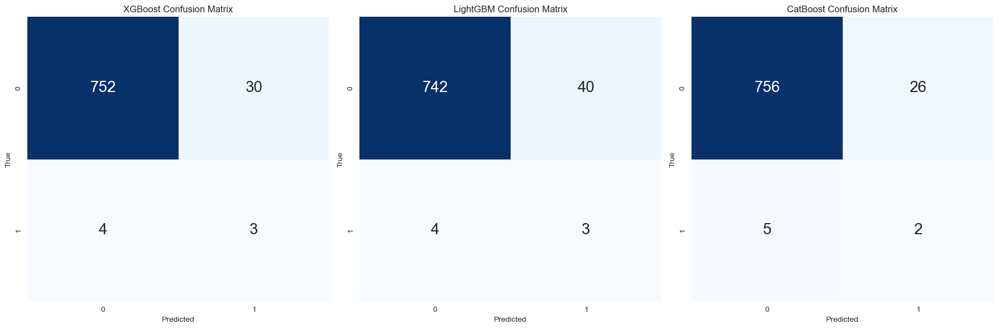

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,066970,0.015385,0.021912,57.0,0.618267,0.283947,1,1.0,1.0,3.0,0.0
1,20220610,137310,0.140480,0.024580,65.0,0.287257,0.435787,1,1.0,1.0,3.0,1.0
2,20220610,293490,-0.015659,0.027552,69.0,-0.065901,0.348285,1,1.0,1.0,3.0,0.0
3,20220610,307950,-0.029742,0.021077,96.0,-0.562707,0.523406,1,1.0,1.0,3.0,0.0
4,20220610,058470,-0.034881,0.022539,112.0,-0.076935,0.349469,1,1.0,1.0,3.0,0.0
5,20220610,005385,-0.045810,0.011166,133.0,0.433521,0.405856,1,1.0,1.0,3.0,0.0
6,20220610,336370,-0.043894,0.033589,134.0,-0.011224,0.578093,1,1.0,1.0,3.0,0.0
7,20220610,357780,-0.001578,0.031034,161.0,0.180069,0.369935,1,1.0,1.0,3.0,0.0
8,20220610,078340,0.031169,0.033719,171.0,0.022220,0.362945,1,1.0,1.0,3.0,0.0
9,20220610,348370,-0.064842,0.057051,179.0,0.021751,0.539922,1,1.0,1.0,3.0,0.0


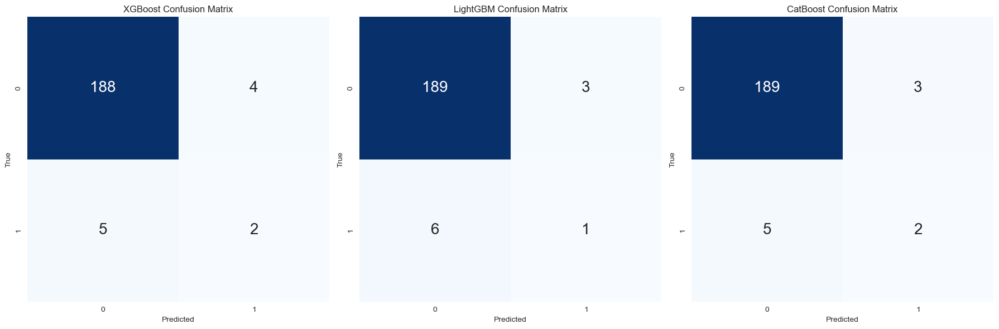

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,013890,-0.015504,0.022625,246.0,0.052585,0.590936,1,1.0,1.0,3.0,0.0
1,20220610,032350,-0.070826,0.013171,247.0,-0.246096,0.525302,1,1.0,1.0,3.0,0.0
2,20220610,049770,-0.040166,0.013748,362.0,-0.354407,0.704410,1,1.0,1.0,3.0,0.0
3,20220610,192400,-0.021681,0.006980,389.0,0.638832,0.463029,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -7.960000000000001
편출 예측 종목 공매도수익률 = 7.865
총수익률 = -0.09500000000000064
20100120 20100121 20100122 20100125 20100126 20100127 20100128 20110117 20110118 20110119 20110120 20110121 20110124 20110125 20120125 20120126 20120127 20120130 20120131 20120201 20120202 20130123 20130124 20130125 20130128 20130129 20130130 20130131 20140120 20140121 20140122 20140123 20140124 20140127 20140128 20150120 20150121 20150122 20150123 20150126 20150127 20150128 20160115 20160118 20160119 20160120 20160121 20160122 20160125 20170113 20170116 20170117 20170118 20170119 20170120 20170123 20180119 20180122 20180123 20180124 20180125 20180126 20180129 20190121 20190122 20190123 20190124 20190125 20190128 20190129 20200121 20200122 20200123 20200128 20200129 20200130 20200131 20200722 20200723 20200724 20200727 20200728 20200729 20200730 20210119 20210120 20210121 20210122 20210125 20210126 20210127 20210720 20210721 20210722 20210723 20210726 20210727 20210728 20220114 20220117 20220118 202

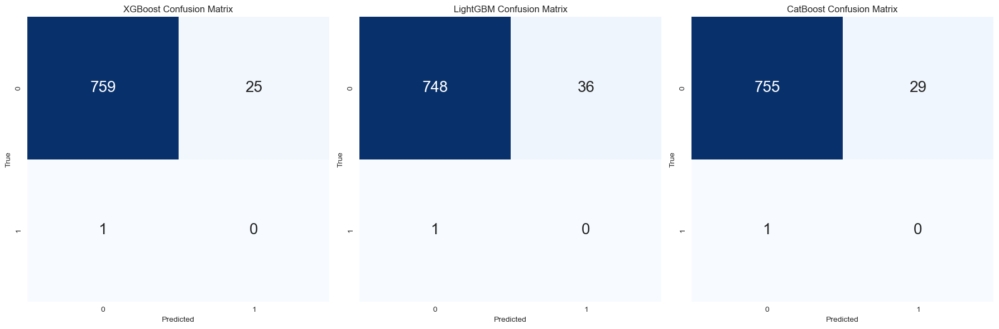

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,247540,0.078712,0.018959,29.0,-0.524869,0.514552,1,1.0,1.0,3.0,0.0
1,20221209,091990,0.022379,0.022085,31.0,0.069379,0.453665,1,1.0,1.0,3.0,0.0
2,20221209,293490,-0.031561,0.019433,82.0,-0.244163,0.419975,1,1.0,1.0,3.0,0.0
3,20221209,196170,0.010582,0.012381,114.0,-0.335027,0.381505,1,1.0,1.0,3.0,0.0
4,20221209,035760,-0.029705,0.018122,134.0,-0.317276,0.489819,1,1.0,1.0,3.0,0.0
5,20221209,086520,0.001104,0.026161,138.0,-0.877457,0.621403,1,1.0,1.0,3.0,0.0
6,20221209,357780,0.040964,0.019146,159.0,0.168330,0.476432,1,1.0,1.0,3.0,0.0
7,20221209,005070,0.001860,0.018603,172.0,-0.097447,0.522371,1,1.0,1.0,3.0,0.0
8,20221209,240810,0.004835,0.021907,180.0,-0.180123,0.439030,1,1.0,1.0,3.0,0.0
9,20221209,353200,-0.031805,0.016291,193.0,-0.049619,0.520759,1,1.0,1.0,3.0,0.0


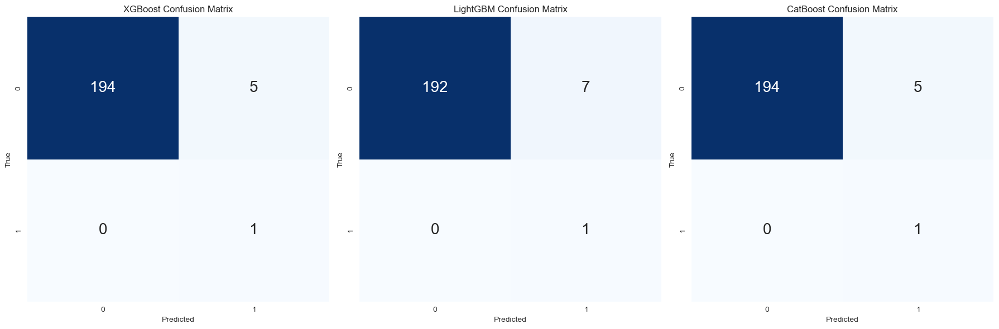

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,192820,-0.049832,0.014243,307.0,-0.875819,0.543744,1,1.0,1.0,3.0,0.0
1,20221209,001680,0.004566,0.010747,319.0,-0.564711,0.550494,1,1.0,1.0,3.0,0.0
2,20221209,284740,0.016367,0.015385,334.0,-0.640604,0.422893,1,1.0,1.0,3.0,0.0
3,20221209,105630,-0.027316,0.012374,345.0,0.000374,0.688409,1,1.0,1.0,3.0,0.0
4,20221209,000070,0.000000,0.011070,354.0,0.041205,0.823827,1,1.0,1.0,3.0,1.0
5,20221209,057050,0.000000,0.009344,361.0,-0.544214,0.577216,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -2.436666666666666
편출 예측 종목 공매도수익률 = 2.5933333333333333
총수익률 = 0.15666666666666718


In [49]:
returns90 = 0 
for date in inout_days[3:]:
    try: 
        ret_back = predict_and_test(date,n = 90)
        returns90 += ret_back
    except Exception as e:
        print(e)

In [50]:
print(f"90일전 예측한경우의 10년 return 평균= {returns90/len(inout_days[3:]):.2f}%")

90일전 예측한경우의 10년 return 평균= 6.55%


### 60일

20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220308 20220310 20220311 20220314 20220901 20220902 20220905 20220906 20220907 20220908 2

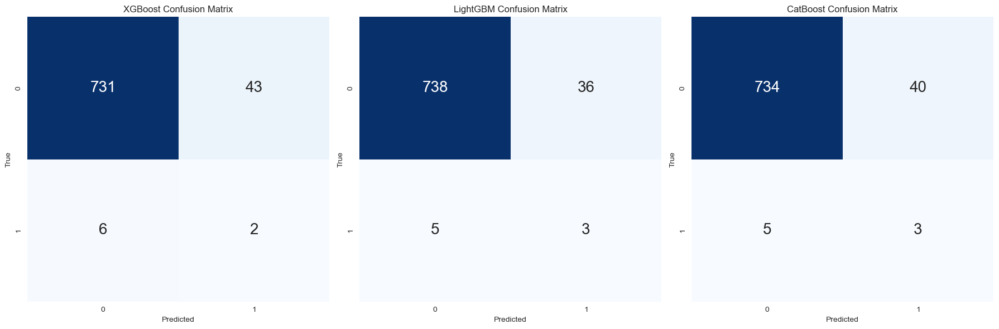

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,139480,0.004695,0.009193,42.0,0.309421,0.304572,1,1.0,1.0,3.0,1.0
1,20130614,001450,-0.006289,0.012358,79.0,0.720979,0.289243,1,1.0,1.0,3.0,0.0
2,20130614,051600,-0.001914,0.019638,89.0,1.420145,0.481909,1,1.0,1.0,3.0,0.0
3,20130614,047810,0.035756,0.026136,93.0,0.917945,0.599016,1,1.0,1.0,3.0,1.0
4,20130614,139130,0.054725,0.017587,95.0,0.401455,0.405658,1,1.0,1.0,3.0,0.0
5,20130614,035760,-0.020769,0.022420,109.0,-0.003467,0.347982,1,1.0,1.0,3.0,0.0
6,20130614,071840,0.051293,0.022397,117.0,0.794641,0.977777,1,1.0,1.0,3.0,0.0
7,20130614,046890,-0.070499,0.029345,119.0,1.071006,0.686978,1,1.0,1.0,3.0,0.0
8,20130614,057050,-0.007194,0.025437,120.0,0.443351,0.406167,1,1.0,1.0,3.0,0.0
9,20130614,078520,-0.052776,0.035721,172.0,-0.457731,0.678456,1,1.0,1.0,3.0,0.0


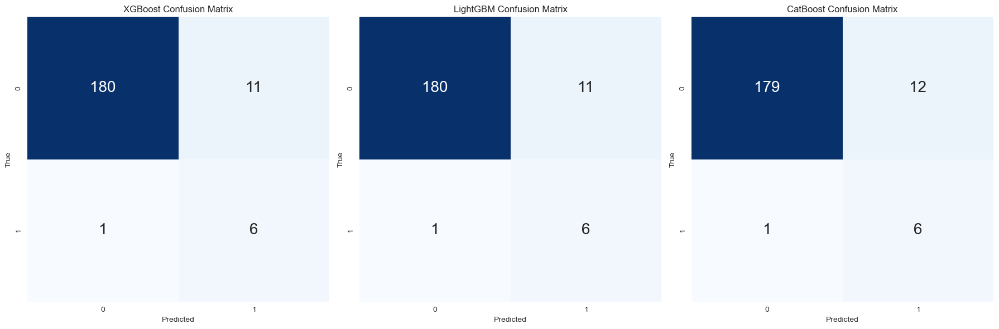

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,001440,-0.144200,0.029260,324.0,-0.101498,0.628671,1,1.0,1.0,3.0,0.0
1,20130614,001520,-0.086328,0.035016,345.0,-0.118191,0.679645,1,1.0,1.0,3.0,0.0
2,20130614,104700,-0.035975,0.032141,401.0,0.753562,0.554318,1,1.0,1.0,3.0,0.0
3,20130614,000700,-0.059210,0.027978,420.0,-0.051718,1.118586,1,1.0,1.0,3.0,0.0
4,20130614,001130,-0.014546,0.011275,432.0,0.396242,0.530282,1,1.0,1.0,3.0,1.0
5,20130614,000050,0.007705,0.008875,436.0,0.602015,0.630983,1,1.0,1.0,3.0,1.0
6,20130614,077970,-0.027196,0.022531,437.0,-0.172420,0.586096,1,1.0,1.0,3.0,0.0
7,20130614,003120,0.030537,0.013607,454.0,-2.607569,2.650739,1,1.0,1.0,3.0,0.0
8,20130614,008040,0.069648,0.017777,459.0,1.273834,0.576296,1,1.0,1.0,3.0,1.0
9,20130614,003480,-0.012251,0.012712,493.0,-0.021368,0.523172,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -2.2775000000000007
편출 예측 종목 공매도수익률 = 11.509999999999998
총수익률 = 9.232499999999998
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 2

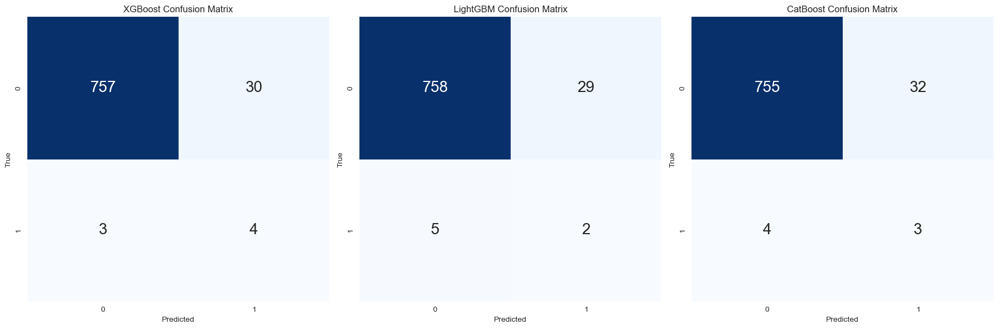

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,005935,0.000000,0.004864,8.0,0.610472,0.434539,1,1.0,1.0,3.0,0.0
1,20140613,161390,-0.008271,0.011559,32.0,0.793685,0.342575,1,1.0,1.0,3.0,1.0
2,20140613,068270,-0.068221,0.038473,57.0,0.179864,0.909282,1,1.0,1.0,3.0,0.0
3,20140613,008770,0.024321,0.026803,65.0,0.410468,0.512710,1,1.0,1.0,3.0,0.0
4,20140613,034230,0.068118,0.026080,77.0,-0.231646,0.437581,1,1.0,1.0,3.0,0.0
5,20140613,114090,0.019757,0.027552,84.0,0.597599,0.334466,1,1.0,1.0,3.0,0.0
6,20140613,057050,-0.038343,0.022560,114.0,0.682462,0.455775,1,1.0,1.0,3.0,0.0
7,20140613,009240,-0.022188,0.025072,133.0,0.269258,0.484083,1,1.0,1.0,3.0,0.0


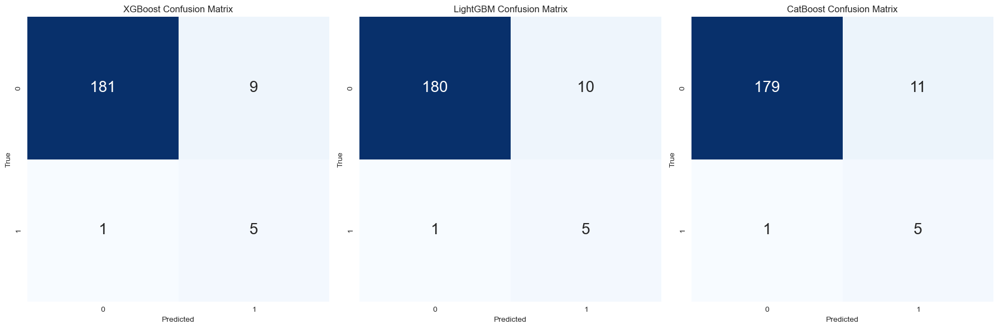

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,013570,-0.028304,0.025096,356.0,0.099551,0.608861,1,1.0,1.0,3.0,0.0
1,20140613,025000,-0.029947,0.012973,379.0,0.656871,1.027421,1,1.0,1.0,3.0,1.0
2,20140613,007690,-0.030615,0.016320,397.0,0.663230,0.562001,1,1.0,1.0,3.0,0.0
3,20140613,007810,-0.021693,0.033078,416.0,-0.429000,0.936403,1,1.0,1.0,3.0,0.0
4,20140613,002020,0.059680,0.063809,447.0,0.725113,1.069192,1,1.0,1.0,3.0,0.0
5,20140613,004430,-0.081580,0.020581,457.0,0.284544,0.609443,1,1.0,1.0,3.0,0.0
6,20140613,000700,-0.013828,0.024813,520.0,0.415166,0.693124,1,1.0,1.0,3.0,0.0
7,20140613,005950,-0.044951,0.019985,530.0,0.337210,0.742119,1,1.0,1.0,3.0,0.0
8,20140613,005690,0.078894,0.031767,536.0,-0.743784,0.503638,1,1.0,1.0,3.0,1.0
9,20140613,006380,-0.168290,0.052808,540.0,0.887566,0.653749,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 8.485
편출 예측 종목 공매도수익률 = -1.3049999999999986
총수익률 = 7.180000000000001
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220

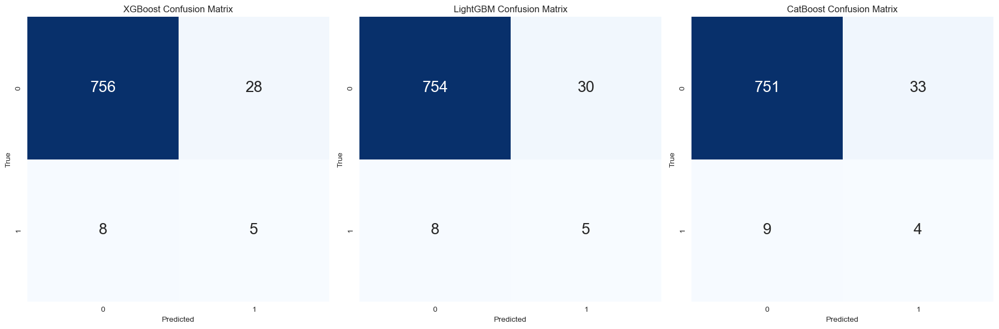

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,035720,-0.092773,0.018433,40.0,0.845042,0.417412,1,1.0,1.0,3.0,0.0
1,20150612,026960,-0.104799,0.032347,85.0,0.895181,0.790985,1,1.0,1.0,3.0,0.0
2,20150612,027410,0.030804,0.023776,99.0,0.201865,0.224628,1,1.0,1.0,3.0,0.0
3,20150612,078340,0.065268,0.026736,107.0,0.318412,0.240548,1,1.0,1.0,3.0,0.0
4,20150612,039130,0.074476,0.027560,172.0,0.187391,0.403914,1,1.0,1.0,3.0,0.0
5,20150612,200130,0.030877,0.023528,182.0,1.243242,0.599718,1,1.0,1.0,3.0,0.0
6,20150612,096530,-0.010959,0.019297,194.0,-0.744216,0.687011,1,1.0,1.0,3.0,0.0


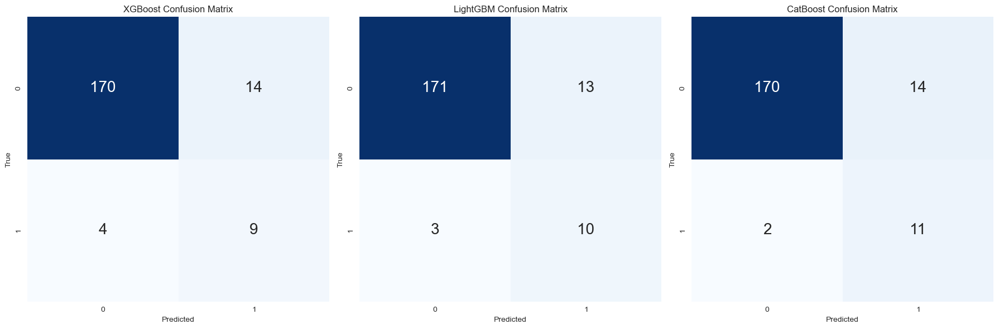

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,014830,0.009662,0.022212,342.0,-0.683661,0.682906,1,1.0,1.0,3.0,0.0
1,20150612,003570,-0.036701,0.018281,396.0,-0.438852,0.967968,1,1.0,1.0,3.0,0.0
2,20150612,002020,-0.034580,0.016534,416.0,-0.087781,0.891047,1,1.0,1.0,3.0,0.0
3,20150612,000140,0.000000,0.023980,462.0,0.528972,0.740696,1,1.0,1.0,3.0,0.0
4,20150612,104700,0.001599,0.014704,463.0,0.794614,1.219796,1,1.0,1.0,3.0,0.0
5,20150612,007690,-0.037967,0.010583,466.0,-1.884131,0.523897,1,1.0,1.0,3.0,0.0
6,20150612,000990,-0.090177,0.030384,472.0,-1.041051,1.271055,1,1.0,1.0,3.0,1.0
7,20150612,004130,-0.053110,0.019479,480.0,-1.162157,0.716626,1,1.0,1.0,3.0,1.0
8,20150612,010690,0.014112,0.023696,483.0,0.072204,0.498806,1,1.0,1.0,3.0,0.0
9,20150612,003520,0.000000,0.030699,485.0,0.532379,0.593904,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 37.455
편출 예측 종목 공매도수익률 = -22.317
총수익률 = 15.137999999999998
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220308 202203

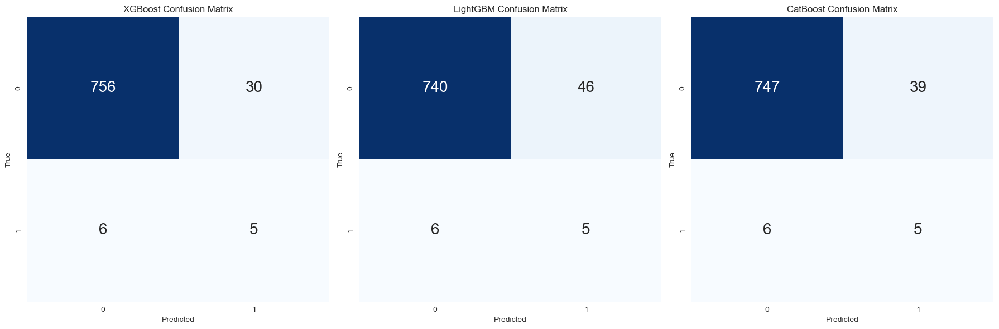

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,086900,0.045611,0.028998,90.0,0.119621,0.670632,1,1.0,1.0,3.0,0.0
1,20160610,001440,0.014110,0.009173,100.0,0.390813,0.322681,1,1.0,1.0,3.0,0.0
2,20160610,090435,-0.020955,0.027564,105.0,-0.312502,0.651696,1,1.0,1.0,3.0,0.0
3,20160610,111770,0.033020,0.037463,106.0,-0.307163,0.442442,1,1.0,1.0,3.0,0.0
4,20160610,016170,0.038001,0.035790,111.0,0.376777,0.980909,1,1.0,1.0,3.0,0.0
5,20160610,192400,-0.043580,0.033538,116.0,1.369431,0.790625,1,1.0,1.0,3.0,1.0
6,20160610,056190,0.013093,0.018152,183.0,-1.629412,0.481739,1,1.0,1.0,3.0,0.0
7,20160610,016450,0.077458,0.024556,198.0,0.430160,0.580993,1,1.0,1.0,3.0,0.0


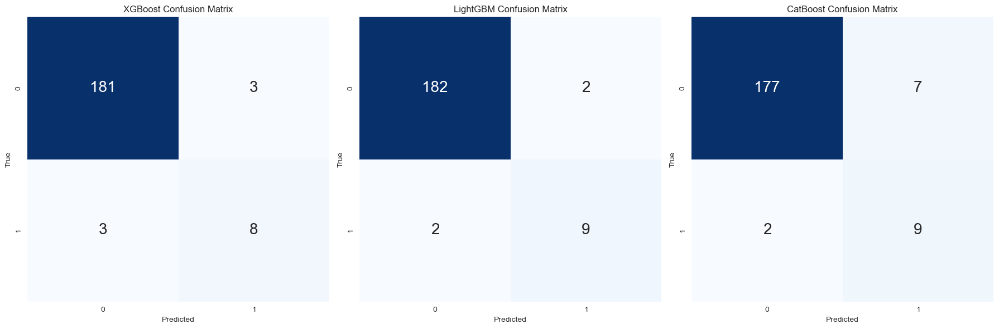

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,004490,0.033774,0.016800,293.0,-1.052062,0.843561,1,1.0,1.0,3.0,0.0
1,20160610,042700,-0.069796,0.018303,460.0,0.217012,0.427792,1,1.0,1.0,3.0,1.0
2,20160610,079980,0.068578,0.018342,485.0,-0.019274,0.564164,1,1.0,1.0,3.0,1.0
3,20160610,007860,0.061621,0.019052,511.0,-1.420539,0.906501,1,1.0,1.0,3.0,1.0
4,20160610,009580,0.050354,0.016688,512.0,-0.475380,0.273715,1,1.0,1.0,3.0,1.0
5,20160610,004700,0.153104,0.022174,533.0,1.133052,0.651576,1,1.0,1.0,3.0,0.0
6,20160610,082740,0.049285,0.035667,564.0,-0.570387,0.990754,1,1.0,1.0,3.0,1.0
7,20160610,010690,0.112064,0.033190,598.0,-0.675514,0.285703,1,1.0,1.0,3.0,1.0
8,20160610,084870,0.009662,0.014405,629.0,-0.282676,0.531042,1,1.0,1.0,3.0,1.0
9,20160610,033530,0.007411,0.014333,676.0,0.082651,0.687404,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -12.132000000000001
편출 예측 종목 공매도수익률 = -1.6380000000000003
총수익률 = -13.770000000000001
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 2022030

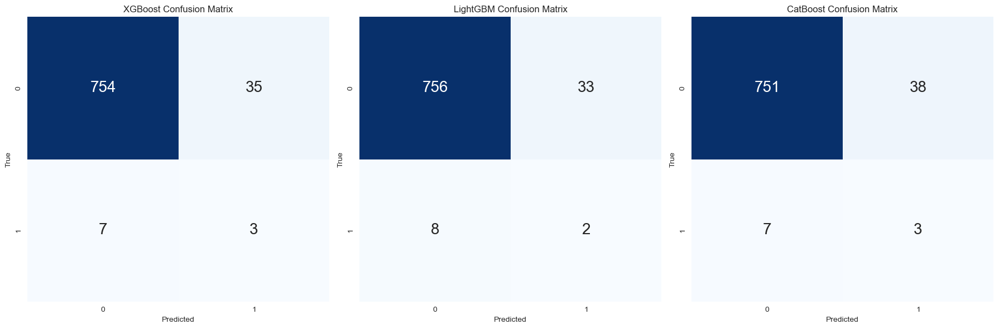

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,036490,0.016876,0.026059,114.0,0.013234,0.695972,1,1.0,1.0,3.0,0.0
1,20170609,041960,0.022849,0.016565,117.0,0.371746,0.572514,1,1.0,1.0,3.0,0.0
2,20170609,079160,-0.031274,0.034619,133.0,0.249700,0.907073,1,1.0,1.0,3.0,1.0


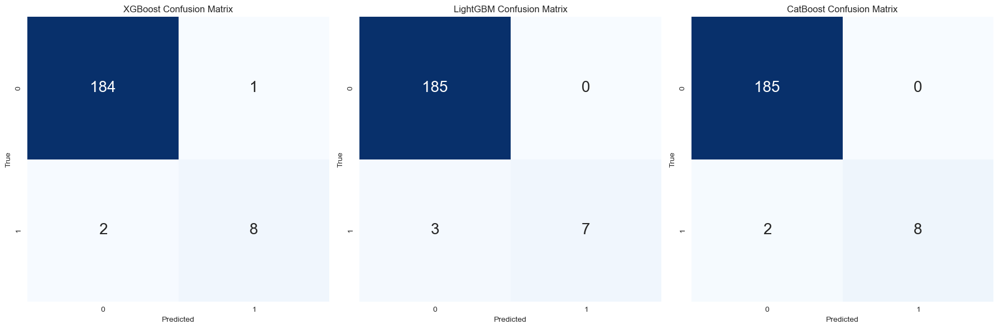

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,005090,-0.026907,0.011512,430.0,-1.141311,0.539272,1,1.0,1.0,3.0,1.0
1,20170609,003570,-0.018968,0.011169,464.0,-0.535824,0.492191,1,1.0,1.0,3.0,1.0
2,20170609,007210,-0.058671,0.029859,478.0,-0.675939,0.272679,1,1.0,1.0,3.0,1.0
3,20170609,007690,-0.027670,0.010630,480.0,-0.171664,0.622827,1,1.0,1.0,3.0,1.0
4,20170609,003200,0.012793,0.010439,489.0,1.441180,1.037723,1,1.0,1.0,3.0,1.0
5,20170609,000140,-0.004283,0.009619,515.0,0.380649,0.719940,1,1.0,1.0,3.0,1.0
6,20170609,000230,-0.047808,0.011576,877.0,0.508470,0.643469,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 14.64
편출 예측 종목 공매도수익률 = 0.9171428571428571
총수익률 = 15.557142857142857
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220

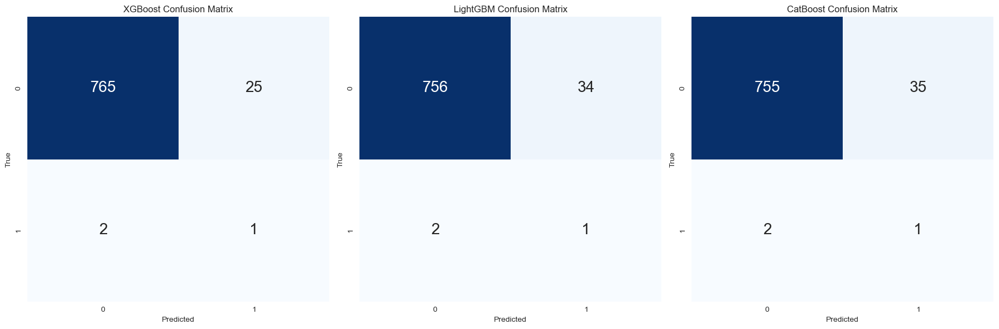

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,035720,0.088903,0.022845,34.0,0.465621,0.724846,1,1.0,1.0,3.0,0.0
1,20180615,215600,0.114048,0.034297,40.0,0.677102,0.721198,1,1.0,1.0,3.0,0.0
2,20180615,084990,0.070333,0.039471,72.0,0.353513,0.370626,1,1.0,1.0,3.0,0.0
3,20180615,079440,-0.060122,0.028341,73.0,0.056476,0.732102,1,1.0,1.0,3.0,0.0
4,20180615,003670,0.031427,0.022681,100.0,-0.806177,0.727822,1,1.0,1.0,3.0,0.0
5,20180615,263750,0.021979,0.028488,101.0,-0.815404,0.641127,1,1.0,1.0,3.0,0.0
6,20180615,145020,0.015276,0.032051,112.0,0.577060,0.679121,1,1.0,1.0,3.0,0.0
7,20180615,138040,-0.020135,0.021369,127.0,1.168019,0.819477,1,1.0,1.0,3.0,0.0


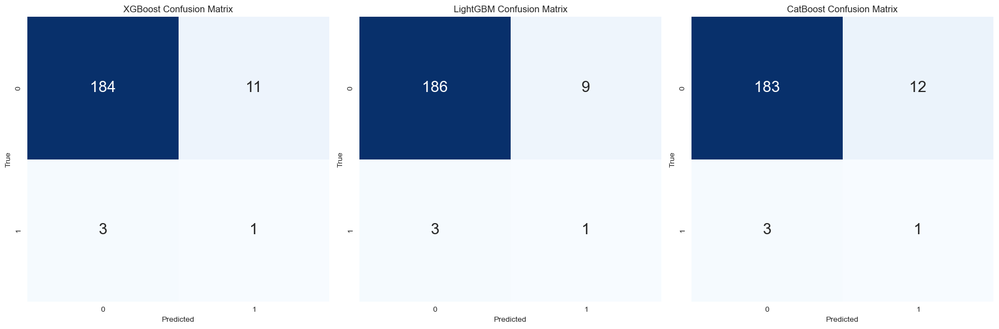

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,025860,-0.012270,0.064211,320.0,-1.781910,0.700459,1,1.0,1.0,3.0,0.0
1,20180615,025540,-0.035153,0.013248,332.0,0.656452,0.714288,1,1.0,1.0,3.0,0.0
2,20180615,003030,0.031178,0.028448,369.0,0.421939,0.792003,1,1.0,1.0,3.0,0.0
3,20180615,034120,-0.005982,0.020392,389.0,-0.315329,0.762094,1,1.0,1.0,3.0,0.0
4,20180615,002960,0.002959,0.026509,414.0,-0.817246,0.542073,1,1.0,1.0,3.0,0.0
5,20180615,014830,0.022297,0.009325,455.0,-0.480608,0.390837,1,1.0,1.0,3.0,0.0
6,20180615,000050,0.055673,0.011413,485.0,-0.788913,0.238846,1,1.0,1.0,3.0,1.0
7,20180615,097230,0.001516,0.009170,520.0,-0.363601,0.454312,1,1.0,1.0,3.0,0.0
8,20180615,004710,0.034820,0.020699,596.0,-0.713329,0.621691,1,1.0,1.0,3.0,0.0
9,20180615,001780,-0.029532,0.016393,619.0,0.349625,0.396943,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -13.743333333333334
편출 예측 종목 공매도수익률 = -7.242999999999999
총수익률 = -20.986333333333334
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304

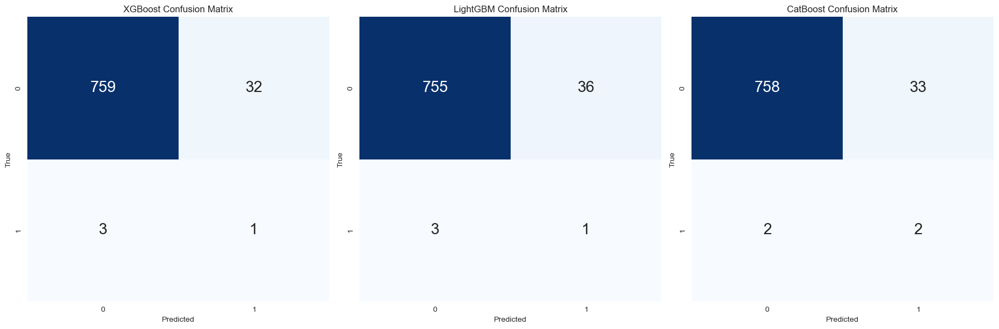

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,035760,0.031117,0.026174,56.0,0.230926,0.622793,1,1.0,1.0,3.0,0.0
1,20190614,084990,0.061648,0.027986,65.0,0.320920,0.619994,1,1.0,1.0,3.0,0.0
2,20190614,081660,0.080539,0.022276,69.0,0.100583,0.545282,1,1.0,1.0,3.0,1.0
3,20190614,028300,0.020810,0.038428,85.0,-0.048489,0.530091,1,1.0,1.0,3.0,0.0
4,20190614,253450,0.014001,0.026362,103.0,-0.227198,0.826127,1,1.0,1.0,3.0,0.0
5,20190614,005385,-0.012632,0.021713,135.0,0.427698,0.797723,1,1.0,1.0,3.0,0.0
6,20190614,034230,0.013072,0.028134,137.0,1.205793,0.498393,1,1.0,1.0,3.0,0.0
7,20190614,056190,0.024693,0.027403,142.0,0.006718,0.574336,1,1.0,1.0,3.0,0.0


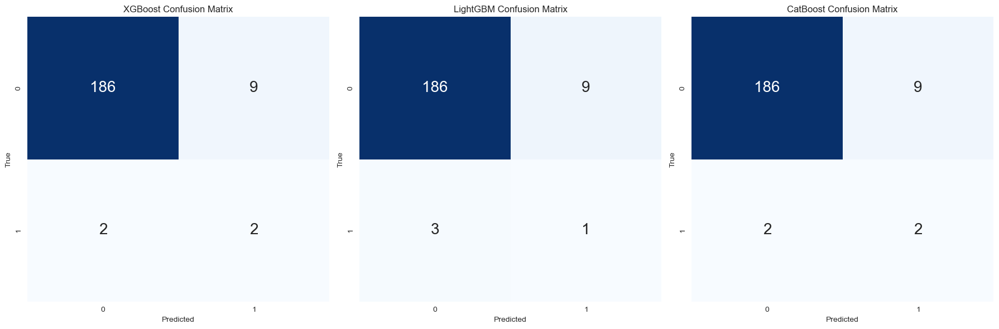

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,108670,-0.004556,0.014905,325.0,0.270851,0.462315,1,1.0,1.0,3.0,0.0
1,20190614,025860,0.000000,0.032105,333.0,-0.243141,0.637797,1,1.0,1.0,3.0,0.0
2,20190614,002240,0.042403,0.011610,346.0,-0.987110,0.798708,1,1.0,1.0,3.0,0.0
3,20190614,003850,0.051534,0.018667,362.0,0.023394,0.572369,1,1.0,1.0,3.0,0.0
4,20190614,001520,0.032625,0.015386,364.0,-0.296656,0.850758,1,1.0,1.0,3.0,0.0
5,20190614,096760,0.001352,0.017994,367.0,-0.414641,0.586263,1,1.0,1.0,3.0,0.0
6,20190614,060980,0.042905,0.023928,381.0,-0.175841,1.002195,1,1.0,1.0,3.0,0.0
7,20190614,002960,0.006051,0.013617,397.0,0.202941,0.562985,1,1.0,1.0,3.0,0.0
8,20190614,003300,-0.014926,0.009523,506.0,0.307159,0.436013,1,1.0,1.0,3.0,1.0
9,20190614,003030,0.013793,0.006500,698.0,-0.167939,0.597837,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 14.625
편출 예측 종목 공매도수익률 = 6.437
총수익률 = 21.062
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220308 20220310 20220311 20

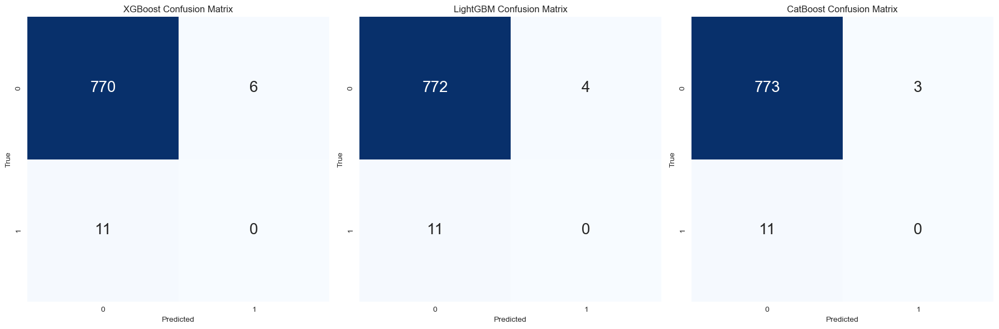

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value


index 0 is out of bounds for axis 0 with size 0
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220308 20220310 20220311 20220314 2022090

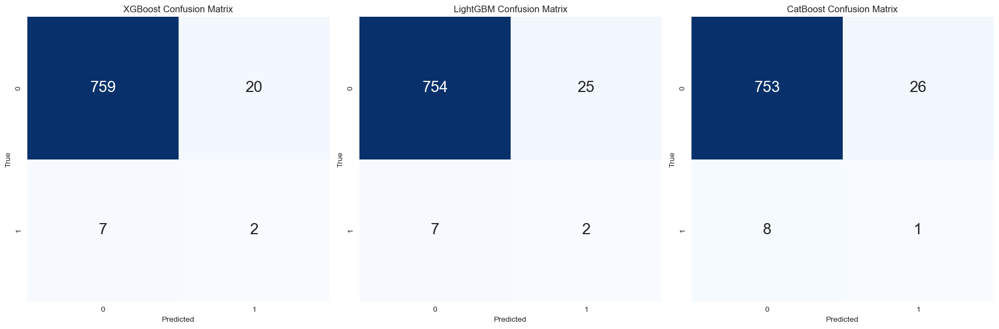

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,019170,-0.019355,0.056330,35.0,0.315910,0.651790,1,1.0,1.0,3.0,1.0
1,20201211,068760,0.081276,0.046906,62.0,2.096100,0.768871,1,1.0,1.0,3.0,0.0
2,20201211,145020,0.097846,0.030730,106.0,-0.059237,0.536757,1,1.0,1.0,3.0,0.0
3,20201211,034230,-0.003578,0.021458,190.0,-0.491842,0.542314,1,1.0,1.0,3.0,0.0
4,20201211,088800,-0.035204,0.031869,199.0,-0.534119,0.633923,1,1.0,1.0,3.0,0.0


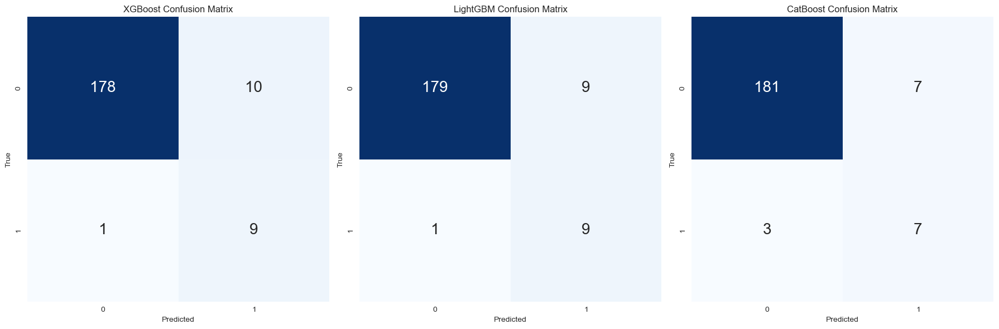

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,105630,0.023325,0.042780,302.0,-0.670207,0.485172,1,1.0,1.0,3.0,0.0
1,20201211,000070,-0.027151,0.011959,367.0,0.257872,0.264615,1,1.0,1.0,3.0,0.0
2,20201211,005180,-0.045147,0.010841,375.0,0.200119,0.228783,1,1.0,1.0,3.0,0.0
3,20201211,005610,-0.004850,0.012039,380.0,0.800374,0.442961,1,1.0,1.0,3.0,0.0
4,20201211,006390,-0.014982,0.012114,442.0,0.148925,0.367995,1,1.0,1.0,3.0,0.0
5,20201211,014830,0.044406,0.028633,450.0,0.375676,0.832147,1,1.0,1.0,3.0,1.0
6,20201211,025860,-0.015902,0.007579,484.0,0.305236,0.466698,1,1.0,1.0,3.0,1.0
7,20201211,004490,-0.022748,0.016711,486.0,-0.127392,0.403985,1,1.0,1.0,3.0,0.0
8,20201211,093050,-0.018215,0.015865,490.0,-1.241661,0.176784,1,1.0,1.0,3.0,1.0
9,20201211,027410,-0.012121,0.011122,493.0,0.057888,0.186715,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 22.8
편출 예측 종목 공매도수익률 = -9.187142857142858
총수익률 = 13.612857142857143
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 202203

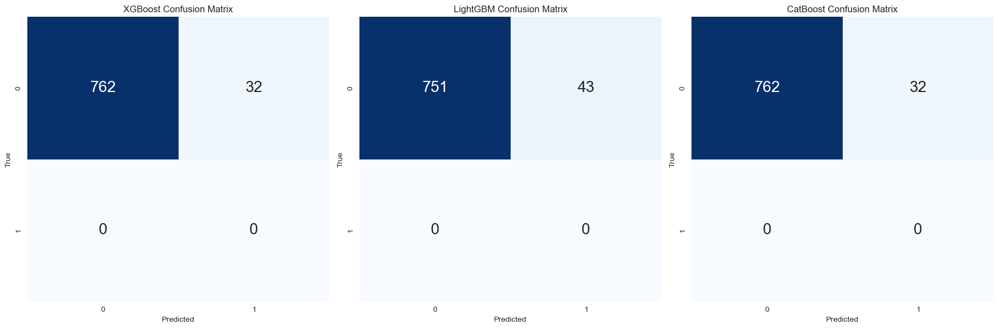

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,293490,-0.008116,0.023331,80.0,-0.366809,0.447286,1,1.0,1.0,3.0,0.0
1,20210610,005387,0.009852,0.021413,82.0,-0.903345,0.428939,1,1.0,1.0,3.0,0.0
2,20210610,247540,0.060588,0.036959,91.0,-0.638083,0.675104,1,1.0,1.0,3.0,0.0
3,20210610,096530,0.056932,0.026749,92.0,-0.259086,0.603550,1,1.0,1.0,3.0,0.0
4,20210610,036490,0.002191,0.017176,94.0,0.063030,0.470584,1,1.0,1.0,3.0,0.0
5,20210610,095700,0.049911,0.032511,131.0,0.411015,0.481411,1,1.0,1.0,3.0,0.0
6,20210610,357780,0.023036,0.024653,133.0,-0.598926,0.579316,1,1.0,1.0,3.0,0.0
7,20210610,078340,0.057435,0.039513,155.0,1.065571,0.789211,1,1.0,1.0,3.0,0.0
8,20210610,034230,-0.032700,0.024106,171.0,-0.604987,0.392296,1,1.0,1.0,3.0,0.0
9,20210610,036540,-0.072694,0.022153,198.0,-0.721948,0.348759,1,1.0,1.0,3.0,0.0


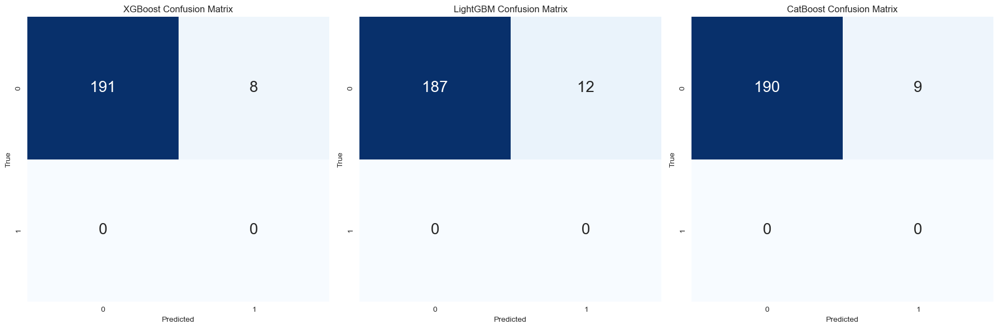

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,020000,-0.022622,0.016783,261.0,-0.938678,0.695743,1,1.0,1.0,3.0,0.0
1,20210610,052690,0.012579,0.015841,310.0,-1.672857,0.803817,1,1.0,1.0,3.0,0.0
2,20210610,049770,-0.054067,0.014335,322.0,1.043112,0.486281,1,1.0,1.0,3.0,0.0
3,20210610,007570,-0.002894,0.038209,352.0,-1.349708,0.540012,1,1.0,1.0,3.0,0.0
4,20210610,006390,0.039221,0.019990,355.0,0.446079,0.459287,1,1.0,1.0,3.0,0.0
5,20210610,005180,0.000000,0.007406,412.0,0.506671,0.366419,1,1.0,1.0,3.0,0.0
6,20210610,009410,0.004175,0.015492,473.0,0.423325,0.216963,1,1.0,1.0,3.0,0.0
7,20210610,008350,-0.045917,0.014454,488.0,0.316259,1.093898,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 10.78
편출 예측 종목 공매도수익률 = -30.37125
총수익률 = -19.591250000000002
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 20220307 20220308 2022

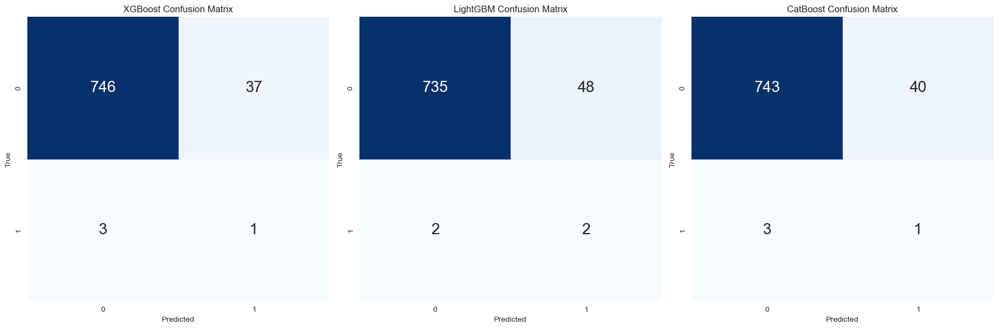

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,361610,0.007168,0.010605,26.0,-0.075281,0.473678,1,1.0,1.0,3.0,0.0
1,20211210,383220,0.047660,0.016431,64.0,0.023117,0.343277,1,1.0,1.0,3.0,0.0
2,20211210,293490,-0.091519,0.018789,69.0,0.112112,0.450246,1,1.0,1.0,3.0,0.0
3,20211210,066970,0.074910,0.041878,80.0,1.216244,0.685524,1,1.0,1.0,3.0,0.0
4,20211210,196170,-0.057363,0.021050,113.0,-0.250946,0.257285,1,1.0,1.0,3.0,0.0
5,20211210,096530,-0.049014,0.018125,114.0,-0.020182,0.370059,1,1.0,1.0,3.0,0.0
6,20211210,298020,-0.100553,0.022046,117.0,0.898095,0.581935,1,1.0,1.0,3.0,0.0
7,20211210,307950,-0.087392,0.023599,126.0,0.486981,0.627149,1,1.0,1.0,3.0,0.0
8,20211210,048260,0.000625,0.020051,156.0,0.012039,0.680850,1,1.0,1.0,3.0,0.0
9,20211210,108320,0.016751,0.027707,172.0,0.238049,0.527910,1,1.0,1.0,3.0,0.0


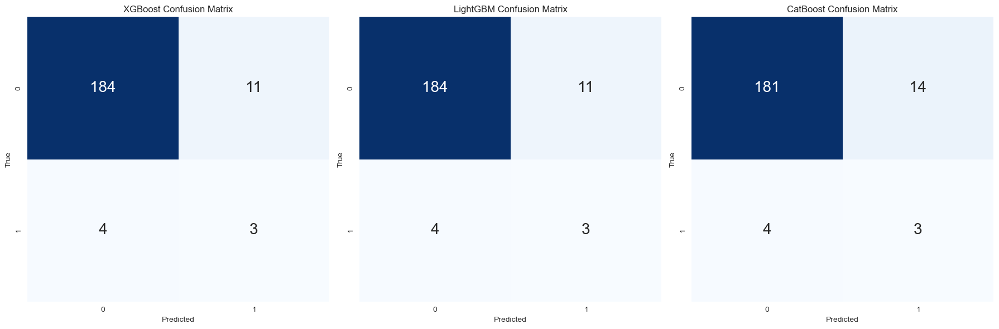

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,192080,-0.070499,0.012782,276.0,-1.233585,0.719689,1,1.0,1.0,3.0,0.0
1,20211210,057050,-0.027176,0.013833,327.0,0.501339,0.378985,1,1.0,1.0,3.0,0.0
2,20211210,042670,-0.081607,0.020759,331.0,-0.359530,0.403307,1,1.0,1.0,3.0,0.0
3,20211210,064960,-0.020166,0.018166,355.0,-0.823908,0.624928,1,1.0,1.0,3.0,0.0
4,20211210,383800,0.007025,0.016700,365.0,0.287744,0.508863,1,1.0,1.0,3.0,1.0
5,20211210,007570,-0.041763,0.021950,410.0,-0.598741,0.662479,1,1.0,1.0,3.0,1.0
6,20211210,115390,-0.021323,0.011437,424.0,1.048994,0.740990,1,1.0,1.0,3.0,0.0
7,20211210,003230,-0.035391,0.009771,431.0,0.379860,0.324935,1,1.0,1.0,3.0,1.0
8,20211210,006390,-0.015908,0.018729,441.0,-0.530263,0.897345,1,1.0,1.0,3.0,0.0
9,20211210,001060,-0.005581,0.020760,459.0,0.969536,1.603539,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 8.446000000000002
편출 예측 종목 공매도수익률 = 10.802307692307691
총수익률 = 19.24830769230769
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 202

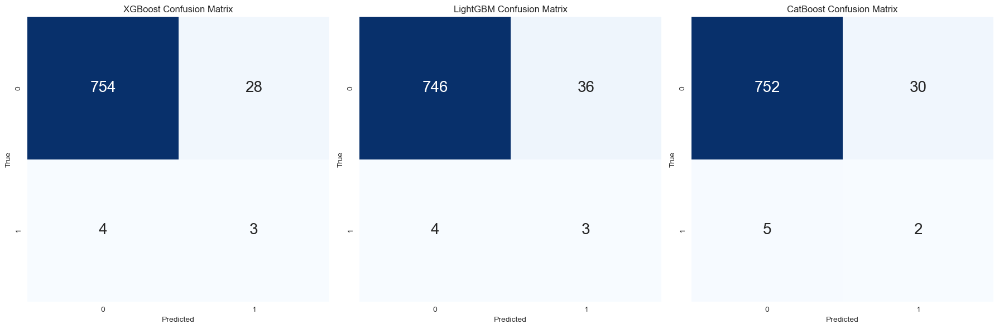

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,091990,0.034887,0.027716,37.0,0.325924,0.585833,1,1.0,1.0,3.0,0.0
1,20220610,247540,-0.196744,0.042619,51.0,0.676663,0.516629,1,1.0,1.0,3.0,0.0
2,20220610,263750,-0.036076,0.033569,59.0,0.063554,0.489481,1,1.0,1.0,3.0,0.0
3,20220610,137310,-0.016439,0.028189,63.0,-0.074387,0.480773,1,1.0,1.0,3.0,1.0
4,20220610,066970,-0.176456,0.047662,64.0,1.095184,0.456557,1,1.0,1.0,3.0,0.0
5,20220610,028300,-0.079777,0.030723,103.0,0.378276,0.436880,1,1.0,1.0,3.0,0.0
6,20220610,112040,-0.103725,0.035823,108.0,-0.023961,0.412679,1,1.0,1.0,3.0,0.0
7,20220610,058470,-0.003311,0.021243,121.0,0.547864,0.426643,1,1.0,1.0,3.0,0.0
8,20220610,041510,0.064539,0.025933,163.0,0.733166,0.424653,1,1.0,1.0,3.0,0.0
9,20220610,051915,-0.094210,0.023453,166.0,0.820398,0.554822,1,1.0,1.0,3.0,0.0


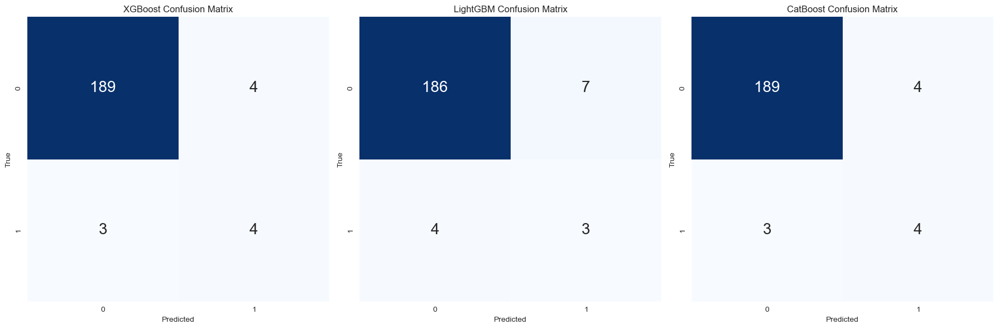

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,005440,0.000000,0.022909,317.0,-0.267224,0.290713,1,1.0,1.0,3.0,0.0
1,20220610,001680,-0.022523,0.013102,336.0,0.021312,0.349581,1,1.0,1.0,3.0,0.0
2,20220610,006120,-0.051487,0.014808,345.0,-0.088354,0.406651,1,1.0,1.0,3.0,1.0
3,20220610,000070,-0.056882,0.019029,366.0,0.092039,0.524124,1,1.0,1.0,3.0,0.0
4,20220610,064960,-0.074366,0.019312,403.0,-0.386067,0.543294,1,1.0,1.0,3.0,1.0
5,20220610,002350,-0.058081,0.021923,412.0,-0.231135,0.749680,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 3.295000000000001
편출 예측 종목 공매도수익률 = -3.1833333333333336
총수익률 = 0.11166666666666725
20100305 20100308 20100309 20100310 20100311 20100312 20100315 20110304 20110307 20110308 20110309 20110310 20110311 20110314 20120308 20120309 20120312 20120313 20120314 20120315 20120316 20130308 20130311 20130312 20130313 20130314 20130315 20130318 20140305 20140306 20140307 20140310 20140311 20140312 20140313 20150306 20150309 20150310 20150311 20150312 20150313 20150316 20160303 20160304 20160307 20160308 20160309 20160310 20160311 20170228 20170302 20170303 20170306 20170307 20170308 20170309 20180307 20180308 20180309 20180312 20180313 20180314 20180315 20190308 20190311 20190312 20190313 20190314 20190315 20190318 20200305 20200306 20200309 20200310 20200311 20200312 20200313 20200903 20200904 20200907 20200908 20200909 20200910 20200911 20210305 20210308 20210309 20210310 20210311 20210312 20210315 20210901 20210902 20210903 20210906 20210907 20210908 20210909 20220303 20220304 

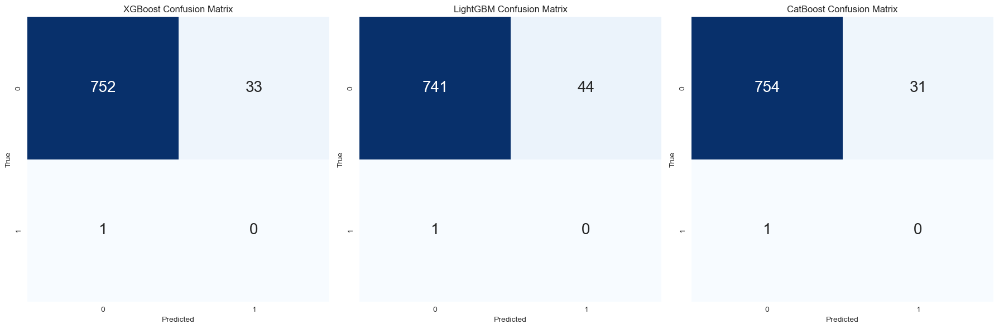

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,091990,0.025282,0.016110,33.0,-0.052632,0.431568,1,1.0,1.0,3.0,0.0
1,20221209,247540,0.016745,0.021171,36.0,0.076911,0.559083,1,1.0,1.0,3.0,0.0
2,20221209,028300,0.028002,0.053973,70.0,1.370050,0.980498,1,1.0,1.0,3.0,0.0
3,20221209,293490,0.033644,0.031227,81.0,-0.221165,0.507129,1,1.0,1.0,3.0,0.0
4,20221209,086520,0.112023,0.039395,94.0,0.412474,0.696451,1,1.0,1.0,3.0,0.0
5,20221209,307950,0.004211,0.015359,99.0,0.152187,0.611942,1,1.0,1.0,3.0,0.0
6,20221209,051915,0.031909,0.015292,129.0,0.704683,0.623156,1,1.0,1.0,3.0,0.0
7,20221209,237690,-0.010538,0.023393,168.0,0.263000,0.381868,1,1.0,1.0,3.0,0.0


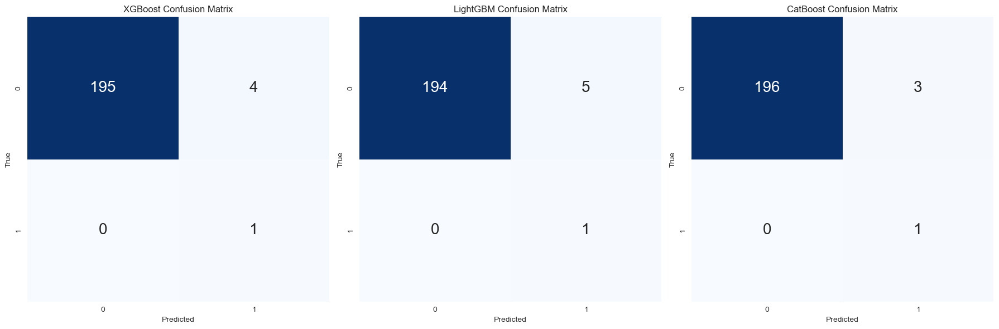

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,005440,-0.005312,0.016512,324.0,-0.058697,0.467665,1,1.0,1.0,3.0,0.0
1,20221209,105630,0.039093,0.016171,370.0,-0.848019,0.297532,1,1.0,1.0,3.0,0.0
2,20221209,000070,0.000000,0.016882,382.0,-0.683667,0.551402,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -1.5100000000000002
편출 예측 종목 공매도수익률 = 0.7333333333333331
총수익률 = -0.7766666666666672


In [56]:
returns60 = 0 
for date in inout_days[3:]:
    try: 
        ret_back = predict_and_test(date,n = 60)
        returns60 += ret_back
    except Exception as e:
        print(e)

In [59]:
print(f"60일전 예측한경우의 10년 return 평균= {returns60/(len(inout_days[3:])-1):.2f}%") 
# 예외처리 때문에 1빼줌

60일전 예측한경우의 10년 return 평균= 3.83%


### 30일

20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 20220420 20220421 20220422 20220425 20221019 20221020 20221021 20221024 20221025 20221026 2

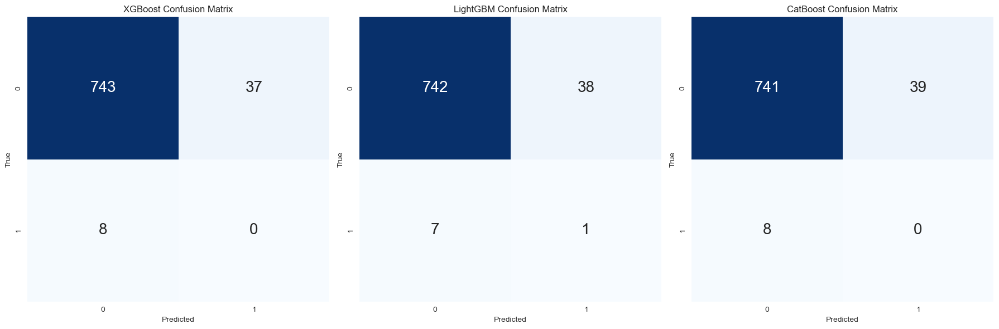

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,005935,0.001153,0.007972,9.0,0.151405,0.462275,1,1.0,1.0,3.0,0.0
1,20130614,008770,-0.022473,0.020753,94.0,0.106499,0.428956,1,1.0,1.0,3.0,0.0
2,20130614,114090,0.038128,0.027458,101.0,0.452454,0.362206,1,1.0,1.0,3.0,0.0
3,20130614,053210,0.101020,0.029654,105.0,0.328552,0.440113,1,1.0,1.0,3.0,0.0
4,20130614,046890,0.030511,0.033592,116.0,0.226845,0.642546,1,1.0,1.0,3.0,0.0
5,20130614,006040,0.188966,0.047453,142.0,0.734547,1.216688,1,1.0,1.0,3.0,0.0
6,20130614,037560,-0.025533,0.022154,148.0,-0.380888,0.744023,1,1.0,1.0,3.0,0.0
7,20130614,079160,0.058998,0.034474,149.0,1.289693,0.466770,1,1.0,1.0,3.0,0.0
8,20130614,112040,0.085554,0.036574,163.0,0.331156,0.675221,1,1.0,1.0,3.0,0.0
9,20130614,078520,-0.004874,0.023364,198.0,-0.261226,0.715234,1,1.0,1.0,3.0,0.0


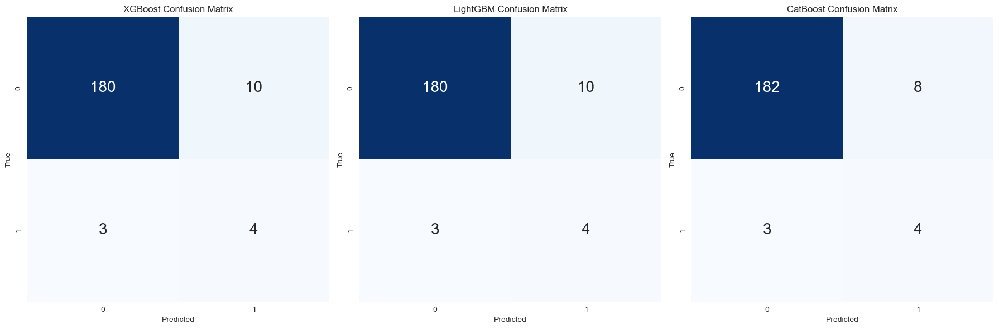

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20130614,005950,0.013106,0.020196,372.0,0.207159,0.366331,1,1.0,1.0,3.0,0.0
1,20130614,033530,0.020121,0.032267,427.0,1.321011,0.773650,1,1.0,1.0,3.0,0.0
2,20130614,008040,-0.005540,0.016760,441.0,-0.361870,0.315377,1,1.0,1.0,3.0,1.0
3,20130614,000700,0.030969,0.030557,476.0,0.279304,1.152645,1,1.0,1.0,3.0,0.0
4,20130614,003120,-0.006390,0.001492,489.0,1.927442,1.119654,1,1.0,1.0,3.0,0.0
5,20130614,011810,-0.019673,0.096213,501.0,0.893752,0.421069,1,1.0,1.0,3.0,0.0
6,20130614,003480,0.067118,0.018564,506.0,0.006226,0.915244,1,1.0,1.0,3.0,1.0
7,20130614,005690,0.023154,0.026000,528.0,-0.393474,0.832437,1,1.0,1.0,3.0,0.0
8,20130614,016380,-0.025064,0.023026,600.0,0.693470,0.400042,1,1.0,1.0,3.0,1.0
9,20130614,103590,0.062218,0.016230,642.0,-0.536646,0.617445,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -7.691249999999999
편출 예측 종목 공매도수익률 = 5.454166666666667
총수익률 = -2.2370833333333326
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 2

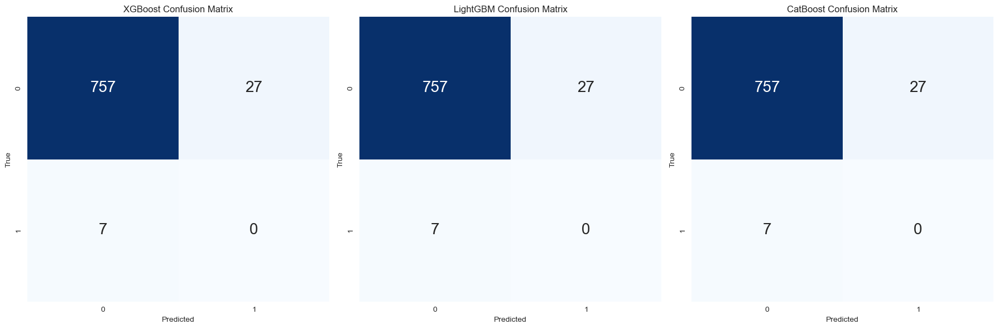

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,034230,0.041328,0.016750,66.0,0.572384,0.599900,1,1.0,1.0,3.0,0.0
1,20140613,114090,-0.039311,0.017200,85.0,1.147663,0.455892,1,1.0,1.0,3.0,0.0
2,20140613,064350,-0.014185,0.012038,93.0,0.553861,0.531834,1,1.0,1.0,3.0,0.0
3,20140613,130960,0.118880,0.044375,110.0,0.938505,0.791386,1,1.0,1.0,3.0,0.0
4,20140613,009970,0.000000,0.025772,162.0,-0.508024,0.513848,1,1.0,1.0,3.0,0.0
5,20140613,112040,0.025864,0.025659,191.0,-0.510690,0.504474,1,1.0,1.0,3.0,0.0


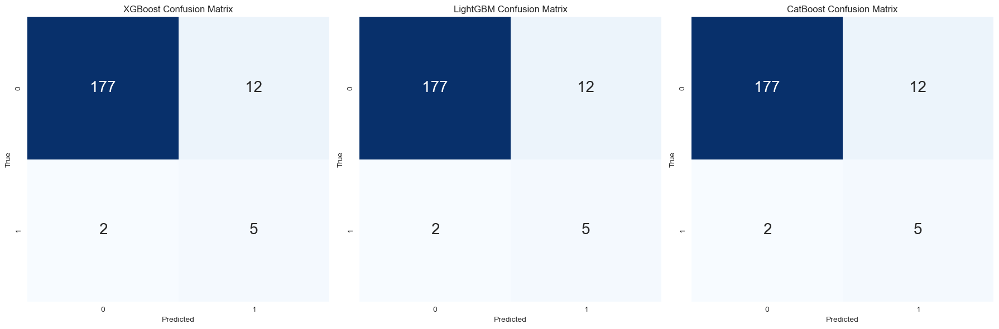

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20140613,025540,-0.008260,0.018274,291.0,1.246228,0.656827,1,1.0,1.0,3.0,0.0
1,20140613,064960,0.012670,0.014542,308.0,1.714540,0.645325,1,1.0,1.0,3.0,0.0
2,20140613,004130,0.000000,0.022093,329.0,0.207771,0.606131,1,1.0,1.0,3.0,0.0
3,20140613,000990,0.054725,0.030054,381.0,0.379565,1.904166,1,1.0,1.0,3.0,0.0
4,20140613,104700,-0.015944,0.010822,431.0,-0.826154,0.551010,1,1.0,1.0,3.0,0.0
5,20140613,002020,-0.009009,0.023022,435.0,-0.431256,0.721593,1,1.0,1.0,3.0,0.0
6,20140613,004430,-0.018958,0.021332,441.0,0.063176,0.541000,1,1.0,1.0,3.0,0.0
7,20140613,000700,-0.051378,0.018615,448.0,1.212986,0.370891,1,1.0,1.0,3.0,0.0
8,20140613,005090,0.027561,0.017454,457.0,-0.790967,0.745844,1,1.0,1.0,3.0,0.0
9,20140613,005950,0.014599,0.009664,507.0,0.122198,0.478314,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -1.8933333333333335
편출 예측 종목 공매도수익률 = 6.561249999999999
총수익률 = 4.667916666666666
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20

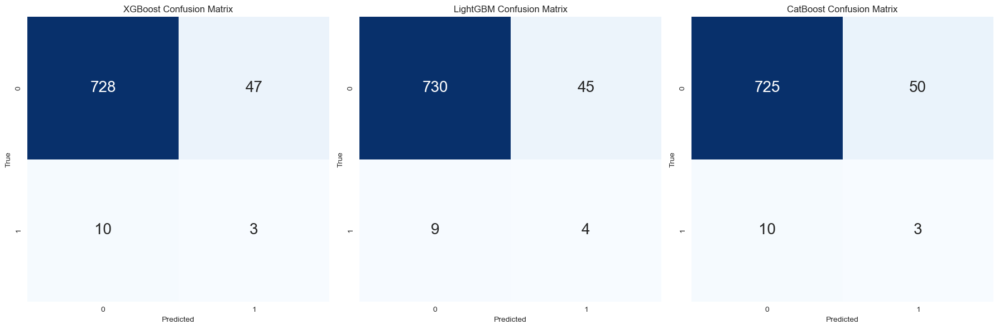

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,009240,0.015000,0.027867,60.0,0.410715,0.488648,1,1.0,1.0,3.0,1.0
1,20150612,005387,0.052966,0.032829,64.0,0.162927,0.351283,1,1.0,1.0,3.0,0.0
2,20150612,026960,0.013709,0.024949,83.0,-0.177364,0.265462,1,1.0,1.0,3.0,0.0
3,20150612,005385,0.074108,0.029780,86.0,0.470397,0.470122,1,1.0,1.0,3.0,0.0
4,20150612,088980,-0.017633,0.001525,98.0,0.399276,0.278216,1,1.0,1.0,3.0,0.0
5,20150612,006360,-0.015461,0.018538,106.0,0.100902,0.412303,1,1.0,1.0,3.0,0.0
6,20150612,114090,-0.020872,0.010712,107.0,-0.296581,0.307590,1,1.0,1.0,3.0,0.0
7,20150612,130960,-0.054067,0.020742,112.0,-0.037835,0.502112,1,1.0,1.0,3.0,0.0
8,20150612,020560,0.009627,0.029451,139.0,-0.461500,0.558536,1,1.0,1.0,3.0,0.0
9,20150612,039030,0.081330,0.070065,171.0,0.177387,0.654102,1,1.0,1.0,3.0,0.0


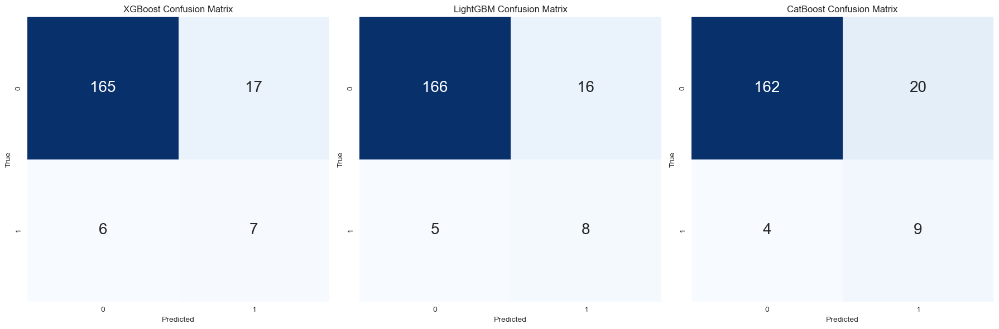

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20150612,003920,-0.023685,0.014094,306.0,-0.142525,0.557689,1,1.0,1.0,3.0,0.0
1,20150612,009680,0.054488,0.013146,367.0,1.060438,1.469105,1,1.0,1.0,3.0,0.0
2,20150612,004710,0.079822,0.034268,394.0,-0.596132,0.556158,1,1.0,1.0,3.0,0.0
3,20150612,079980,-0.014252,0.011594,420.0,-0.251760,0.688411,1,1.0,1.0,3.0,0.0
4,20150612,007690,0.125600,0.039262,423.0,1.588623,0.955329,1,1.0,1.0,3.0,0.0
5,20150612,000990,0.244197,0.075470,433.0,1.633521,1.296381,1,1.0,1.0,3.0,1.0
6,20150612,093370,-0.027334,0.015664,438.0,-1.082853,0.397857,1,1.0,1.0,3.0,0.0
7,20150612,020150,0.014798,0.016212,447.0,-0.745536,0.358309,1,1.0,1.0,3.0,0.0
8,20150612,104700,-0.016737,0.022577,457.0,-0.036464,0.349379,1,1.0,1.0,3.0,0.0
9,20150612,000140,0.010545,0.011145,458.0,-1.313274,0.384182,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -7.263333333333334
편출 예측 종목 공매도수익률 = 0.742173913043478
총수익률 = -6.521159420289855
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20

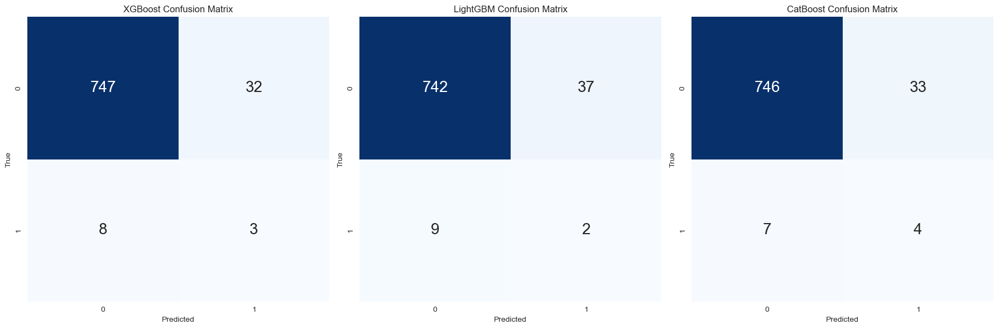

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,035720,0.030173,0.023304,43.0,0.795727,0.283177,1,1.0,1.0,3.0,0.0
1,20160610,027410,-0.013038,0.012906,58.0,-0.373097,0.292662,1,1.0,1.0,3.0,1.0
2,20160610,005387,0.004773,0.013147,66.0,1.319208,0.401795,1,1.0,1.0,3.0,0.0
3,20160610,026960,0.012048,0.015285,74.0,0.090152,0.503800,1,1.0,1.0,3.0,0.0
4,20160610,005385,0.009804,0.016086,93.0,-0.055460,0.392764,1,1.0,1.0,3.0,0.0
5,20160610,086900,-0.037335,0.017309,99.0,-0.138307,0.638915,1,1.0,1.0,3.0,0.0
6,20160610,090435,0.040184,0.020883,100.0,0.081078,0.812016,1,1.0,1.0,3.0,0.0
7,20160610,041960,0.027710,0.044920,106.0,-0.129714,0.996998,1,1.0,1.0,3.0,0.0
8,20160610,056190,-0.010889,0.020105,198.0,-1.284146,0.467060,1,1.0,1.0,3.0,0.0


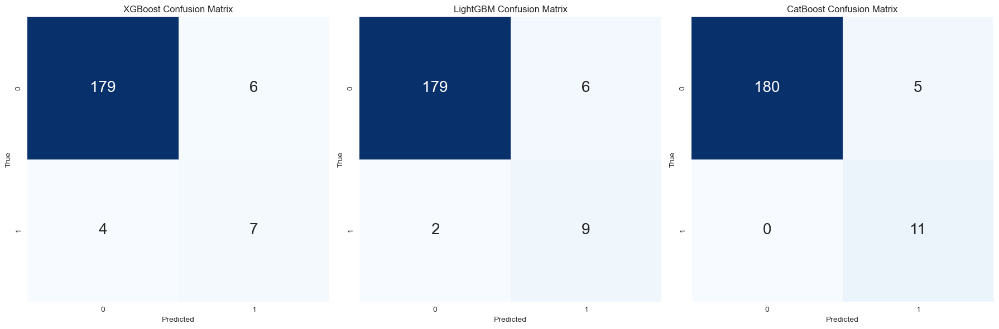

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20160610,042700,0.025001,0.037518,367.0,-0.512017,0.394351,1,1.0,1.0,3.0,1.0
1,20160610,104700,0.031035,0.022594,368.0,-0.384190,0.334453,1,1.0,1.0,3.0,0.0
2,20160610,097230,-0.003661,0.030199,377.0,0.438422,0.720842,1,1.0,1.0,3.0,0.0
3,20160610,005090,0.027747,0.020181,380.0,-0.265067,0.635072,1,1.0,1.0,3.0,0.0
4,20160610,004150,0.023186,0.015038,411.0,0.538712,0.417854,1,1.0,1.0,3.0,1.0
5,20160610,000480,-0.015168,0.007518,416.5,-0.767077,0.998966,1,1.0,1.0,3.0,1.0
6,20160610,000140,0.022765,0.019490,428.0,-0.629433,0.465837,1,1.0,1.0,3.0,0.0
7,20160610,082740,-0.043435,0.034889,495.0,-0.634122,0.989660,1,1.0,1.0,3.0,1.0
8,20160610,007860,-0.015385,0.014995,504.0,-0.035712,0.285083,1,1.0,1.0,3.0,1.0
9,20160610,009580,-0.028140,0.013064,510.0,-0.443758,0.666704,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 4.395
편출 예측 종목 공매도수익률 = 4.8175
총수익률 = 9.212499999999999
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 20220420 20220421 

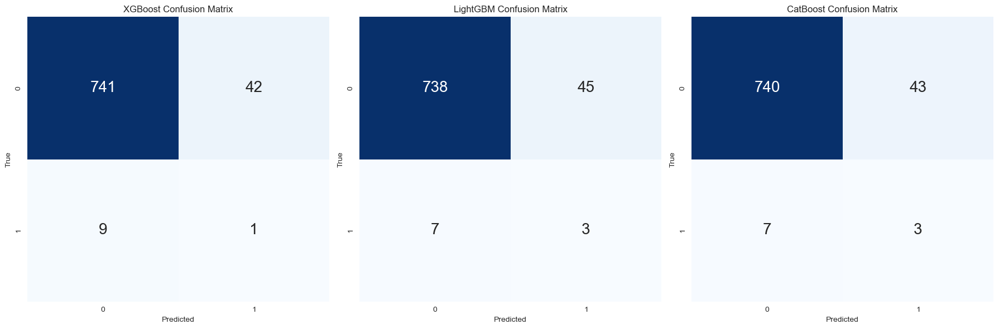

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,035720,0.055475,0.020166,47.0,1.209447,0.626055,1,1.0,1.0,3.0,0.0
1,20170609,241560,-0.009415,0.020446,69.0,0.744938,0.676623,1,1.0,1.0,3.0,0.0
2,20170609,005387,-0.023014,0.019748,72.0,0.577420,0.530695,1,1.0,1.0,3.0,0.0
3,20170609,001450,0.039665,0.019918,78.0,-0.175849,0.566522,1,1.0,1.0,3.0,0.0
4,20170609,026960,0.004996,0.017244,82.0,-0.505758,0.496447,1,1.0,1.0,3.0,1.0
5,20170609,005385,-0.031923,0.014596,103.0,0.270535,1.032499,1,1.0,1.0,3.0,0.0
6,20170609,002550,0.172234,0.061779,105.0,2.937754,1.814636,1,1.0,1.0,3.0,0.0
7,20170609,078340,-0.048163,0.033252,140.0,0.035767,1.023152,1,1.0,1.0,3.0,0.0
8,20170609,051915,-0.010840,0.024123,153.0,0.171825,1.016007,1,1.0,1.0,3.0,0.0
9,20170609,051905,0.051192,0.022290,171.0,-1.005900,1.013690,1,1.0,1.0,3.0,0.0


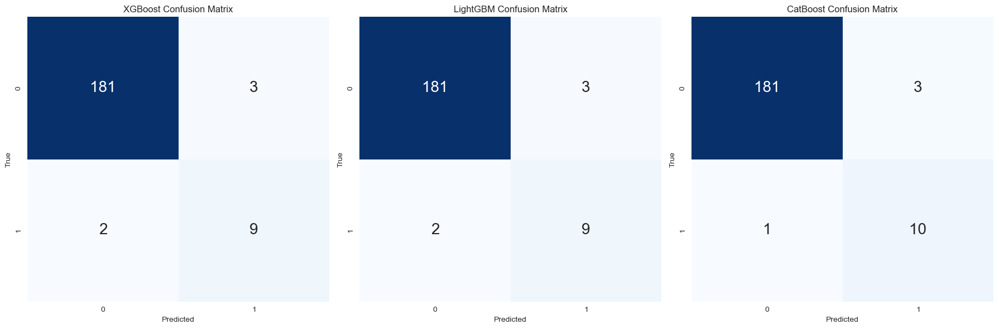

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20170609,003920,-0.015055,0.019845,261.0,0.467325,0.658214,1,1.0,1.0,3.0,0.0
1,20170609,097230,-0.033752,0.018793,405.0,0.090684,0.578284,1,1.0,1.0,3.0,0.0
2,20170609,104700,-0.027363,0.008539,411.0,-0.348414,0.444270,1,1.0,1.0,3.0,1.0
3,20170609,005090,0.047253,0.028923,499.0,0.010481,0.412274,1,1.0,1.0,3.0,1.0
4,20170609,007690,-0.003107,0.008843,500.0,-0.053089,0.915802,1,1.0,1.0,3.0,1.0
5,20170609,003200,0.017544,0.020052,509.0,0.320210,0.423812,1,1.0,1.0,3.0,1.0
6,20170609,007210,0.063960,0.023285,520.0,0.521151,0.712053,1,1.0,1.0,3.0,1.0
7,20170609,000140,0.027399,0.015019,536.0,0.225094,0.281678,1,1.0,1.0,3.0,1.0
8,20170609,004700,-0.005256,0.011625,554.0,0.681944,0.448423,1,1.0,1.0,3.0,1.0
9,20170609,000230,0.388396,0.159941,652.0,-0.485026,0.368077,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 8.74125
편출 예측 종목 공매도수익률 = -4.651999999999999
총수익률 = 4.089250000000002
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 2022

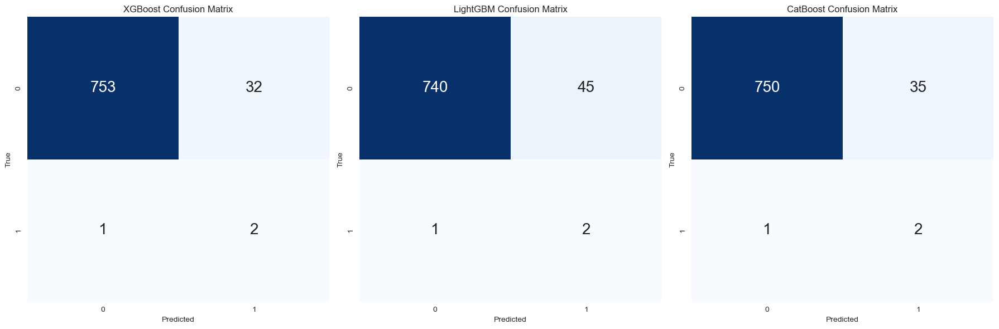

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,005387,0.051534,0.019154,74.0,0.103957,0.637522,1,1.0,1.0,3.0,0.0
1,20180615,130960,-0.040388,0.009387,80.0,-0.247667,0.345212,1,1.0,1.0,3.0,0.0
2,20180615,241560,0.011120,0.015099,91.0,-0.415134,0.677029,1,1.0,1.0,3.0,1.0
3,20180615,042660,-0.055517,0.026673,107.0,0.150246,0.548873,1,1.0,1.0,3.0,1.0
4,20180615,039490,0.043110,0.018577,108.0,0.021963,0.339684,1,1.0,1.0,3.0,0.0
5,20180615,005385,0.079874,0.022256,113.0,0.155159,0.505620,1,1.0,1.0,3.0,0.0
6,20180615,095700,0.078542,0.047084,121.0,-0.069752,0.481231,1,1.0,1.0,3.0,0.0
7,20180615,267270,-0.022664,0.032731,150.0,-0.635454,0.957121,1,1.0,1.0,3.0,0.0
8,20180615,180640,0.066971,0.038261,167.0,0.102146,0.625740,1,1.0,1.0,3.0,0.0
9,20180615,006490,0.052505,0.068287,194.0,-2.179806,0.443222,1,1.0,1.0,3.0,0.0


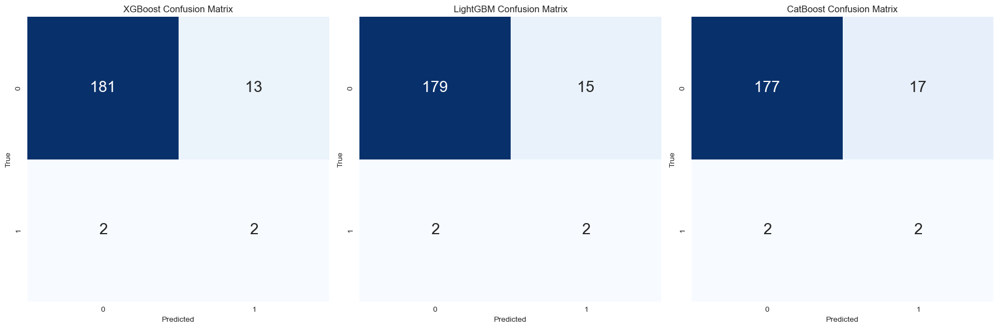

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20180615,204320,-0.060489,0.033272,132.0,0.641519,0.664657,1,1.0,1.0,3.0,0.0
1,20180615,060980,0.034983,0.016231,360.0,0.328596,0.651649,1,1.0,1.0,3.0,0.0
2,20180615,003030,0.115750,0.038863,371.0,-0.346022,0.746542,1,1.0,1.0,3.0,0.0
3,20180615,001520,0.042453,0.015577,385.0,-1.106092,1.067596,1,1.0,1.0,3.0,0.0
4,20180615,033920,-0.002937,0.012823,390.0,-0.049451,0.374964,1,1.0,1.0,3.0,0.0
5,20180615,034120,0.013475,0.014210,391.0,0.212717,1.490941,1,1.0,1.0,3.0,0.0
6,20180615,006120,0.037286,0.027331,404.0,0.789049,0.658886,1,1.0,1.0,3.0,0.0
7,20180615,078520,-0.019859,0.033737,438.0,0.429657,0.699379,1,1.0,1.0,3.0,1.0
8,20180615,008060,0.015579,0.017295,459.0,-0.012064,0.430508,1,1.0,1.0,3.0,0.0
9,20180615,000050,0.041243,0.018988,461.0,0.572126,0.703761,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -3.3200000000000003
편출 예측 종목 공매도수익률 = 0.3942857142857141
총수익률 = -2.925714285714286
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 

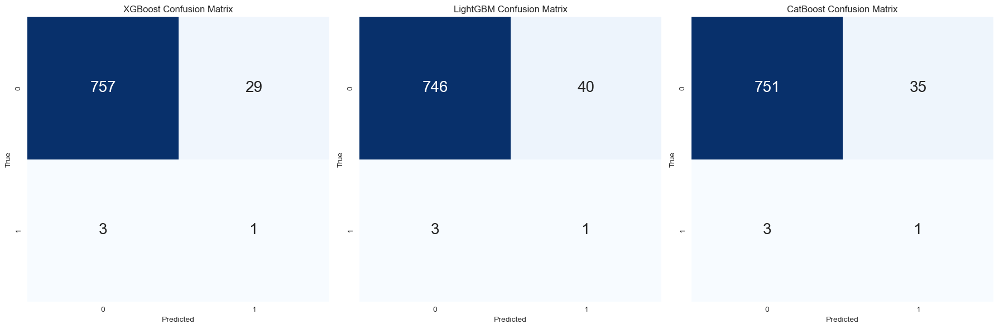

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,316140,0.003578,0.011223,34.0,0.060300,0.495095,1,1.0,1.0,3.0,0.0
1,20190614,081660,0.058541,0.014259,55.0,-0.255520,0.360803,1,1.0,1.0,3.0,1.0
2,20190614,215600,0.017282,0.015955,64.0,-0.466933,0.545894,1,1.0,1.0,3.0,0.0
3,20190614,084990,-0.011926,0.011439,68.0,0.129632,0.171195,1,1.0,1.0,3.0,0.0
4,20190614,028300,0.012019,0.020992,86.0,0.211176,0.388945,1,1.0,1.0,3.0,0.0
5,20190614,086900,-0.054329,0.029211,87.0,-0.299184,0.947064,1,1.0,1.0,3.0,0.0
6,20190614,005385,0.062480,0.013975,121.0,0.426966,0.465861,1,1.0,1.0,3.0,0.0
7,20190614,240810,-0.005450,0.030800,163.0,-0.614001,0.558684,1,1.0,1.0,3.0,0.0
8,20190614,011200,0.063617,0.051914,171.0,-0.240241,1.247357,1,1.0,1.0,3.0,0.0
9,20190614,003380,0.047068,0.022780,173.0,-0.394180,0.643515,1,1.0,1.0,3.0,0.0


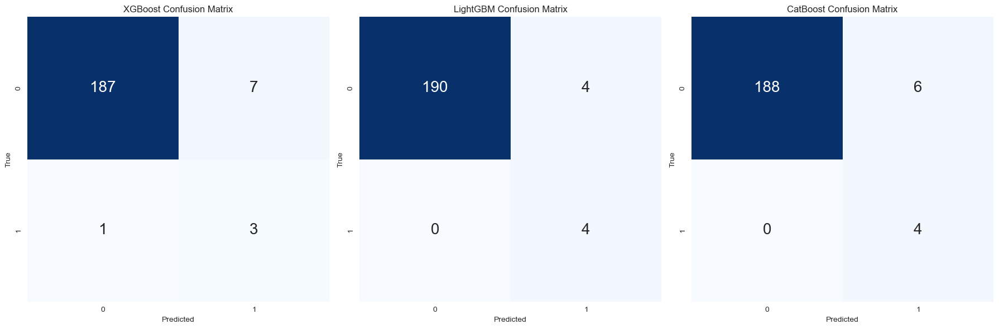

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20190614,001520,0.022586,0.006523,377.0,0.455610,0.506874,1,1.0,1.0,3.0,0.0
1,20190614,079430,-0.030772,0.019553,403.0,-0.183067,0.625930,1,1.0,1.0,3.0,0.0
2,20190614,033920,0.007246,0.024828,437.0,1.563477,0.795006,1,1.0,1.0,3.0,1.0
3,20190614,003300,-0.054251,0.021666,493.0,-0.066847,0.520245,1,1.0,1.0,3.0,1.0
4,20190614,036580,-0.027250,0.017030,517.0,-1.700375,0.663164,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = -5.43
편출 예측 종목 공매도수익률 = 16.223999999999997
총수익률 = 10.793999999999997
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 20220

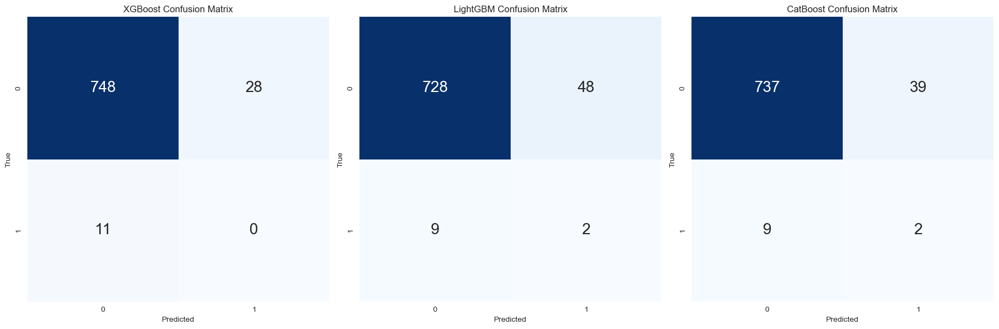

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20200612,012510,-0.020090,0.019760,78.0,-0.399857,0.527830,1,1.0,1.0,3.0,0.0
1,20200612,036490,0.004415,0.019521,118.0,-0.123586,0.318827,1,1.0,1.0,3.0,0.0
2,20200612,095700,0.172868,0.052868,120.0,1.823282,0.828678,1,1.0,1.0,3.0,0.0
3,20200612,078340,0.028710,0.019490,140.0,-0.486432,0.456241,1,1.0,1.0,3.0,0.0
4,20200612,196170,0.030643,0.029278,146.0,-0.267027,0.905783,1,1.0,1.0,3.0,0.0
5,20200612,013890,0.156144,0.037484,152.0,-0.038286,0.517051,1,1.0,1.0,3.0,0.0
6,20200612,098460,-0.006028,0.021067,162.0,-0.366258,0.427660,1,1.0,1.0,3.0,0.0
7,20200612,030190,0.056145,0.025673,166.0,-0.814152,0.726614,1,1.0,1.0,3.0,0.0
8,20200612,178920,0.098180,0.044015,177.0,-0.160070,0.589961,1,1.0,1.0,3.0,0.0
9,20200612,330590,0.009588,0.019218,185.0,-0.864923,0.652118,1,1.0,1.0,3.0,0.0


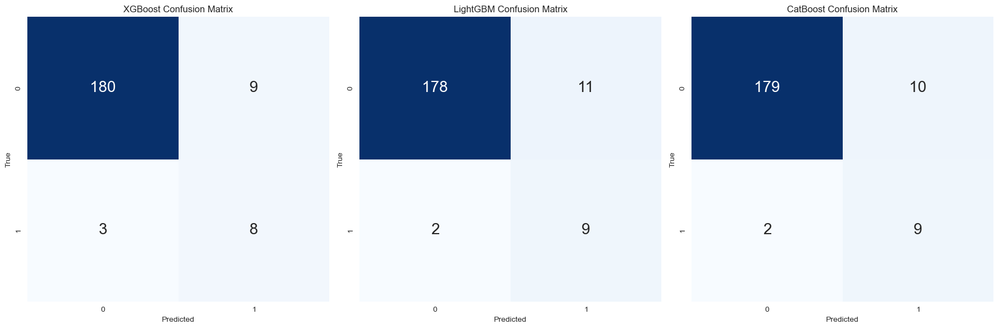

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20200612,000070,-0.017840,0.031784,358.0,-0.051971,0.318224,1,1.0,1.0,3.0,0.0
1,20200612,019680,-0.003098,0.017102,370.0,-0.669847,0.419899,1,1.0,1.0,3.0,0.0
2,20200612,004490,0.022828,0.027868,375.0,-0.125210,0.368001,1,1.0,1.0,3.0,0.0
3,20200612,025860,-0.021782,0.026778,387.0,-0.905331,0.629841,1,1.0,1.0,3.0,0.0
4,20200612,093050,0.011742,0.041091,392.0,-0.201285,0.447830,1,1.0,1.0,3.0,0.0
5,20200612,014830,0.005038,0.021320,403.0,-0.465744,0.379029,1,1.0,1.0,3.0,0.0
6,20200612,006840,0.127085,0.028102,432.0,0.134996,0.320619,1,1.0,1.0,3.0,1.0
7,20200612,002960,0.009662,0.013911,436.0,-0.327917,0.274577,1,1.0,1.0,3.0,1.0
8,20200612,096760,-0.004000,0.012035,444.0,-0.065064,0.375745,1,1.0,1.0,3.0,1.0
9,20200612,001430,-0.005552,0.037212,451.0,-0.079387,0.597685,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 8.840000000000002
편출 예측 종목 공매도수익률 = -15.343529411764708
총수익률 = -6.503529411764706
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 2

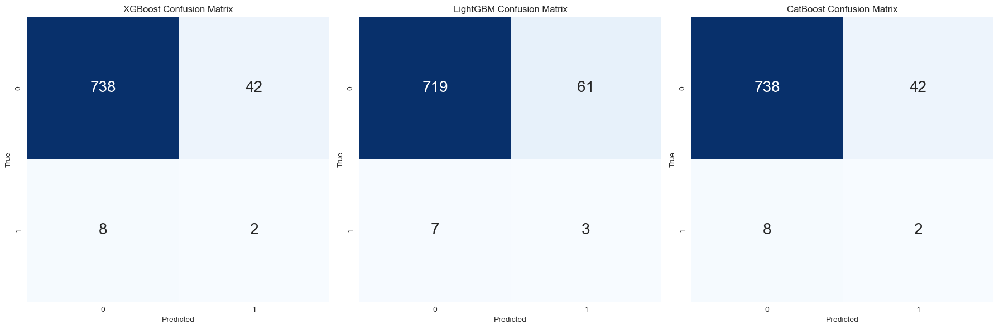

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,096530,-0.036314,0.043285,38.0,0.429539,0.488530,1,1.0,1.0,3.0,0.0
1,20201211,019170,-0.041437,0.036472,39.0,-1.366007,0.766557,1,1.0,1.0,3.0,1.0
2,20201211,028300,-0.037041,0.027007,51.0,-1.119328,0.488505,1,1.0,1.0,3.0,0.0
3,20201211,196170,0.022893,0.062636,56.0,0.336916,0.367466,1,1.0,1.0,3.0,0.0
4,20201211,005387,-0.002427,0.015815,87.0,-0.112540,0.484155,1,1.0,1.0,3.0,0.0
5,20201211,036490,-0.008938,0.038468,108.0,0.106998,0.373142,1,1.0,1.0,3.0,0.0
6,20201211,253450,-0.023530,0.018165,117.0,-0.485152,0.201084,1,1.0,1.0,3.0,0.0
7,20201211,000060,-0.006873,0.030564,142.0,-0.096542,0.618910,1,1.0,1.0,3.0,0.0
8,20201211,005290,0.012335,0.046502,158.0,0.614048,0.365350,1,1.0,1.0,3.0,0.0
9,20201211,003090,-0.041631,0.051701,161.0,0.249118,0.419557,1,1.0,1.0,3.0,1.0


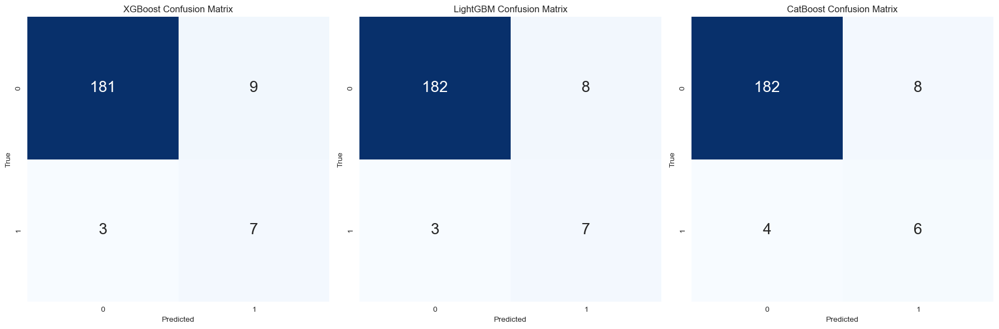

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20201211,020000,-0.056570,0.023443,277.0,0.607602,0.670375,1,1.0,1.0,3.0,0.0
1,20201211,108670,-0.031183,0.032914,317.0,0.395877,0.549459,1,1.0,1.0,3.0,0.0
2,20201211,006390,-0.064150,0.013822,449.0,0.921100,0.696019,1,1.0,1.0,3.0,0.0
3,20201211,025860,-0.016099,0.011988,465.0,0.528215,0.307762,1,1.0,1.0,3.0,1.0
4,20201211,014830,-0.025714,0.008935,472.0,0.200326,0.738634,1,1.0,1.0,3.0,1.0
5,20201211,004490,-0.019732,0.011930,475.0,0.363631,0.407459,1,1.0,1.0,3.0,0.0
6,20201211,027410,-0.026540,0.019139,476.0,1.307624,1.225238,1,1.0,1.0,3.0,1.0
7,20201211,001430,-0.081446,0.023871,526.0,1.342653,0.822831,1,1.0,1.0,3.0,1.0
8,20201211,060980,0.010811,0.012751,536.0,0.020449,0.686875,1,1.0,1.0,3.0,1.0
9,20201211,019680,0.003810,0.013975,558.0,1.537471,1.774275,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 20.8675
편출 예측 종목 공매도수익률 = -10.008000000000001
총수익률 = 10.859499999999999
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 20

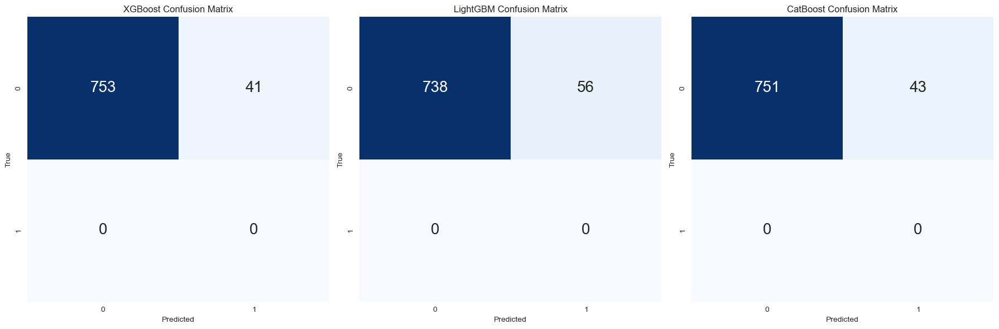

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,302440,0.147636,0.039236,33.0,0.634933,0.927626,1,1.0,1.0,3.0,0.0
1,20210610,036490,-0.005056,0.018493,89.0,-1.261637,0.354204,1,1.0,1.0,3.0,0.0
2,20210610,051915,-0.001234,0.018927,107.0,-0.190220,0.519295,1,1.0,1.0,3.0,0.0
3,20210610,298020,0.056920,0.017972,115.0,-1.657652,0.487054,1,1.0,1.0,3.0,0.0
4,20210610,066970,-0.013245,0.033306,135.0,1.078147,0.652615,1,1.0,1.0,3.0,0.0
5,20210610,005385,-0.031893,0.014918,138.0,-0.025960,0.386071,1,1.0,1.0,3.0,0.0
6,20210610,005290,0.022849,0.021620,180.0,0.110324,0.795602,1,1.0,1.0,3.0,0.0
7,20210610,108320,0.008048,0.013946,186.0,-0.577580,0.353629,1,1.0,1.0,3.0,0.0
8,20210610,025900,0.132317,0.039286,189.0,0.547091,0.293000,1,1.0,1.0,3.0,0.0


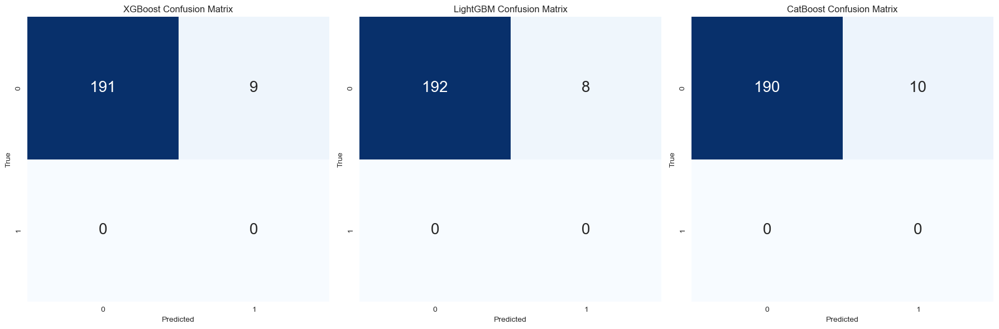

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20210610,241590,-0.066877,0.023868,264.0,0.252043,0.637683,1,1.0,1.0,3.0,0.0
1,20210610,001060,-0.003317,0.009102,408.0,0.038461,0.807641,1,1.0,1.0,3.0,0.0
2,20210610,005180,0.029574,0.009707,411.0,0.292500,0.444438,1,1.0,1.0,3.0,0.0
3,20210610,145990,0.051635,0.012414,413.0,-0.439033,0.298727,1,1.0,1.0,3.0,0.0
4,20210610,009410,0.023623,0.013811,491.0,0.087814,0.551778,1,1.0,1.0,3.0,0.0
5,20210610,008350,-0.015267,0.016502,548.0,-0.961965,0.509536,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -1.355
편출 예측 종목 공매도수익률 = -0.18500000000000005
총수익률 = -1.54
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 20220420 202204

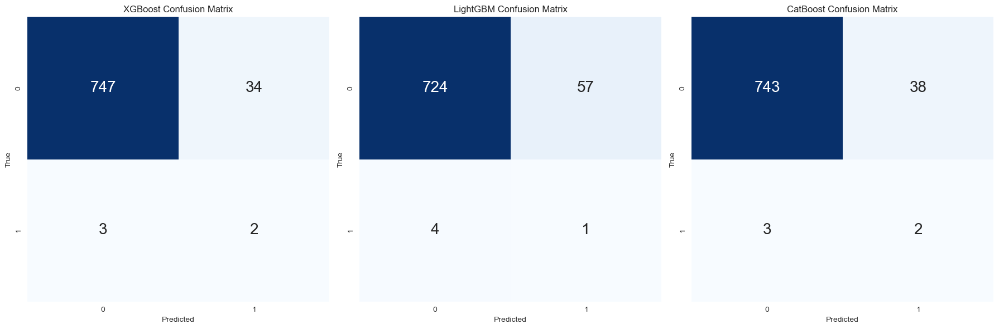

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,091990,-0.009122,0.019729,32.0,-0.531279,0.547279,1,1.0,1.0,3.0,0.0
1,20211210,329180,0.108341,0.025112,44.0,0.749194,0.620870,1,1.0,1.0,3.0,1.0
2,20211210,247540,-0.112531,0.037442,47.0,-0.011790,0.749025,1,1.0,1.0,3.0,0.0
3,20211210,383220,0.026699,0.019511,58.0,0.119806,0.349799,1,1.0,1.0,3.0,0.0
4,20211210,088980,0.037740,0.012609,69.0,0.588743,0.388042,1,1.0,1.0,3.0,0.0
5,20211210,068760,-0.015670,0.021315,86.0,-0.717246,0.391505,1,1.0,1.0,3.0,0.0
6,20211210,036490,-0.035467,0.015569,90.0,-0.207975,0.328001,1,1.0,1.0,3.0,0.0
7,20211210,035760,-0.041615,0.016666,95.0,-0.430932,0.477390,1,1.0,1.0,3.0,0.0
8,20211210,298050,-0.044084,0.027299,114.0,-0.520587,0.362605,1,1.0,1.0,3.0,0.0
9,20211210,096530,0.022771,0.032781,131.0,0.230422,0.735686,1,1.0,1.0,3.0,0.0


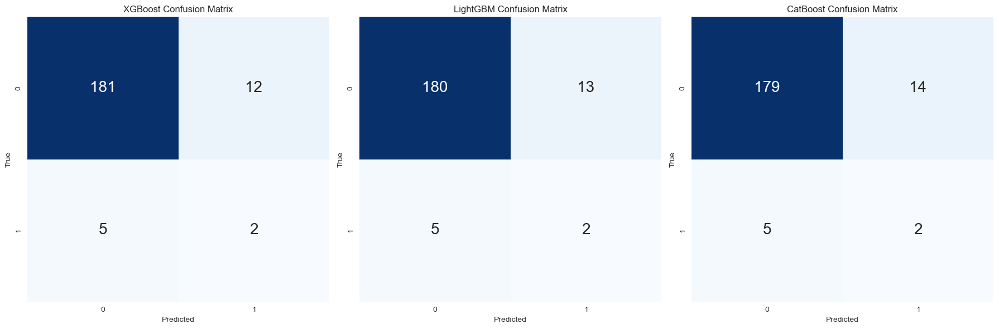

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20211210,069260,-0.013270,0.019945,266.0,0.975757,0.508428,1,1.0,1.0,3.0,0.0
1,20211210,005440,-0.003069,0.014753,309.0,0.574269,0.631085,1,1.0,1.0,3.0,0.0
2,20211210,192400,0.013363,0.022004,349.0,-0.066624,0.518450,1,1.0,1.0,3.0,0.0
3,20211210,002350,0.025117,0.009953,370.0,-1.474241,0.534842,1,1.0,1.0,3.0,0.0
4,20211210,012630,0.004684,0.015646,406.0,0.556301,0.438953,1,1.0,1.0,3.0,0.0
5,20211210,003230,0.007326,0.018842,417.0,-0.273836,0.712825,1,1.0,1.0,3.0,1.0
6,20211210,006390,0.067903,0.019005,422.0,1.848055,1.213639,1,1.0,1.0,3.0,0.0
7,20211210,018250,-0.008929,0.014027,432.0,0.012104,0.598110,1,1.0,1.0,3.0,0.0
8,20211210,007570,-0.034011,0.012053,442.0,0.342591,0.241340,1,1.0,1.0,3.0,1.0
9,20211210,115390,-0.023203,0.009881,450.0,-0.266759,0.293376,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = -1.845
편출 예측 종목 공매도수익률 = 8.067692307692308
총수익률 = 6.222692307692308
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 202204

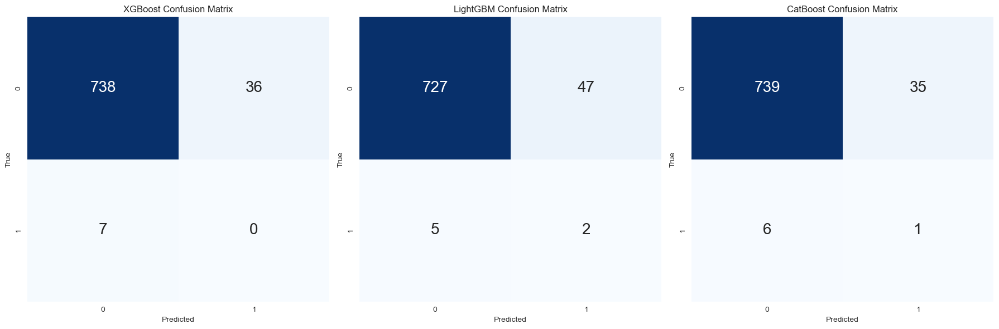

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,091990,-0.019508,0.022268,45.0,0.378603,0.467003,1,1.0,1.0,3.0,0.0
1,20220610,066970,-0.043911,0.045581,53.0,1.013334,0.517015,1,1.0,1.0,3.0,0.0
2,20220610,307950,-0.007605,0.018314,97.0,-0.107884,0.383747,1,1.0,1.0,3.0,0.0
3,20220610,068760,-0.023239,0.027062,107.0,0.310425,0.571807,1,1.0,1.0,3.0,0.0
4,20220610,058470,0.009014,0.020076,119.0,0.128791,0.440555,1,1.0,1.0,3.0,0.0
5,20220610,196170,-0.001864,0.017518,140.0,0.049186,0.504193,1,1.0,1.0,3.0,0.0
6,20220610,005290,0.010610,0.033965,161.0,0.767815,0.565923,1,1.0,1.0,3.0,0.0
7,20220610,357780,0.016157,0.025028,165.0,-0.080224,0.940678,1,1.0,1.0,3.0,0.0
8,20220610,222800,-0.009515,0.020132,184.0,-0.958602,0.377217,1,1.0,1.0,3.0,0.0
9,20220610,064760,0.105610,0.038757,185.0,0.341016,0.858298,1,1.0,1.0,3.0,0.0


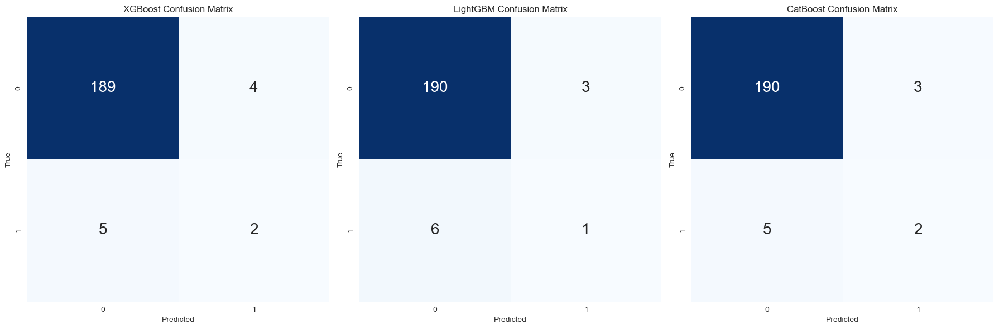

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20220610,031430,-0.045713,0.030182,247.0,-0.583176,0.488608,1,1.0,1.0,3.0,0.0
1,20220610,006650,-0.022545,0.020770,277.0,0.530354,0.556515,1,1.0,1.0,3.0,0.0
2,20220610,064960,0.055367,0.031800,363.0,1.076439,0.811410,1,1.0,1.0,3.0,1.0


편입 예측 종목 매수수익률 = 1.15
편출 예측 종목 공매도수익률 = -2.936666666666667
총수익률 = -1.786666666666667
20100416 20100419 20100420 20100421 20100422 20100423 20100426 20110415 20110418 20110419 20110420 20110421 20110422 20110425 20120420 20120423 20120424 20120425 20120426 20120427 20120430 20130419 20130422 20130423 20130424 20130425 20130426 20130429 20140416 20140417 20140418 20140421 20140422 20140423 20140424 20150417 20150420 20150421 20150422 20150423 20150424 20150427 20160415 20160418 20160419 20160420 20160421 20160422 20160425 20170412 20170413 20170414 20170417 20170418 20170419 20170420 20180418 20180419 20180420 20180423 20180424 20180425 20180426 20190419 20190422 20190423 20190424 20190425 20190426 20190429 20200417 20200420 20200421 20200422 20200423 20200424 20200427 20201021 20201022 20201023 20201026 20201027 20201028 20201029 20210416 20210419 20210420 20210421 20210422 20210423 20210426 20211020 20211021 20211022 20211025 20211026 20211027 20211028 20220415 20220418 20220419 202204

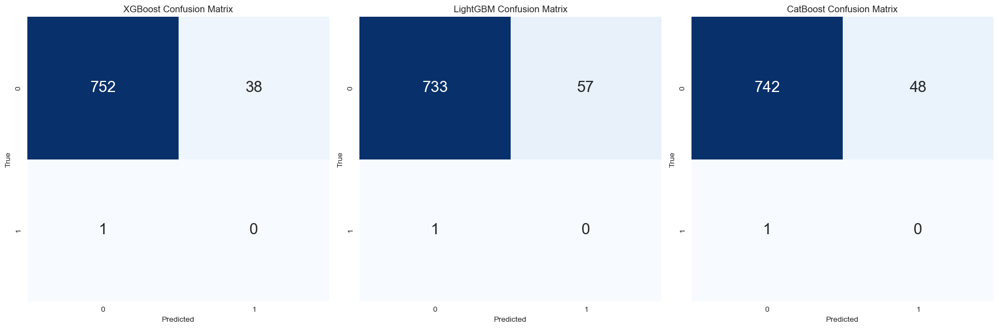

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,091990,0.055362,0.022454,30.0,-0.251889,0.424605,1,1.0,1.0,3.0,0.0
1,20221209,066970,-0.012048,0.038154,44.0,-0.910897,0.285586,1,1.0,1.0,3.0,0.0
2,20221209,088980,-0.041196,0.022028,66.0,-0.626292,0.600766,1,1.0,1.0,3.0,0.0
3,20221209,086520,-0.041773,0.018032,86.0,-0.635698,0.648465,1,1.0,1.0,3.0,0.0
4,20221209,293490,0.013004,0.017365,92.0,-0.533992,0.367130,1,1.0,1.0,3.0,0.0
5,20221209,263750,0.003621,0.022128,108.0,-0.483383,0.416546,1,1.0,1.0,3.0,0.0
6,20221209,068760,0.049014,0.015585,113.0,-0.147208,0.418641,1,1.0,1.0,3.0,0.0
7,20221209,035900,0.005430,0.033754,143.0,-0.338286,0.558095,1,1.0,1.0,3.0,0.0
8,20221209,357780,-0.023867,0.023532,164.0,-0.208338,0.359019,1,1.0,1.0,3.0,0.0
9,20221209,175330,-0.020619,0.014270,179.0,-0.383442,0.444731,1,1.0,1.0,3.0,0.0


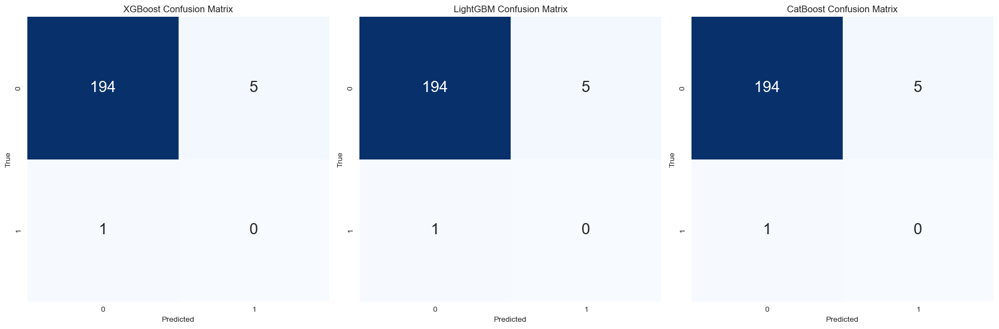

,변경일자,티커,시가총액변화율,시가총액변동성,시가총액평균순위,거래량변화율,거래량변동성,xgb_predict,lgb_predict,cat_predict,Vote,real_value
0,20221209,009900,-0.038072,0.029637,238.0,-1.215257,0.425048,1,1.0,1.0,3.0,0.0
1,20221209,073240,-0.037740,0.024812,251.0,0.266161,0.408099,1,1.0,1.0,3.0,0.0
2,20221209,294870,-0.038840,0.019918,310.0,0.582991,0.396357,1,1.0,1.0,3.0,0.0
3,20221209,105630,-0.023296,0.014201,338.0,0.339956,0.507225,1,1.0,1.0,3.0,0.0


편입 예측 종목 매수수익률 = 10.835
편출 예측 종목 공매도수익률 = -6.725
총수익률 = 4.110000000000001


In [60]:
returns30 = 0 
for date in inout_days[3:]:
    try: 
        ret_back = predict_and_test(date,n = 30)
        returns30 += ret_back
    except Exception as e:
        print(e)

In [61]:
print(f"30일전 예측한경우의 10년 return 평균 = {returns30/len(inout_days[3:]):.2f}%")

30일전 예측한경우의 10년 return 평균 = 2.19%


## 관건 2. 역방향 수익률 
- 이전에는 편입종목을 예측하여 매수, 편출종목을 예측하여 공매도 하였지만 이번에는 거꾸로
- 편입편출 직후 구매하여 100영업일(약 20주)에 편입종목을 공매도, 편출종목을 매수하면 했을때 수익률을 확인해보자

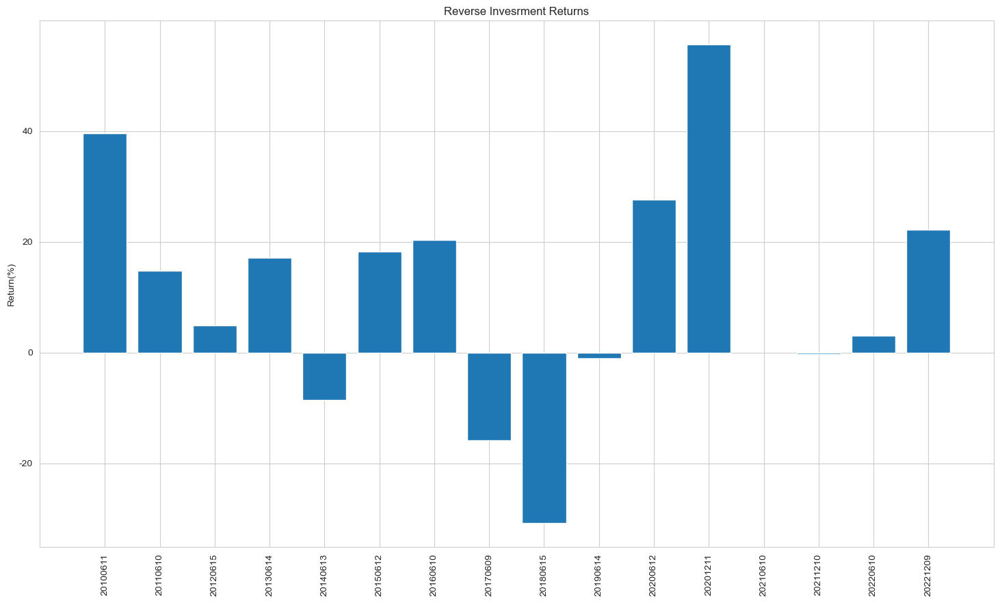

In [55]:
plt.figure(figsize=(18, 10))
reverse_dict = dict()
for test_date in inout_days:
    reverse_df = stock.get_market_price_change(change_date(test_date, n = 0), change_date(test_date, n = -100)) #20주 뒤(100영업일 뒤)
    time.sleep(0.5)
    revere_in_ret = reverse_df[reverse_df.index.isin(ks200inout[test_date]['in'])]['등락률'].mean()
    revere_out_ret = reverse_df[reverse_df.index.isin(ks200inout[test_date]['out'])]['등락률'].mean()
    reverse_dict[test_date] = revere_out_ret - revere_in_ret
    
plt.bar(list(reverse_dict.keys()), list(reverse_dict.values()))
plt.ylabel('Return(%)')
plt.title('Reverse Invesrment Returns')
plt.xticks(rotation=90) 
plt.show()

In [77]:
reverse_ret = np.mean([one for one in list(reverse_dict.values()) if one > 0 or one < 0])
print(f'역방향 수익률은 {reverse_ret:.2f}%입니다')

역방향 수익률은 11.14%입니다


# 결과 분석

편입/편출 예측 결과
- 3가지 그래디언트 부스팅 모델을 사용하여 코스피 편입/예측 성능은 좋지 않았다.
- 하지만 예측한 종목들을 기반으로 편입예측 종목은 매수, 편출예측 종목을 공매도하여 편입/편출 5개장일전(1주)에 수익화하였을때 수익률의 결과는 좋았다. 아마 정기변경일 전에 수익화하여서 기대받는 종목들이 상승 부분들까지 모형이 캐치하여 좋은 성과를 보인게 아닌가 싶다

관건 1 : 최적의 예측 시기 탐색
- 120일 90일, 60일, 30일(개장일수 기준)으로 나누어 확인해본결과
     1. 120일전 예측한경우의 10년 return 평균 = 10.31%.
     2. 90일전 예측한경우의 10년 return 평균= 6.55%
     3. 60일전 예측한경우의 10년 return 평균= 3.83%
     4. 30일전 예측한경우의 10년 return 평균 = 2.19%

관건 2 : 역방향 수익률
- 편입편출 직후 구매하여 100영업일(약 20주)에 편입종목을 공매도, 편출종목을 매수하면 했을때 수익률을 확인해보았을떄
- 수익률의 변동성이 높긴하지만 대체적으로 좋게나온다 : 11.14%

결론 : 정기편입일이 다가올때마다 ....일 전에 모형이 제시해준 포트폴리오를 구성한후 정기변경일 5개장일(1주)전에 수익화한후 정기변경 직후 역방향으로 다시 포트폴리오를 구성해서 100영업일(약 20주) 후 수익화한다면 평균적으로 21.45%의 좋은 수익를의 기댓값을 기대해볼 수 있음. 하지만 수익률의 변동성은 높을 것으로 예상됨